In [1]:
import os,sys,glob
# Move two levels up work from project level, not location of analysis file
os.chdir('../..')
print(os.getcwd())
import numpy as np
import matplotlib.pyplot as plt
import json
import pandas as pd
import Functions.globalFunctions.ExtracellularField as EcF
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap
from typing import Literal
from scipy import integrate
import ipympl
import time
import seaborn as sns
from scipy import stats
from scipy import optimize
#import warnings
from Analyses.SDC_singlePulse_singleOpticField.tools import *
from Analyses.SDC_singlePulse_singleOpticField import loader

import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.anova import anova_lm
#warnings.filterwarnings('error',category=UserWarning)

%matplotlib inline
recollect = False

font = {'family': 'helvetica',
        'size': 10}
mpl.rc('font', **font)
linestyle_str = ['solid', 'dotted', 'dashed', 'dashdot']
cmap_tab20 = np.array(mpl.cm.get_cmap('tab20').colors)
def myfun(x, y): return list(mpl.colors.to_rgb(x))+[y]
colorkeyval = {'soma': myfun('tab:red', 1), 'axon': myfun('tomato', 1), 'apic': myfun('seagreen', 1),
                'basaldend': myfun('teal', 1), 'alldend': myfun('tab:cyan',1), 'allsec': myfun('tab:blue', 1),
                'pyr_1': list(cmap_tab20[2,:])+[1],'pyr_2': list(cmap_tab20[3,:])+[1],
                'bc_1': list(cmap_tab20[8,:])+[1],'bc_2': list(cmap_tab20[9,:])+[1], 'unclassified': [0, 0, 0]}
EET_pallete = {'mua_eet':'tab:blue','redus_eet':'tab:orange','Gmax_eet':'tab:green','roll_eet':'tab:red','cell_eet':'tab:cyan','loc_eet':'tab:gray'}
EET_pallete_paper = {'mua_eet':'#17a2b8ff','redus_eet':'#11694fff','Gmax_eet':'#38ad4bff','roll_eet':'#92235aff','cell_eet':'#5d37a2ff','loc_eet':'tab:gray'}

d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code


In [2]:
def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    if not cbar_kw is False:
        cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
        cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Show all ticks and label them with the respective list entries.
    ax.set_xticks(np.arange(data.shape[1]), labels=col_labels)
    ax.set_yticks(np.arange(data.shape[0]), labels=row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=1)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar

def heatmap2(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="",row_colors = None, column_colors = None, labelfs = 10, lw_grid=1, **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)
    if row_colors is not None:
        ax_row_cols = ax.inset_axes([-0.01, 0, 0.01, 1])
        ax_row_cols.spines[:].set_visible(False)
    if column_colors is not None:
        ax_column_cols = ax.inset_axes([0,1, 1, 0.01,])
        ax_column_cols.spines[:].set_visible(False)



    # Create colorbar
    if not cbar_kw is False:
        cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
        cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom", fontsize=labelfs)

    # Show all ticks and label them with the respective list entries.
    if column_colors is None:
        ax.set_xticks(np.arange(data.shape[1]), labels=col_labels,fontsize=labelfs)
        # Let the horizontal axes labeling appear on top.
        ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)
        # Rotate the tick labels and set their alignment.
        plt.setp(ax.get_xticklabels(), rotation=-45, ha="right",
             rotation_mode="anchor")

    else:
        ax_column_cols.imshow(column_colors,aspect='auto')
        ax_column_cols.set_xticks(np.arange(data.shape[0]), labels=col_labels,fontsize=labelfs)
        ax_column_cols.set_xticks(np.arange(data.shape[0]+1)-.5, minor=True)
        ax_column_cols.set_yticks([])
        ax_column_cols.tick_params(which="minor", bottom=False, left=False)
        ax.set_xticks([])
        # Let the horizontal axes labeling appear on top.
        ax_column_cols.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)
        # Rotate the tick labels and set their alignment.
        plt.setp(ax_column_cols.get_xticklabels(), rotation=-45, ha="right",
             rotation_mode="anchor")

    if row_colors is None:
        ax.set_yticks(np.arange(data.shape[0]), labels=row_labels,fontsize=labelfs)
        ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    else:
        ax_row_cols.imshow(row_colors,aspect='auto')
        ax_row_cols.set_yticks(np.arange(data.shape[0]), labels=row_labels,fontsize=labelfs)
        ax_row_cols.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
        ax_row_cols.set_xticks([])
        ax_row_cols.tick_params(which="minor", bottom=False, left=False)

        ax.set_yticks([])
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.grid(which="minor", color="w", linestyle='-', linewidth=lw_grid)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar
def sort_xy_based_x(x,y):
    x = np.array(x)
    y = np.array(y)
    sort_idx = np.argsort(x)
    x = x[sort_idx]
    y = y[sort_idx]
    return x,y

def modify_plot(*args, **kwargs):
    if "ax" in kwargs:
      ax = kwargs['ax']
    else:
      ax = plt.gca()
    xpoints = ypoints = ax.get_xlim()
    ax.plot(xpoints, ypoints, linestyle='--', color='k', lw=1, scalex=False, scaley=False)

def broken_boxplot(df,break_points, yaxratio=1, fig = None,**boxplot_kwargs):
    if fig is None:
        fig = plt.figure()
    if yaxratio==1:
        ax1, ax2 = fig.subplots(2, 1, sharex=True)
    else:
        gs = fig.add_gridspec(2, 1, height_ratios=(1, yaxratio))
        ax1 = fig.add_subplot(gs[0])
        ax2 = fig.add_subplot(gs[1], sharex=ax1)
    fig.subplots_adjust(hspace=0.05)  # adjust space between axes

    # plot the same data on both axes
    sns.boxplot(df,ax=ax1,**boxplot_kwargs)
    sns.boxplot(df,ax=ax2,**boxplot_kwargs)
    ylims = ax1.get_ylim()
    # zoom-in / limit the view to different portions of the data
    ax1.set_ylim(break_points[1], ylims[1])  # outliers only
    ax2.set_ylim(ylims[0], break_points[0]) # most of the data

    # hide the spines between ax and ax2
    ax1.spines.bottom.set_visible(False)
    ax2.spines.top.set_visible(False)
    ax1.tick_params(labeltop=False)  # don't put tick labels at the top
    ax2.xaxis.tick_bottom()

    # Now, let's turn towards the cut-out slanted lines.
    # We create line objects in axes coordinates, in which (0,0), (0,1),
    # (1,0), and (1,1) are the four corners of the axes.
    # The slanted lines themselves are markers at those locations, such that the
    # lines keep their angle and position, independent of the axes size or scale
    # Finally, we need to disable clipping.

    d = .5  # proportion of vertical to horizontal extent of the slanted line
    kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
                linestyle="none", color='k', mec='k', mew=1, clip_on=False)
    ax1.plot([0], [0], transform=ax1.transAxes, **kwargs)
    ax2.plot([0], [1], transform=ax2.transAxes, **kwargs)
    return fig, ax1, ax2
def find_outliers_IQR(df):
   q1=df.quantile(0.25)
   q3=df.quantile(0.75)
   IQR=q3-q1
   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))].copy()
   return outliers, IQR

def EET_indices(r:int, xmin:np.ndarray, xmax:np.ndarray, X:np.ndarray, Y:np.ndarray, design_type:Literal['radial', 'trajectory'], Nboot:int=1, alfa:float=0.05):
    '''
    Compute the sensitivity indices according to the Elementary Effects Test
    (Saltelli, 2008) or 'method of Morris' (Morris, 1991).
    These are: the mean (mi) of the EEs associated to input 'i',
    which measures the input influence; and the standard deviation (sigma)
    of the EEs, which measures its level of interactions with other inputs.

    Basic usage:
    [mi, sigma, EE] = EET_indices(r,xmin,xmax,X,Y,design_type)

    Input:
        r = number of sampling point                           - scalar
        xmin = lower bounds of input ranges                 - vector (1,M)
        xmax = upper bounds of input ranges                 - vector (1,M)
        X = matrix of sampling datapoints where EE must be computed
                                                        - matrix (r*(M+1),M)
        Y = associated output values               - vector (r*(M+1),1)
        design_type = design type (string)
                [options: 'radial','trajectory']
    Output:
        mi = mean of the elementary effects               - vector (1,M)
        sigma = standard deviation of the elementary effects - vector (1,M)
        EE = matrix of elementary effects                 - matrix (r,M)


    Advanced usage:

    [mi, sigma, EE] = EET_indices(r,xmin,xmax,X,Y,design_type,Nboot)
    [mi, sigma, EE] = EET_indices(r,xmin,xmax,X,Y,design_type,Nboot,alfa)

    Optional input:
        Nboot = number of resamples used for boostrapping (default:0)
        alfa = significance level for the confidence intervals estimated
                by bootstrapping (default: 0.05)
    In this case, the output 'mi' and 'sigma' are the mean and standard
    deviation of the EEs averaged over Nboot resamples.

    Advanced usage/2:

    [mi, sigma, EE, mi_sd, sigma_sd, mi_lb, sigma_lb, mi_ub, sigma_ub] = ...
                EET_indices(r,xmin,xmax,X,Y,design_type,Nboot)

    Optional output:
        mi_sd = standard deviation of 'mi' across Nboot resamples
        sigma_sd = standard deviation of 'sigma' across Nboot resamples
        mi_lb = lower bound of 'mi' (at level alfa) across Nboot resamples
        sigma_lb = lower bound of 'sigma' across Nboot resamples
        mi_ub = upper bound of 'mi' (at level alfa) across Nboot resamples
        sigma_ub = upper bound of 'sigma' across Nboot resamples
                                                    - all the above are
                                                    vector (1,M) if Nboot>1
                                                    (empty vector otherwise)
    Or:

    [mi, sigma, EE, mi_sd, sigma_sd, mi_lb, sigma_lb, mi_ub, sigma_ub, ...
        mi_all, sigma_all ] = EET_indices(r,xmin,xmax,X,Y,design_type,Nboot)

    Optional output:
        mi_all = Nboot estimates of 'mi'                    - matrix (Nboot,M)
        sigma_all = Nboot estimates of 'sigma'                 - matrix (Nboot,M)

    REFERENCES:

    Morris, M.D. (1991), Factorial sampling plans for preliminary
    computational experiments, Technometrics, 33(2).

    Saltelli, A., et al. (2008) Global Sensitivity Analysis, The Primer,
    Wiley.

    This function is part of the SAFE Toolbox by F. Pianosi, F. Sarrazin
    and T. Wagener at Bristol University (2015).
    SAFE is provided without any warranty and for non-commercial use only.
    For more details, see the Licence file included in the root directory
    of this distribution.
    For any comment and feedback, or to discuss a Licence agreement for
    commercial use, please contact: francesca.pianosi@bristol.ac.uk
    For details on how to cite SAFE in your publication, please see:
    bristol.ac.uk/cabot/resources/safe-toolbox/
    '''

    ## Input check
    if not isinstance(r,int):
        raise ValueError("r should be integer")
    if np.ndim(xmin)!=1 or  np.ndim(xmax)!=1:
        raise ValueError("xmax must be a row vector")
    if len(xmin)!=len(xmax):
        raise ValueError("xmin should have same length as xmax")

    Dr = xmax - xmin

    if any(Dr<0):
        raise ValueError("all components of ''xmax'' must be higher than the corresponding ones in xmin")
    M = len(Dr)
    n,m = np.shape(X)
    if n!=r*(M+1):
        raise ValueError("X must have r*(M+1) rows")
    if m!=M:
        raise ValueError("X must have M columns")
    if np.ndim(Y)!=1:
        raise ValueError("Y must be 1 dim array")
    n = np.size(Y)
    if n!=r*(M+1):
        raise ValueError("Y must have r*(M+1) rows")

    ## EET calculation

    M = X.shape[1]
    EE = np.full((r, M), np.nan)  # matrix of elementary effects
    k = 0
    ki = 0
    for i in range(r):
        for j in range(M):
            if design_type == 'radial':  # radial design: EE is the difference
                # between output at one point in the i-th block and output at
                # the 1st point in the block
                dy = abs(Y[k + 1] - Y[ki])
                dx = abs(X[k + 1, j] - X[ki, j])
                EE[i, j] = dy/ dx * Dr[j]
            elif design_type == 'trajectory':  # trajectory design: EE is the difference
                # between output at one point in the i-th block and output at
                # the previous point in the block (the "block" is indeed a
                # trajectory in the input space composed of points that
                # differ in one component at the time)
                idx = np.where(abs(X[k + 1, :] - X[k, :]) > 0)[0]  # if using 'morris'
                # sampling, the points in the block may not
                # be in the proper order, i.e. each point in the block differs
                # from the previous/next one by one component but we don't know
                # which one; this is here computed and saved in 'idx'
                if len(idx) == 0:
                    raise ValueError(f"X({k},:) and X({k+1},:) are equal")
                if len(idx) > 1:
                    raise ValueError(f"X({k},:) and X({k+1},:) differ in more than one component")
                EE[i, idx] = abs(Y[k + 1] - Y[k]) / abs(X[k + 1, idx] - X[k, idx]) * Dr[idx]
            else:
                raise ValueError("'design_type' must be one among {'radial','trajectory'}")
            k += 1
        k += 1
        ki = k

    if Nboot > 1:
        bootsize = r
        B = np.floor((np.random.rand(bootsize,Nboot)*r)).astype(int)
        mi_all = np.empty((Nboot,M))
        sigma_all = np.empty((Nboot,M))
        for n in range(Nboot):
            mi_all[n,:] = np.mean(EE[B[:,n],:], axis=0)
            sigma_all[n,:] = np.std(EE[B[:,n],:], axis=0)

        mi = np.mean(mi_all, axis=0)
        mi_sd = np.std(mi_all, axis=0)
        mi_lb = np.sort(mi_all, axis=0)[max(1,round(Nboot*alfa/2))-1,:]
        mi_ub = np.sort(mi_all, axis=0)[round(Nboot*(1-alfa/2))-1,:]

        sigma = np.mean(sigma_all, axis=0)
        sigma_sd = np.std(sigma_all, axis=0)
        sigma_lb = np.sort(sigma_all, axis=0)[max(1,round(Nboot*alfa/2))-1,:]
        sigma_ub = np.sort(sigma_all, axis=0)[round(Nboot*(1-alfa/2))-1,:]

        return mi, sigma, EE, mi_sd, sigma_sd, mi_lb, sigma_lb, mi_ub, sigma_ub, mi_all, sigma_all
    else:
        mi = np.mean(EE, axis=0)
        sigma = np.std(EE, axis=0)
        return mi, sigma, EE

def EET_plot(mi,sigma,labels,mi_lb=None,mi_ub=None,sigma_lb=None,sigma_ub=None,clrs=None,cc=None, ax=None, ms=14):
    if ax is None:
        plt.figure()
        ax = plt.gca()
    if clrs is None:
        clrs = list(mpl.colors.TABLEAU_COLORS.values())
    if isinstance(clrs,dict):
        clrs_dict = clrs
        clrs = []
        for l in labels:
            clrs.append(clrs_dict[l])
    # First plot EEs mean & std as circles:
    for m,s,label,clr in zip(mi, sigma, labels,clrs):
        ax.plot(m,s,'ok',markerfacecolor=clr,markersize=ms,markeredgecolor='k',zorder=1, label=label)
    if not (mi_lb is None or mi_ub is None or sigma_lb is None or sigma_ub is None):

        #plot first the larger confidence areas
        size_bounds=mi_ub-mi_lb
        idx = np.argsort(size_bounds)[::-1]

        for i in range(len(idx)):  # add rectangular shade:
            h = ax.fill([mi_lb[idx[i]],mi_lb[idx[i]],mi_ub[idx[i]],mi_ub[idx[i]]],[sigma_lb[idx[i]],sigma_ub[idx[i]],sigma_ub[idx[i]],sigma_lb[idx[i]]],facecolor=clrs[idx[i]],edgecolor='none',zorder=0)

        # Plot again the circles (in case some have been overriden by the rectangles
        # representing confidence bounds)
        for m,s,label,clr in zip(mi, sigma, labels, clrs):
            ax.plot(m,s,'ok',markerfacecolor=clr,markersize=ms,markeredgecolor='k',zorder=1, label=label)

# Loading data

In [3]:
# Load data
filepath = './Results/SDC/SDC_EETUgent470grayinvivo_singlePulse'
filename = 'all_data_filled_v2.csv'
drop_columns = ['opsinmech','distribution','distribution_method','seed','celsius','dt']


# opsinlocations to single word
opsinLocation_map = loader.opsinLocation_map
master_df = pd.read_csv(os.path.join(filepath, filename), index_col=0)
master_df['amp'] = master_df['amp']/1000 # convert W/m2 -> mW/mm2
for x in ['x','y','z']:
    for suffix in ['','_0']:
        master_df[x+suffix] = master_df[x+suffix]/1000 #convert um -> mm
master_df['TAC']=-master_df['ichr2']/master_df['dur']*1e-5 # convert to uA (ichr2: mA/cm2*um2)
master_df['Gmax'] = np.round(master_df['Gmax'],4)
master_df['theta_0'] = np.round(master_df['theta_0'],2)
for x in ['amp','Gmax','TAC','dur']:
    master_df[x+'_log10'] = np.round(np.log10(master_df[x]),4)

master_df = master_df.drop(drop_columns,axis=1)
master_df['neurontemplate'] = master_df['neurontemplate'].replace({'CA1_PC_cAC_sig5':'pyr_1', 'CA1_PC_cAC_sig6':'pyr_2', 'cNACnoljp1':'bc_1', 'cNACnoljp2':'bc_2'})
master_df[['celltype','cell_number']] = master_df['neurontemplate'].str.split('_',expand=True)
master_df['cluster_eet'] = master_df['EETsimidx']//7
master_df['idx_incluster_eet'] = master_df['EETsimidx']%7
all_columns=master_df.columns


all_settings_columns = ['dur', 'Gmax', 'EETsimidx', 'neurontemplate', 'theta_0','cluster_eet', 'idx_incluster_eet']

# change perspective from optrode centered to stratum pyramidale centred
for theta in master_df['theta_0'].unique():
    if theta<0:
        label = 'z'
        master_df.loc[master_df['theta_0']==theta,label]*=-1
        master_df.loc[master_df['theta_0']==theta,label+'_0']*=-1
    elif theta==0:
        label = 'x'
        master_df.loc[master_df['theta_0']==theta,label]*=-1
        master_df.loc[master_df['theta_0']==theta,label+'_0']*=-1
        toz = master_df.loc[master_df['theta_0']==theta,'x'].to_numpy()
        tox = master_df.loc[master_df['theta_0']==theta,'z'].to_numpy()
        toz_0 = master_df.loc[master_df['theta_0']==theta,'x_0'].to_numpy()
        tox_0 = master_df.loc[master_df['theta_0']==theta,'z_0'].to_numpy()
        master_df.loc[master_df['theta_0']==theta,'x'] = tox
        master_df.loc[master_df['theta_0']==theta,'z'] = toz
        master_df.loc[master_df['theta_0']==theta,'x_0'] = tox_0
        master_df.loc[master_df['theta_0']==theta,'z_0'] = toz_0

    master_df.loc[master_df['theta_0']==theta,'z']=np.round(master_df.loc[master_df['theta_0']==theta,'z']+master_df.loc[master_df['theta_0']==theta,'z_0'],3)
    master_df.loc[master_df['theta_0']==theta,'x']=np.round(master_df.loc[master_df['theta_0']==theta,'x']+master_df.loc[master_df['theta_0']==theta,'x_0'],3)


unique_values_columns_master = {key: master_df[key].unique() for key in all_columns}
for x in ['amp','Gmax','TAC','dur']:
    unique_values_columns_master[x] = np.sort(unique_values_columns_master[x])
    unique_values_columns_master[x+'_log10'] = np.sort(unique_values_columns_master[x+'_log10'])
for x in ['x', 'z', 'x_0', 'z_0']:
    unique_values_columns_master[x] = np.sort(unique_values_columns_master[x])
print('all coluumn names:\n\t',all_columns.to_numpy())
print('all settings:\n\t',all_settings_columns)
print('Total number of entries:\n\t',len(master_df))
for k in all_settings_columns+[x for x in all_columns if '_eet' in x]+['opsinlocations']:
    print(f'unique entries {k}:\n\t', len(unique_values_columns_master[k]),': ', unique_values_columns_master[k])
master_df.describe()

all coluumn names:
	 ['amp' 'sR' 'ichr2' 'gchr2' 'dur' 'field' 'nPulse' 'Gmax' 'opsinlocations'
 'x' 'y' 'z' 'phi' 'theta' 'psi' 'phi_0' 'theta_0' 'psi_0'
 'neurontemplate' 'x_0' 'y_0' 'z_0' 'EETsimidx' 'neurontemplate2'
 'celltype' 'number' 'mua_eet' 'mus_eet' 'g_eet' 'Gmax_eet' 'cell_eet'
 'loc_eet' 'roll_eet' 'TAC' 'amp_log10' 'Gmax_log10' 'TAC_log10'
 'dur_log10' 'cell_number' 'cluster_eet' 'idx_incluster_eet']
all settings:
	 ['dur', 'Gmax', 'EETsimidx', 'neurontemplate', 'theta_0', 'cluster_eet', 'idx_incluster_eet']
Total number of entries:
	 406560
unique entries dur:
	 5 :  [  1.           3.16227766  10.          31.6227766  100.        ]
unique entries Gmax:
	 21 :  [0.7699 0.8274 0.8669 0.8835 0.8988 0.9131 0.9267 0.9522 0.9764 0.9882
 1.     1.0236 1.0356 1.0478 1.0733 1.0869 1.1012 1.1331 1.1726 1.2301
 1.2794]
unique entries EETsimidx:
	 112 :  [  0   1  10 100 101 102 103 104 105 106 107 108 109  11 110 111  12  13
  14  15  16  17  18  19   2  20  21  22  23  24  25  2

,amp,sR,ichr2,gchr2,dur,nPulse,Gmax,x,y,z,...,cell_eet,loc_eet,roll_eet,TAC,amp_log10,Gmax_log10,TAC_log10,dur_log10,cluster_eet,idx_incluster_eet
count,321157.000000,321157.0,406560.000000,406560.000000,406560.000000,406560.0,406560.000000,406560.000000,406560.0,406560.000000,...,406560.000000,406560.000000,406560.000000,4.065600e+05,321157.000000,406560.000000,406560.000000,406560.000000,406560.000000,406560.000000
mean,894.062854,1.0,-1895.872525,0.720530,29.157011,1.0,0.996246,1.333333,0.0,0.150000,...,0.500000,1.236607,3.245027,3.512598e-03,2.234833,-0.005100,-3.137273,1.000000,7.500000,3.000000
std,1636.954307,0.0,2117.811735,48.130146,37.041492,0.0,0.125313,1.124230,0.0,0.347851,...,0.500001,0.969306,1.754237,7.227535e-03,0.987760,0.054941,0.946537,0.707108,4.609778,2.000002
min,0.026295,1.0,-21654.950300,-22159.528300,1.000000,1.0,0.769900,-1.000000,0.0,-0.400000,...,0.000000,0.000000,0.196350,3.976700e-07,-1.580100,-0.113600,-6.400500,0.000000,0.000000,0.000000
25%,46.018127,1.0,-2382.160200,0.027300,3.162278,1.0,0.909525,0.500000,0.0,-0.180000,...,0.000000,0.000000,1.570796,3.333512e-04,1.662900,-0.041200,-3.477100,0.500000,3.750000,1.000000
50%,219.597168,1.0,-1218.301900,0.148800,10.000000,1.0,0.994100,1.250000,0.0,0.150000,...,0.500000,1.000000,3.337942,8.216448e-04,2.341600,-0.002600,-3.085300,1.000000,7.500000,3.000000
75%,889.719238,1.0,-599.638950,0.764800,31.622777,1.0,1.076700,2.000000,0.0,0.480000,...,1.000000,2.000000,4.810564,3.464191e-03,2.949300,0.032075,-2.460400,1.500000,11.250000,5.000000
max,12109.375000,1.0,-0.055660,6255.707300,100.000000,1.0,1.279400,4.000000,0.0,0.700000,...,1.000000,3.000000,5.890486,8.759367e-02,4.083100,0.107000,-1.057500,2.000000,15.000000,6.000000


In [4]:
myselection = {'celltype':'bc', 'cluster_eet': 0, 'dur':1}
intm_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection)]
print_upscale = False
nan_tolerance_percentage = 0.95


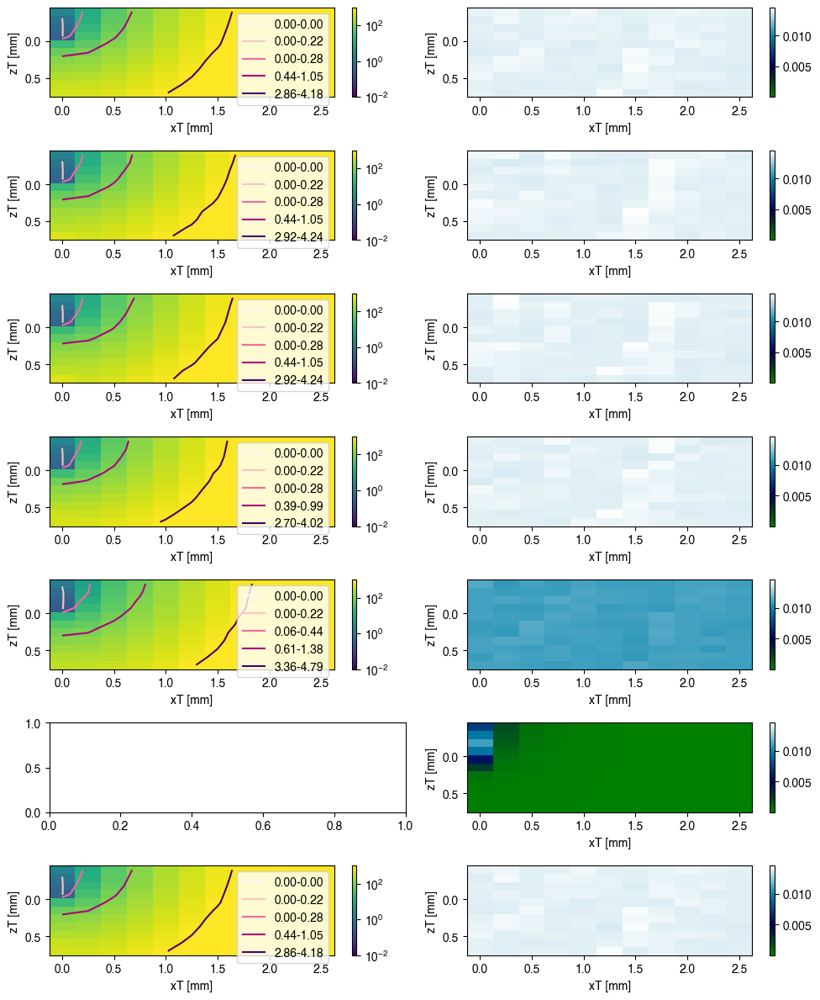

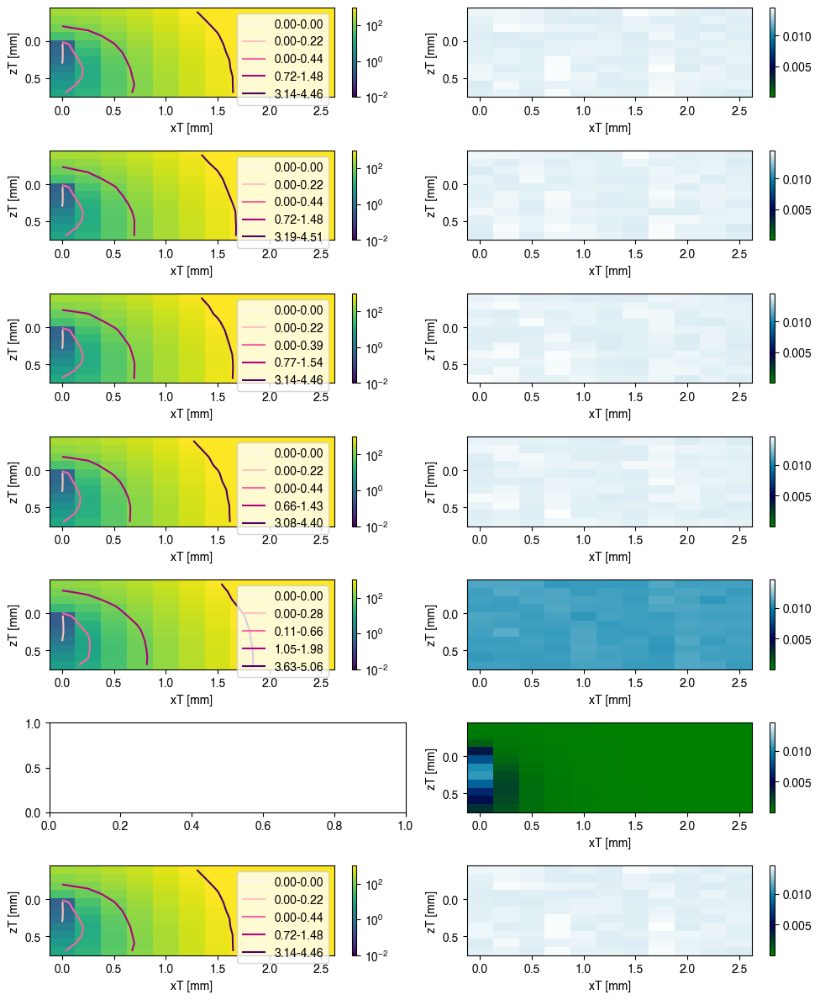

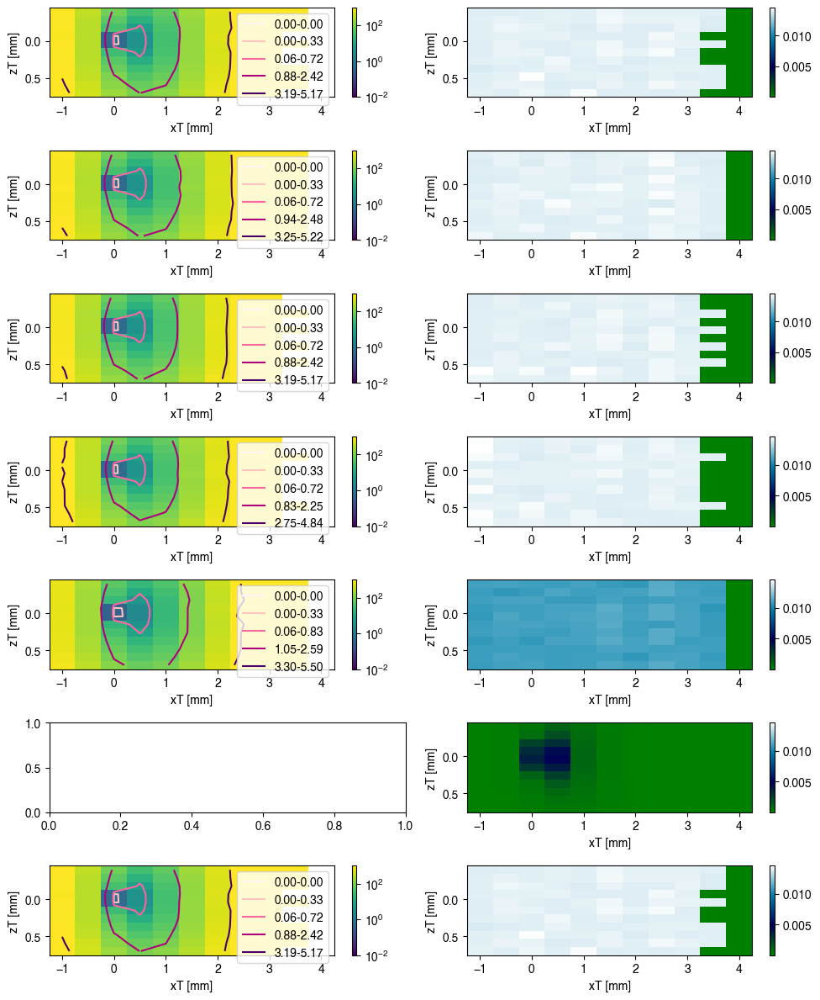

In [5]:


for theta in unique_values_columns_master['theta_0']:
    uiice = intm_df['idx_incluster_eet'].unique()
    fig,axs = plt.subplots(len(uiice),2,tight_layout = True,figsize=np.array([10,12]))
    for i, feat in enumerate(['amp','TAC']):
        if feat=='amp':
            levels = np.logspace(-1,3,5)
            norm_log = mpl.cm.colors.LogNorm(vmax=1000, vmin=0.01)
            norm_log_cntr = mpl.cm.colors.LogNorm(vmax=levels[-1], vmin=levels[0])
            plot_cntr = True
        else:
            plot_cntr = False
        for iice, ax in zip(uiice,axs[:,i]):
            single_config_df = intm_df[selection_generator(intm_df,unique_values_columns_master,verbose=False,**{**myselection, 'theta_0':theta,'idx_incluster_eet':iice})].reset_index(drop=True)
            if not np.all(np.isnan(single_config_df[feat])):
                data_toplot = np.array((single_config_df['x'],single_config_df['z'],single_config_df[feat])).T
                # if ninterp, data_toplot[-1] is in 'ij' order
                data_toplot = EcF.prepareDataforInterp(data_toplot,'ninterp',sorted=False)
                yY, zZ = np.meshgrid(np.linspace(data_toplot[0].min(),data_toplot[0].max(),len(np.unique(data_toplot[0])),endpoint=True),np.linspace(data_toplot[1].min(),data_toplot[1].max(),len(np.unique(data_toplot[0])),endpoint=True),indexing='ij')

                if sum(np.isnan(data_toplot[-1].flatten()))/len(data_toplot[-1].flatten()) < nan_tolerance_percentage:
                    if plot_cntr:
                        im,cntr,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,contour_kwargs={'norm':norm_log_cntr,'cmap':'RdPu','levels':levels})
                        h, l = cntr.legend_elements("I")
                        if theta!=0:
                            surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(yY,zZ,data_toplot[2],intensity = levels,radial_data=True,gridorder = 'ij')
                        else:
                            surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(yY,zZ,data_toplot[2],intensity = levels,radial_data=False,gridorder = 'ij')
                        ax.legend(h, [f'{x:0.2f}-{y:0.2f}' if ~np.isnan(x) else '-' for x,y in zip(surf_low,surf_up)],ncol=1,loc='upper right')
                    else:
                        TAC_min = np.nanmin(intm_df[feat])
                        TAC_max = np.nanmax(intm_df[feat])
                        norm_log = mpl.cm.colors.Normalize(vmax=TAC_max, vmin=TAC_min)
                        im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,cmap='ocean')
                    ax.set_xlabel('xT [mm]')
                    ax.set_ylabel('zT [mm]')


c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


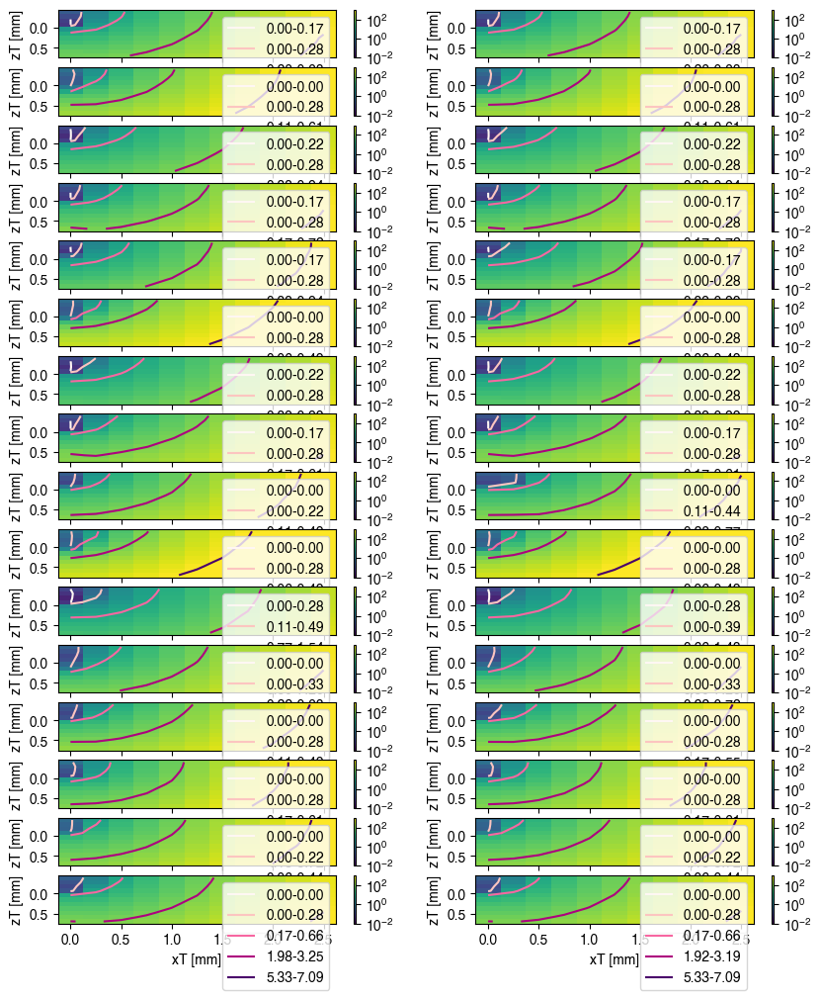

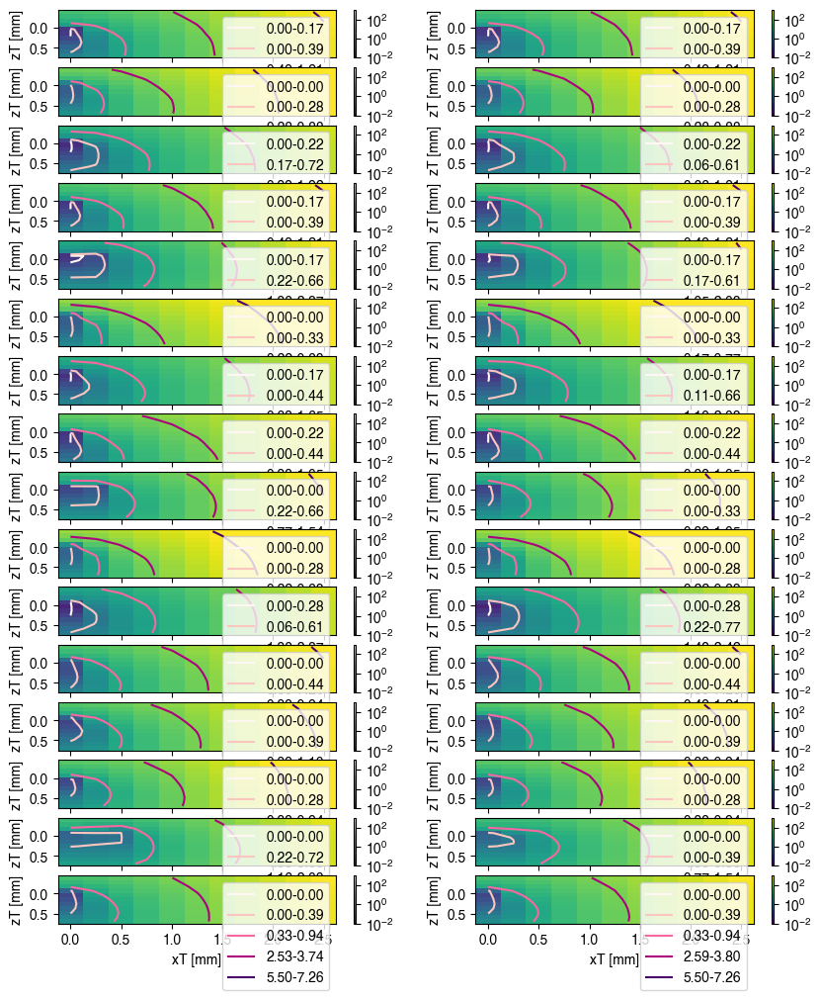

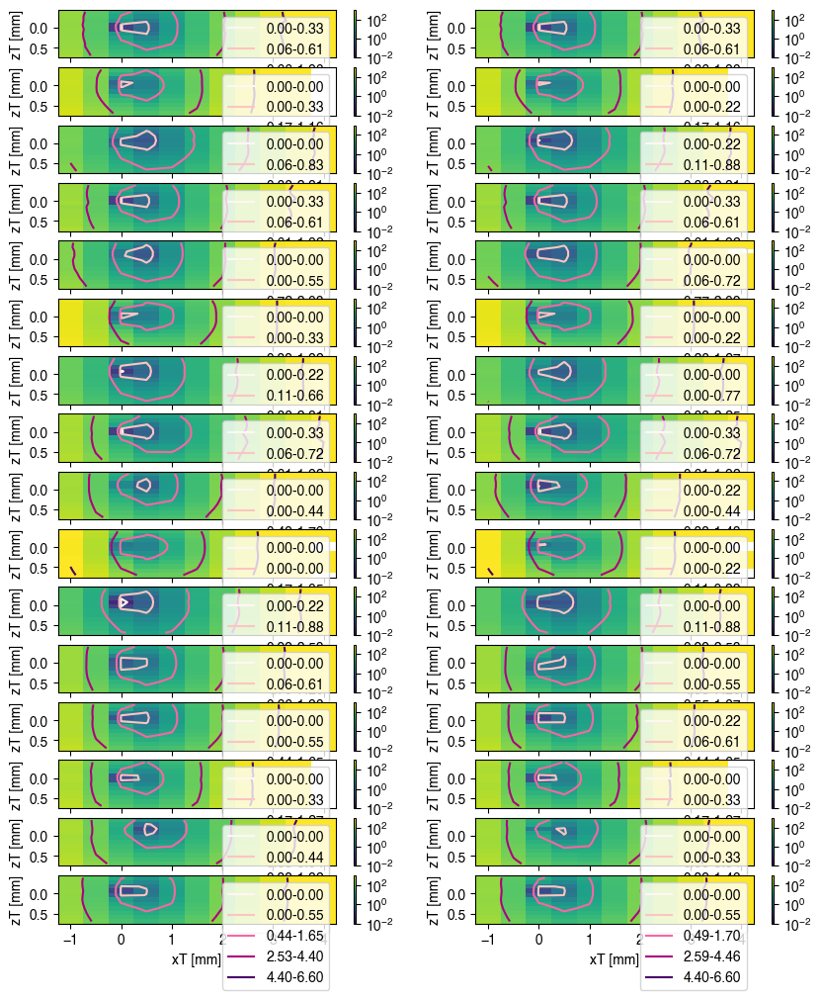

In [6]:
myselection = {'celltype':'pyr'}
intm_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection)]
print_upscale = False
nan_tolerance_percentage = 0.95
feat = 'amp'
for theta in unique_values_columns_master['theta_0']:
    ucle = np.unique(intm_df['cluster_eet'])
    fig,axs = plt.subplots(len(ucle),2,tight_layout = True,figsize=np.array([10,12]))
    for i, iice in enumerate([0,6]):
        if feat=='amp':
            levels = np.logspace(-1,3,5)
            norm_log = mpl.cm.colors.LogNorm(vmax=1000, vmin=0.01)
            norm_log_cntr = mpl.cm.colors.LogNorm(vmax=levels[-1], vmin=levels[0])
            plot_cntr = True
        else:
            plot_cntr = False
        for icle, ax in zip(ucle,axs[:,i]):
            single_config_df = intm_df[selection_generator(intm_df,unique_values_columns_master,verbose=False,**{**myselection,'dur':10,'theta_0':theta,'idx_incluster_eet':iice, 'cluster_eet':icle})].reset_index(drop=True)
            if not np.all(np.isnan(single_config_df[feat])):
                data_toplot = np.array((single_config_df['x'],single_config_df['z'],single_config_df[feat])).T
                # if ninterp, data_toplot[-1] is in 'ij' order
                data_toplot = EcF.prepareDataforInterp(data_toplot,'ninterp',sorted=False)
                yY, zZ = np.meshgrid(np.linspace(data_toplot[0].min(),data_toplot[0].max(),len(np.unique(data_toplot[0])),endpoint=True),np.linspace(data_toplot[1].min(),data_toplot[1].max(),len(np.unique(data_toplot[0])),endpoint=True),indexing='ij')

                if sum(np.isnan(data_toplot[-1].flatten()))/len(data_toplot[-1].flatten()) < nan_tolerance_percentage:
                    if plot_cntr:
                        im,cntr,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,contour_kwargs={'norm':norm_log_cntr,'cmap':'RdPu','levels':levels})
                        h, l = cntr.legend_elements("I")
                        if theta!=0:
                            surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(yY,zZ,data_toplot[2],intensity = levels,radial_data=True,gridorder = 'ij')
                        else:
                            surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(yY,zZ,data_toplot[2],intensity = levels,radial_data=False,gridorder = 'ij')
                        ax.legend(h, [f'{x:0.2f}-{y:0.2f}' if ~np.isnan(x) else '-' for x,y in zip(surf_low,surf_up)],ncol=1,loc='upper right')
                    else:
                        TAC_min = np.nanmin(intm_df[feat])
                        TAC_max = np.nanmax(intm_df[feat])
                        norm_log = mpl.cm.colors.Normalize(vmax=TAC_max, vmin=TAC_min)
                        im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,cmap='ocean')
                    ax.set_xlabel('xT [mm]')
                    ax.set_ylabel('zT [mm]')

# VTA/STA

In [7]:
vta_filename = 'vta_logspace(-1,3,9)_v2.csv'
vta_df = loader.load_vta_df(filepath, vta_filename, recollect = False)
vta_df.head()
for x in ['Gmax','dur','level','theta_0','psi_0']:
    vta_df[x] = np.round(vta_df[x],3)

print('!!!!! Remove nans surf_avg to 0!!!!!')
vta_df.loc[np.isnan(vta_df['surf_avg']),'surf_avg'] = 0
for x in ['vta_low','vta_up','surf_low','surf_up','dur','Gmax','level','surf_avg']:
    vta_df[x+'_log10'] = np.round(np.log10(vta_df[x]),4)
vta_df['neurontemplate'].unique()

try:
    vta_df['neurontemplate'] = vta_df['neurontemplate'].replace({'CA1_PC_cAC_sig5':'pyr_1', 'CA1_PC_cAC_sig6':'pyr_2', 'cNACnoljp1':'bc_1', 'cNACnoljp2':'bc_2'})
except Exception as e:
    print(e)
    pass
vta_df[['celltype','number']] = vta_df['neurontemplate'].str.split('_',expand=True)
vta_df['ct_theta'] = vta_df.apply(lambda row: f"{row['celltype']}_{row['theta_0']}", axis=1)
vta_df['redus_eet'] = vta_df['mus_eet']*(1-vta_df['g_eet'])
vta_df['cluster_eet'] = vta_df['EETsimidx']//7
vta_df['idx_incluster_eet'] = vta_df['EETsimidx']%7
vta_df['roll_eet'] = vta_df['roll_eet']-np.pi
vta_columns=vta_df.columns


vta_limit_df = vta_df.copy()
for x,maxsurf in zip(['surf_low','surf_up','surf_avg'],[5*1.1,2*2.75*1.32]):
    vta_limit_df[x] = np.minimum(vta_limit_df[x],np.round(maxsurf,4))
    vta_limit_df[x+'_log10'] = np.minimum(vta_limit_df[x+'_log10'],np.round(np.log10(maxsurf),4))

unique_values_columns_vta = {key: vta_df[key].unique() for key in vta_columns}
for x in ['vta_low','vta_up','surf_low','surf_up','surf_avg','dur','Gmax','level']:
    unique_values_columns_vta[x] = np.sort(unique_values_columns_vta[x])
    unique_values_columns_vta[x+'_log10'] = np.sort(unique_values_columns_vta[x+'_log10'])

len(vta_df)

!!!!! Remove nans surf_avg to 0!!!!!


c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, 

30240

## surfaces of activation for 100 mW/mm2 LightSource output

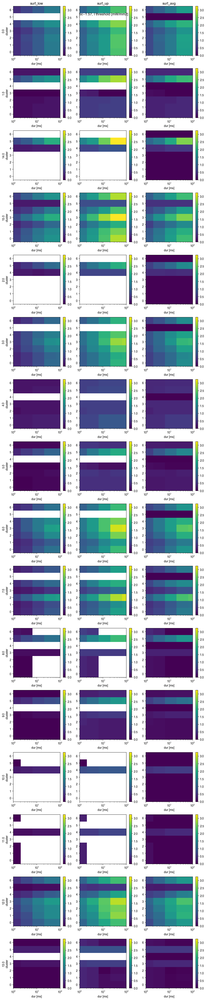

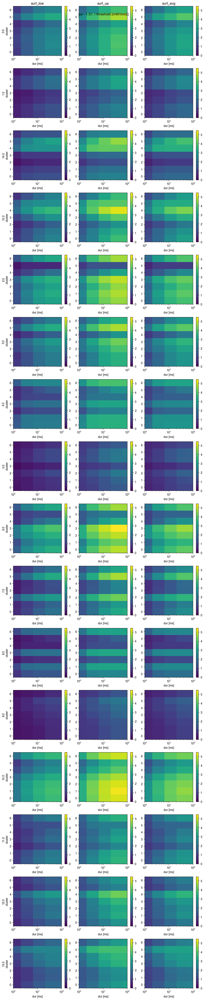

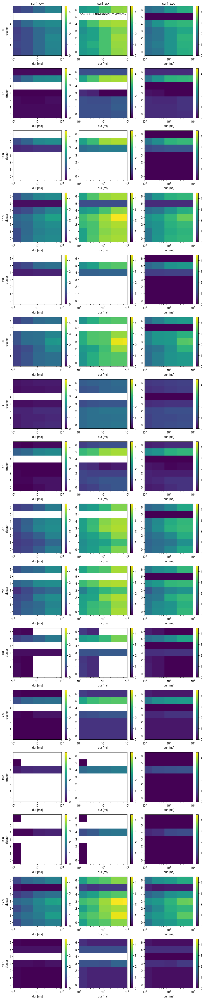

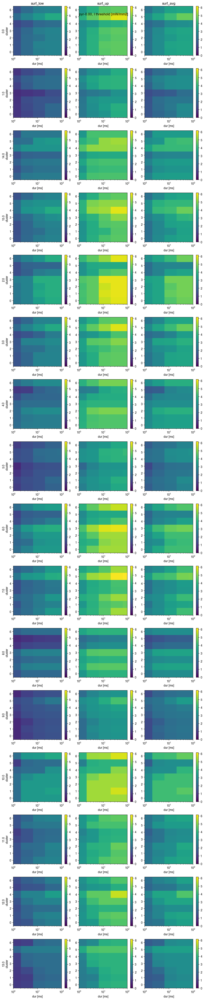

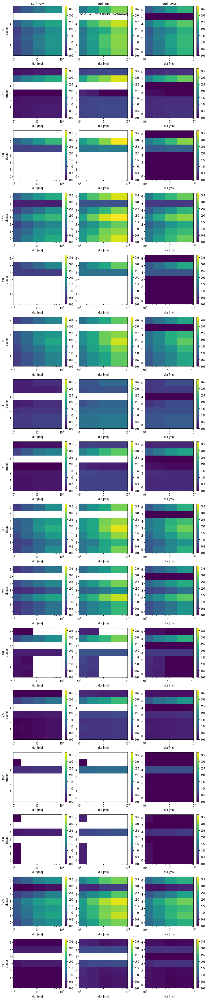

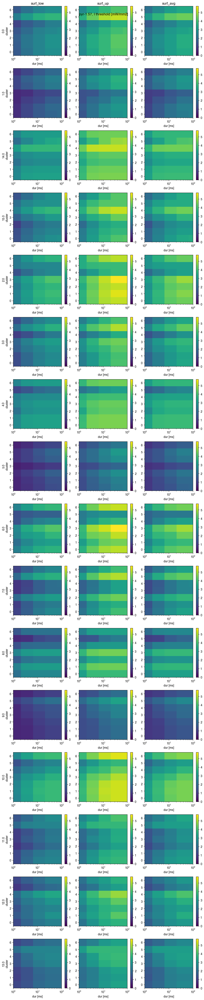

In [6]:
for pitch in unique_values_columns_vta['theta_0']:
    for cellt in unique_values_columns_vta['celltype']:
        fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,celltype=cellt,level=100,theta_0=pitch)]
        uAxesVals = fig_df['cluster_eet'].unique()
        fig,axs = plt.subplots(16,3,tight_layout = True,figsize = (10,3*len(uAxesVals)))
        for i,datalabel in enumerate(['surf_low','surf_up','surf_avg']):
            if not all(np.isnan(fig_df[datalabel])):
                Imin = 0#np.nanmin(fig_df[datalabel])
                if 'surf' in datalabel:
                    Imax = np.nanmax(fig_df[['surf_up','surf_low']].values)
                    norm = mpl.cm.colors.Normalize(vmax=Imax, vmin=Imin)
                else:
                    Imax = np.nanmax(fig_df[datalabel])
                    norm = mpl.cm.colors.PowerNorm(gamma=2,vmax=Imax, vmin=Imin)

                for oL,ax in zip(uAxesVals,axs[:,i]):
                    intm_df = fig_df[fig_df['cluster_eet']==oL]
                    data_toplot = EcF.prepareDataforInterp(np.array((intm_df['dur'],intm_df['idx_incluster_eet'],intm_df[datalabel])).T,'ninterp',sorted=False)
                    yY, zZ = np.meshgrid(data_toplot[0],data_toplot[1],indexing='ij')

                    im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm)
                    ax.set_xscale('log')
                    ax.set_xlim((min(intm_df['dur'].unique()),max(intm_df['dur'].unique())))
                    ax.set_xlabel('dur [ms]')
                    if i==0:
                        ax.set_ylabel(f'{oL}\ncluster')
                    if oL == uAxesVals[0]:
                        ax.set_title(datalabel)
        fig.suptitle(f'{cellt}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

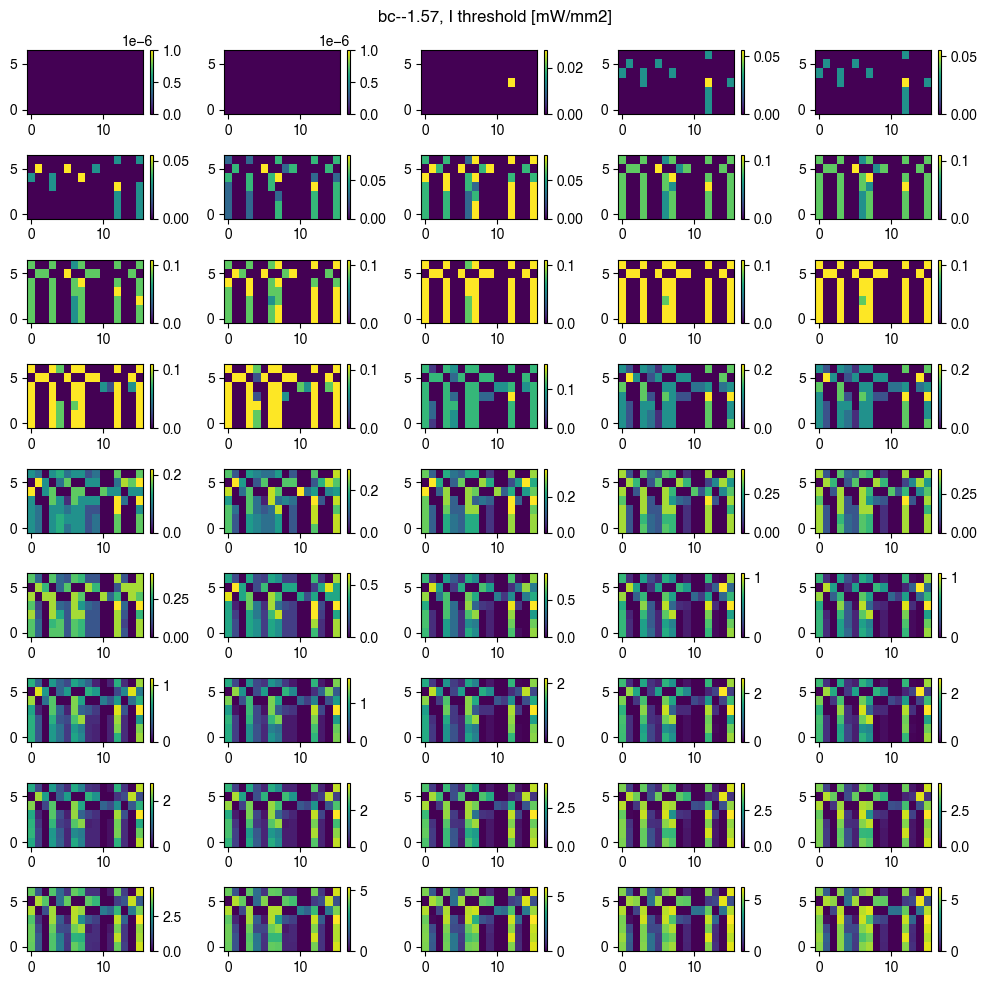

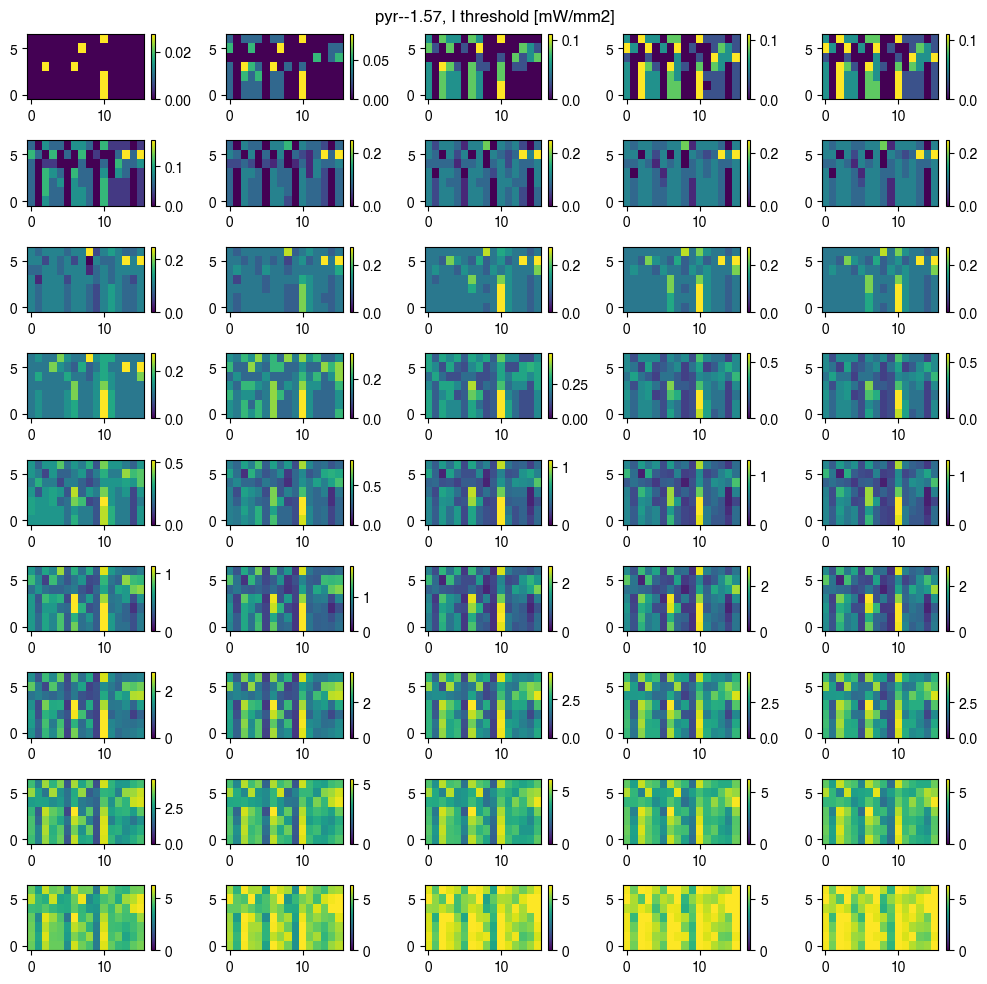

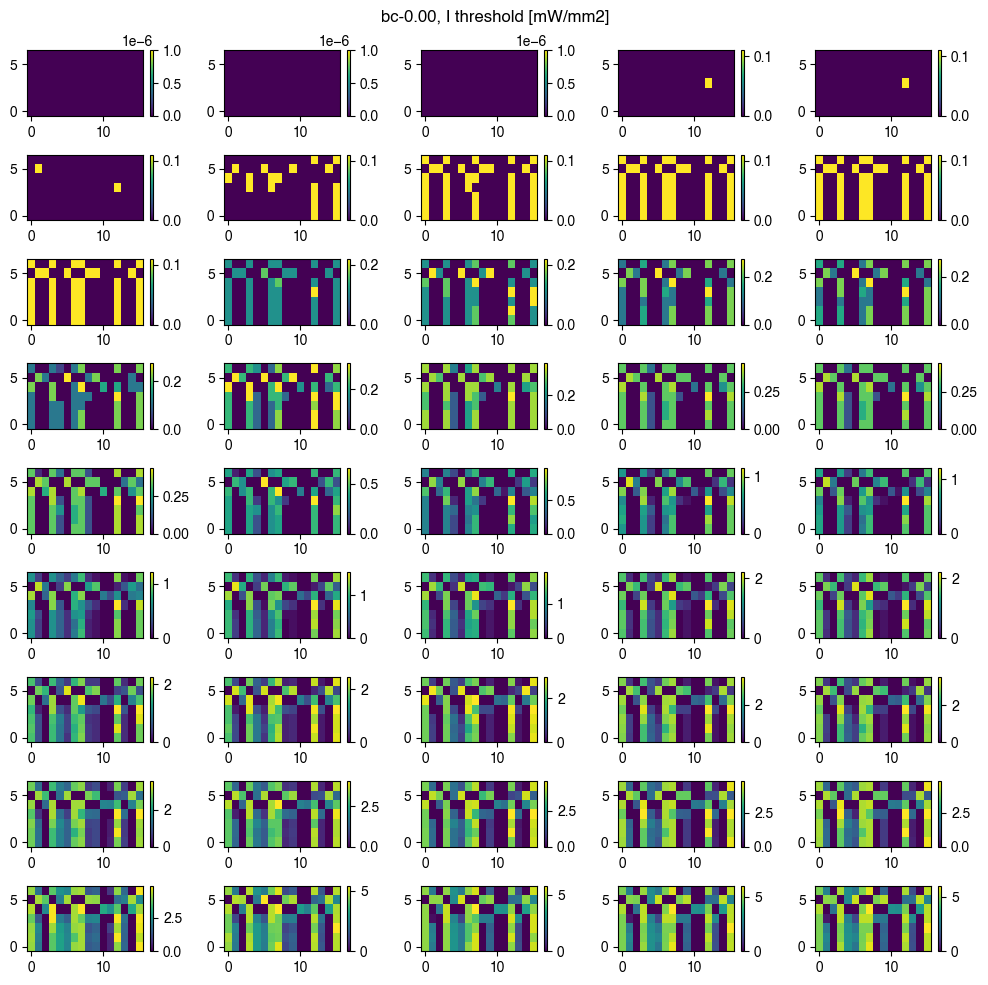

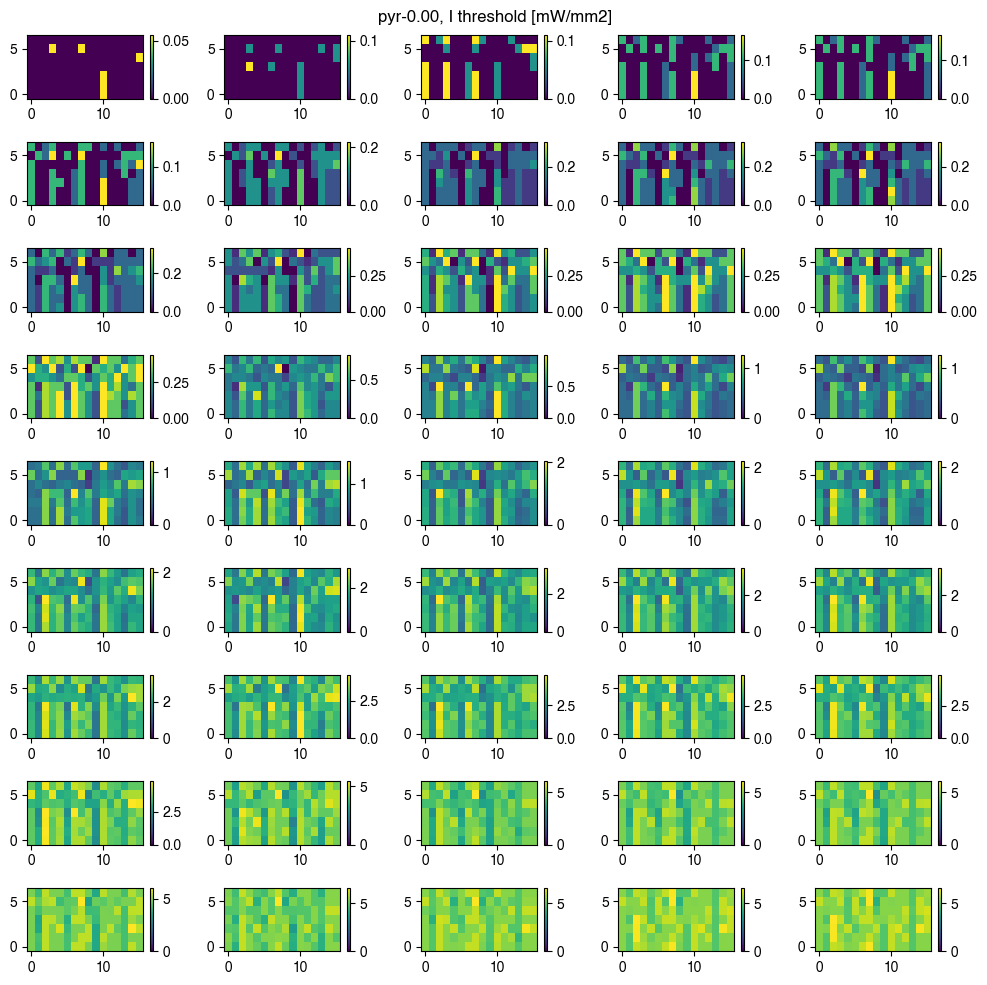

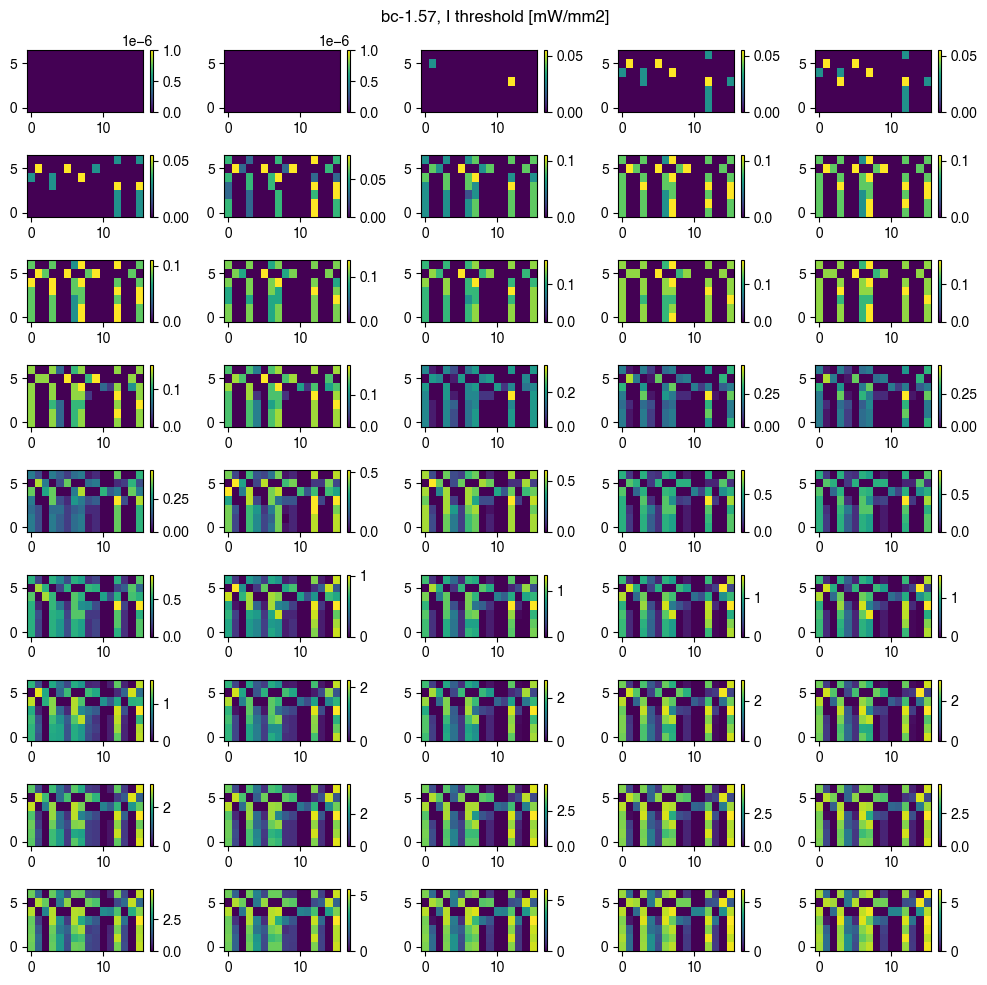

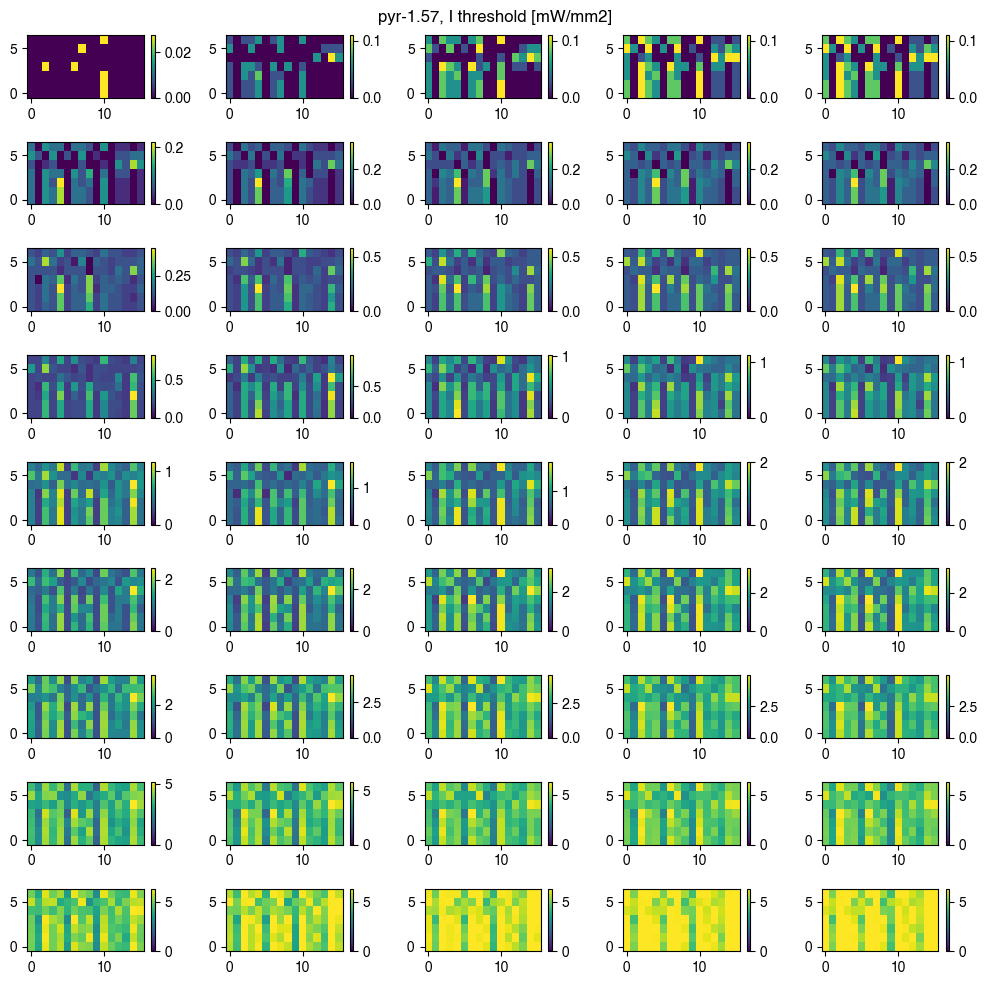

In [7]:
datalabel = 'surf_avg'
for pitch in unique_values_columns_vta['theta_0']:
    for cellt in unique_values_columns_vta['celltype']:
        fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,celltype=cellt,theta_0=pitch)]
        urowAxesVals = fig_df['level'].unique()[:]
        ucolumnAxesVals = fig_df['dur'].unique()[:]
        fig,axs = plt.subplots(len(urowAxesVals),len(ucolumnAxesVals), tight_layout=True,figsize=(10,10))
        for i, row in enumerate(urowAxesVals):
            for j, column in enumerate(ucolumnAxesVals):
                ax_df = fig_df[selection_generator(fig_df,unique_values_columns=unique_values_columns_vta,level=row,dur=column)]
                if not all(np.isnan(ax_df[datalabel])):
                    Imin = 0 #np.nanmin(fig_df[datalabel])
                    if 'surf' in datalabel:
                        Imax = max((np.nanmax(ax_df[datalabel].values),Imin+1e-6))
                        norm = mpl.cm.colors.Normalize(vmax=Imax, vmin=Imin)

                    data_toplot = EcF.prepareDataforInterp(np.array((ax_df['cluster_eet'],ax_df['idx_incluster_eet'],ax_df[datalabel])).T,'ninterp',sorted=False)
                    yY, zZ = np.meshgrid(data_toplot[0],data_toplot[1],indexing='ij')

                    im,cb = EcF.slicePlot(data_toplot,axs[i,j],fig,plotGrid=(yY,zZ),structured=True, norm=norm)
                    ax.set_xlabel('cluster_eet')
                    ax.set_ylabel('idx_incluster_eet')

        fig.suptitle(f'{cellt}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

C:\Users\rschoete\AppData\Local\Temp\ipykernel_9092\1475314153.py:17: RuntimeWarning: invalid value encountered in true_divide
  data_toplot[-1]=data_toplot[-1]/data_toplot[-1][:,0:1]*100
C:\Users\rschoete\AppData\Local\Temp\ipykernel_9092\1475314153.py:19: RuntimeWarning: All-NaN slice encountered
  Imin = np.nanmax((np.nanmin(data_toplot[-1].ravel()),1e-2))
C:\Users\rschoete\AppData\Local\Temp\ipykernel_9092\1475314153.py:21: RuntimeWarning: All-NaN slice encountered
  Imax = np.nanmax((np.nanmax(data_toplot[-1].ravel()),Imin+1e-2))
C:\Users\rschoete\AppData\Local\Temp\ipykernel_9092\1475314153.py:17: RuntimeWarning: divide by zero encountered in true_divide
  data_toplot[-1]=data_toplot[-1]/data_toplot[-1][:,0:1]*100


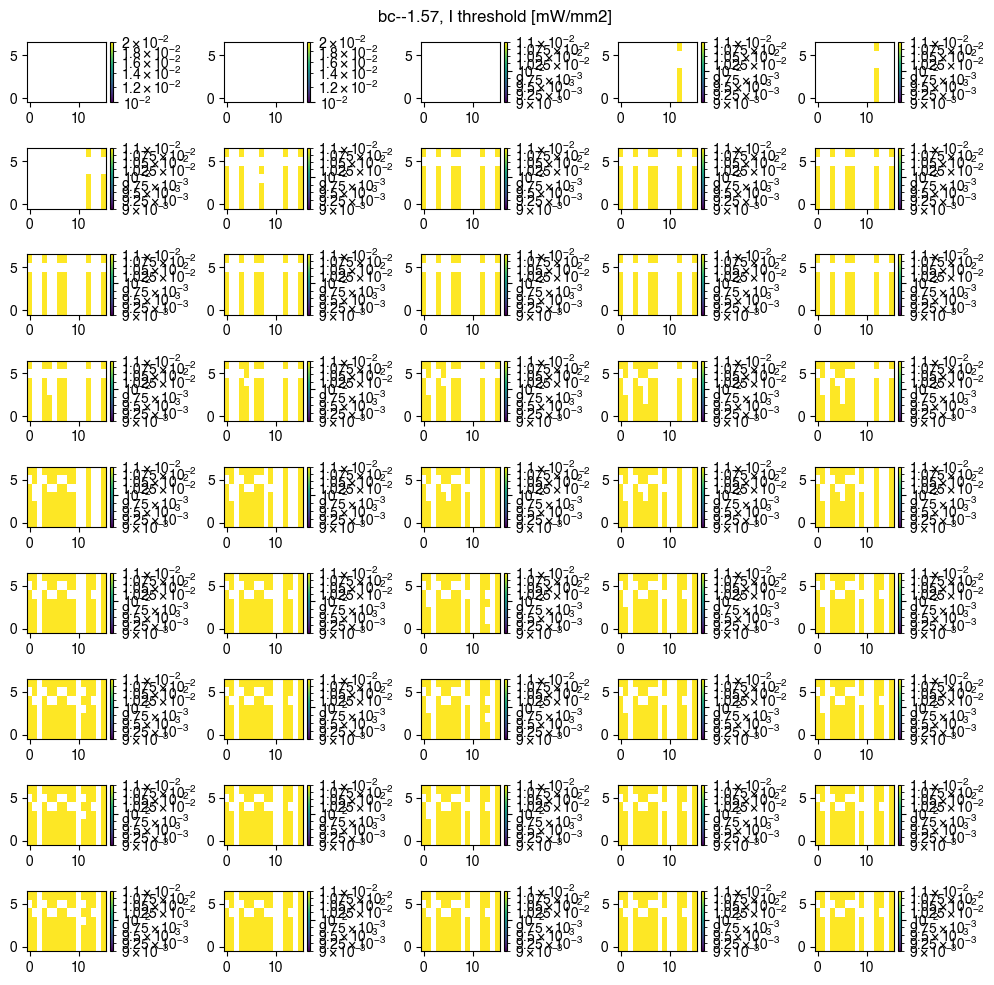

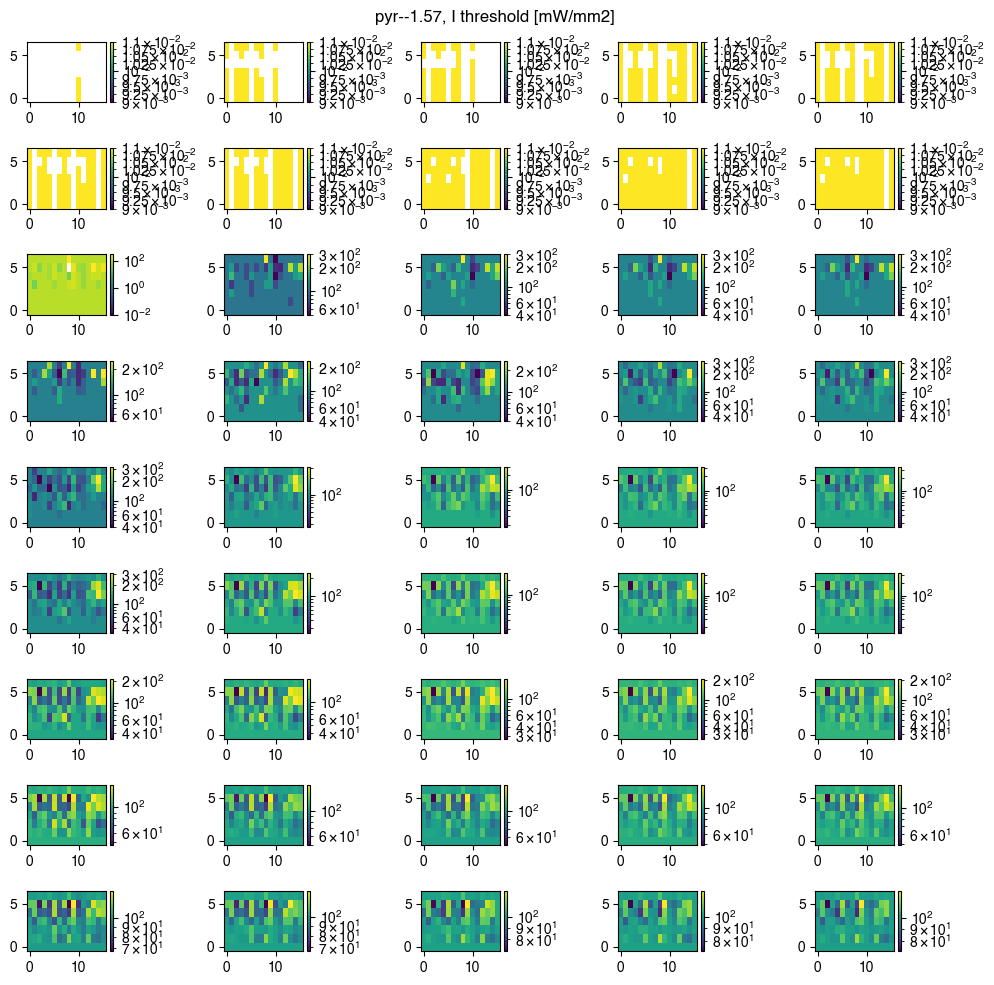

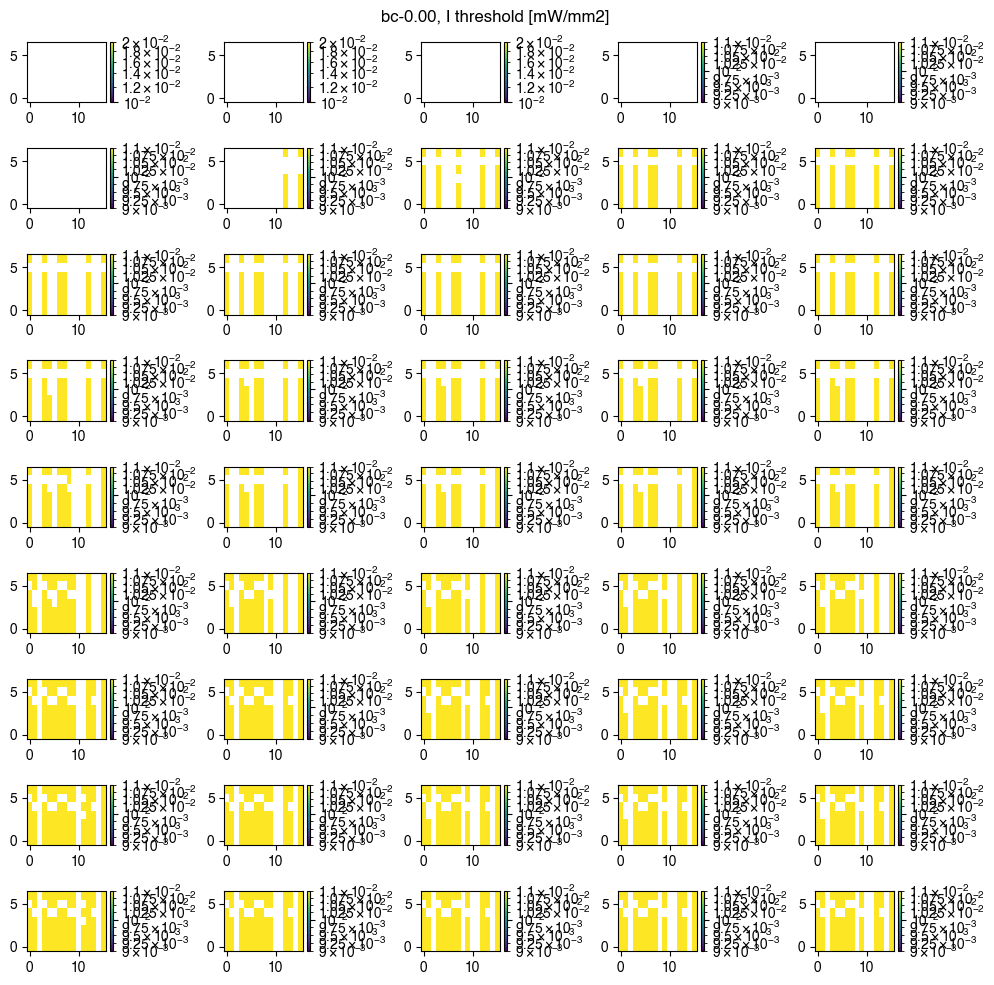

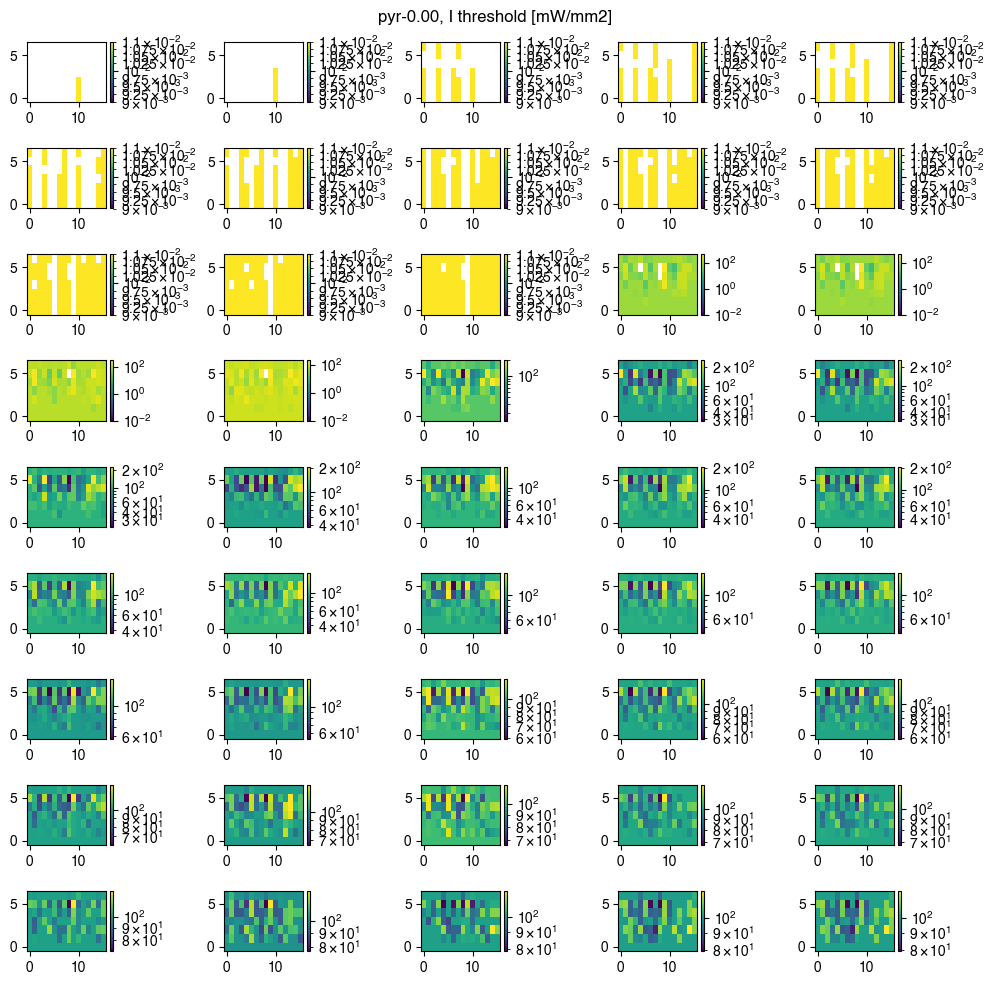

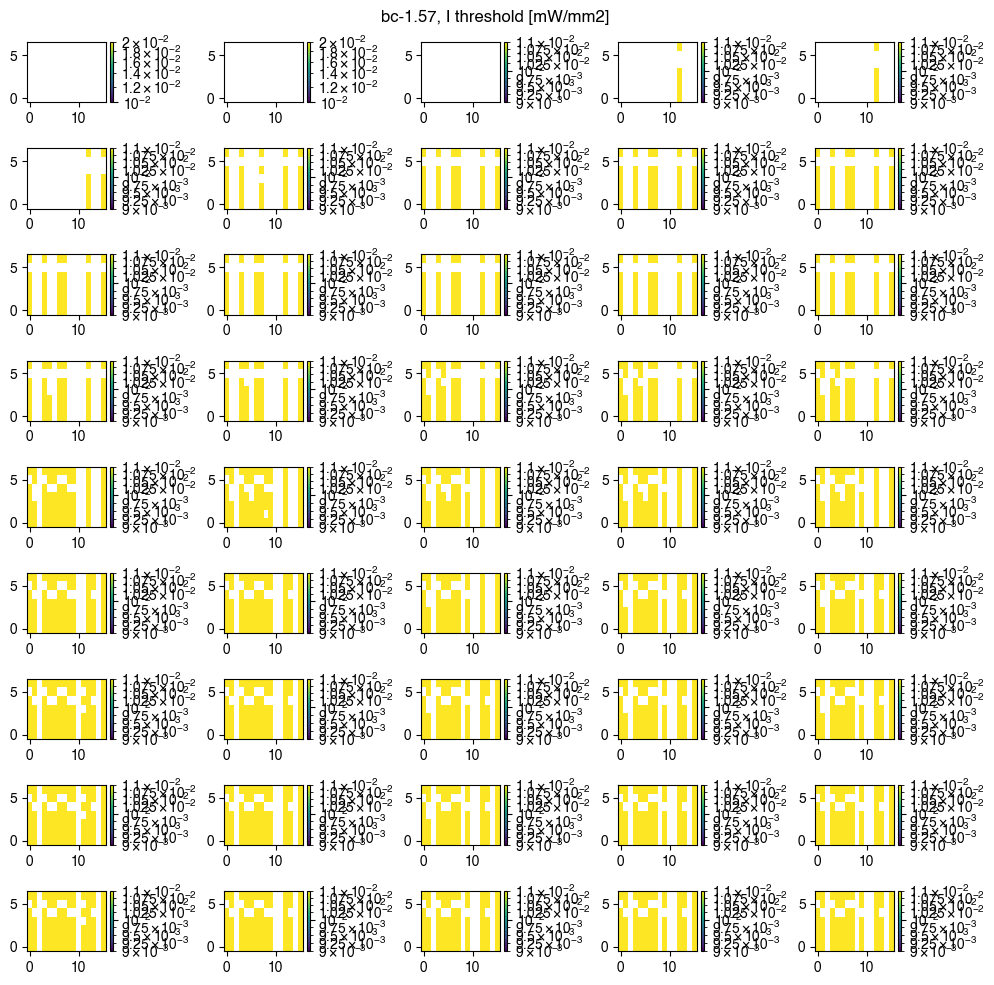

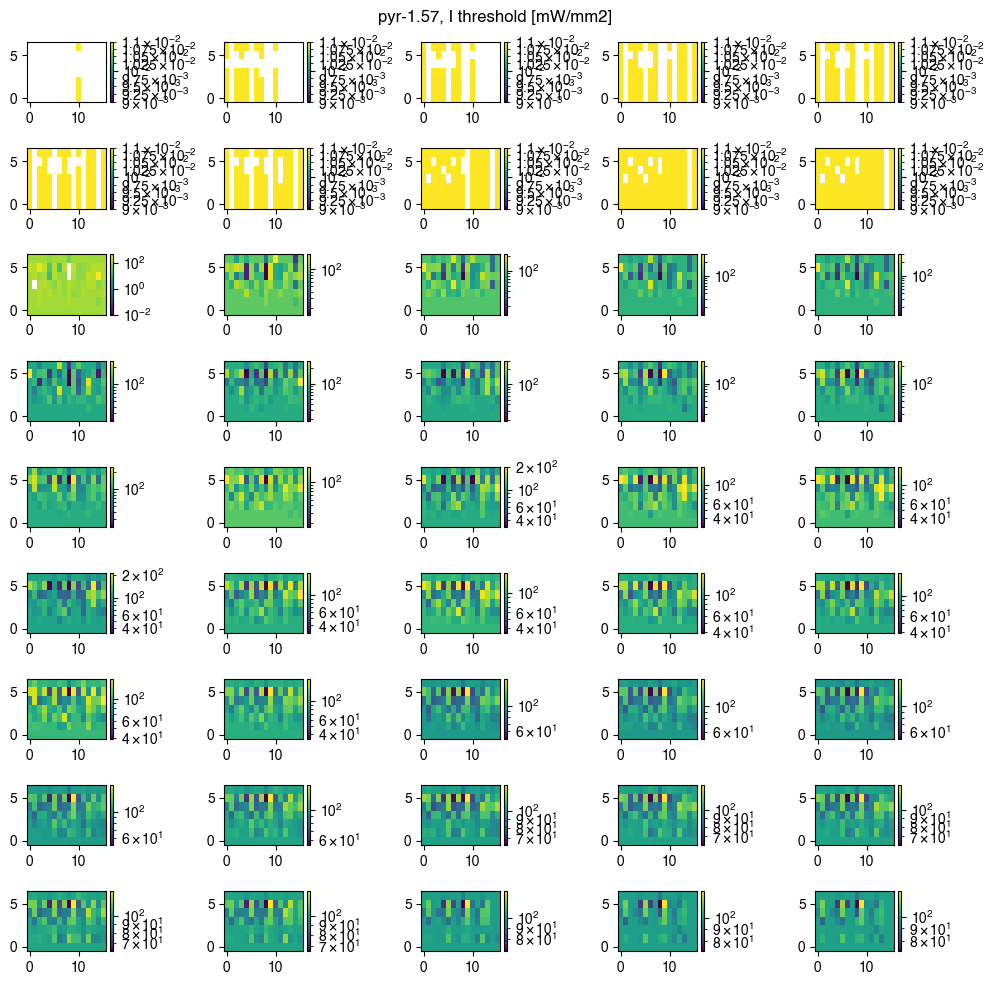

In [8]:
datalabel = 'surf_avg'
for pitch in unique_values_columns_vta['theta_0']:
    for cellt in unique_values_columns_vta['celltype']:
        fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,celltype=cellt,theta_0=pitch)]
        urowAxesVals = fig_df['level'].unique()[:]
        ucolumnAxesVals = fig_df['dur'].unique()[:]
        fig,axs = plt.subplots(len(urowAxesVals),len(ucolumnAxesVals), tight_layout=True,figsize=(10,10))
        for i, row in enumerate(urowAxesVals):
            for j, column in enumerate(ucolumnAxesVals):
                ax_df = fig_df[selection_generator(fig_df,unique_values_columns=unique_values_columns_vta,level=row,dur=column)]
                if not all(np.isnan(ax_df[datalabel])):


                    data_toplot = EcF.prepareDataforInterp(np.array((ax_df['cluster_eet'],ax_df['idx_incluster_eet'],ax_df[datalabel])).T,'ninterp',sorted=False)
                    yY, zZ = np.meshgrid(data_toplot[0],data_toplot[1],indexing='ij')
                    data_toplot = list(data_toplot)
                    data_toplot[-1]=data_toplot[-1]/data_toplot[-1][:,0:1]*100

                    Imin = np.nanmax((np.nanmin(data_toplot[-1].ravel()),1e-2))
                    Imin = 1e-2 if np.isinf(Imin) else Imin
                    Imax = np.nanmax((np.nanmax(data_toplot[-1].ravel()),Imin+1e-2))
                    Imax = 1e-2 if np.isinf(Imax) else Imax
                    norm = mpl.cm.colors.LogNorm(vmax=Imax, vmin=Imin)
                    im,cb = EcF.slicePlot(data_toplot,axs[i,j],fig,plotGrid=(yY,zZ),structured=True, norm=norm)

        fig.suptitle(f'{cellt}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

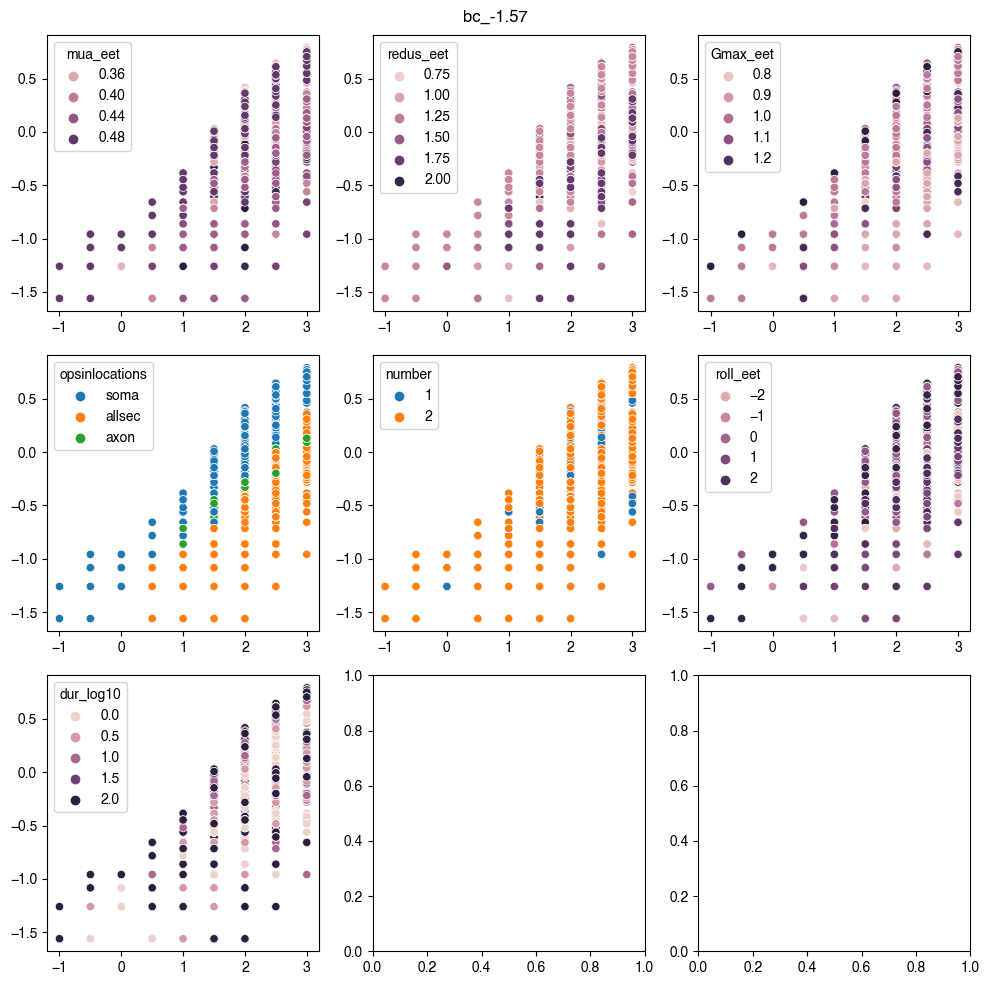

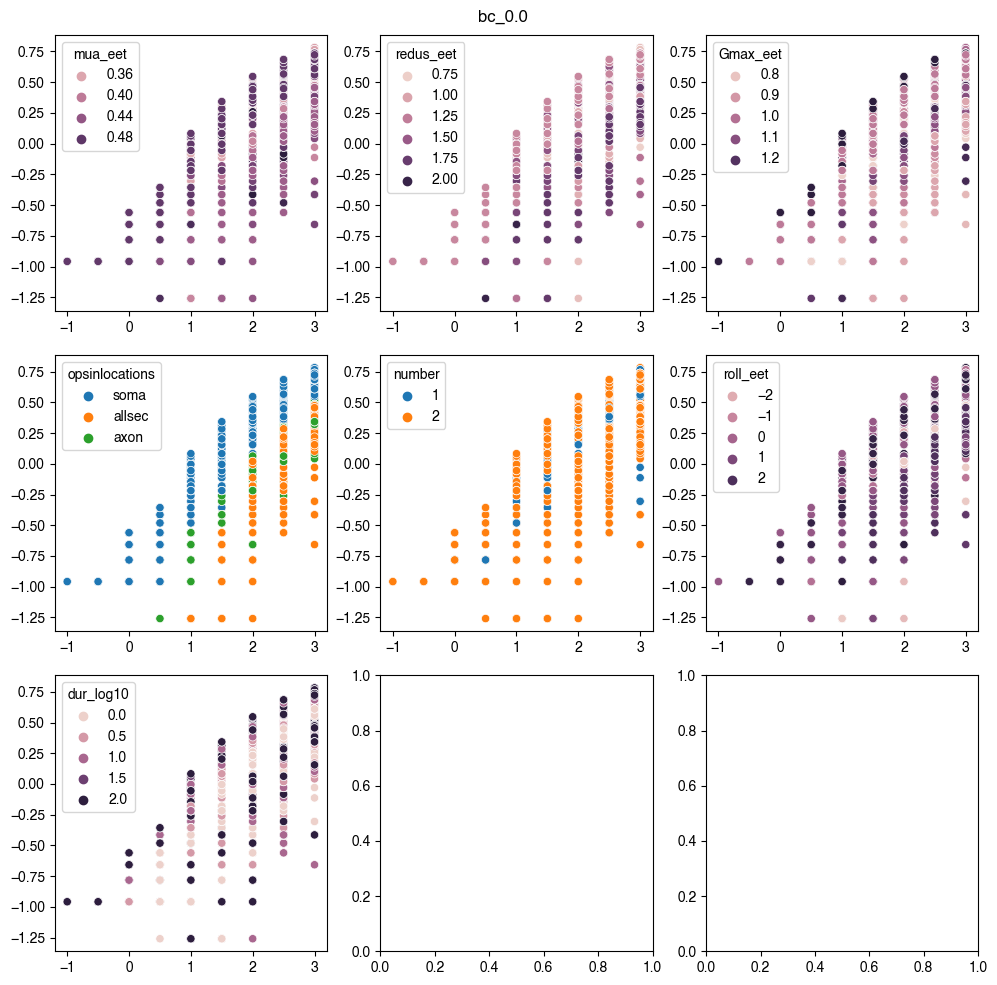

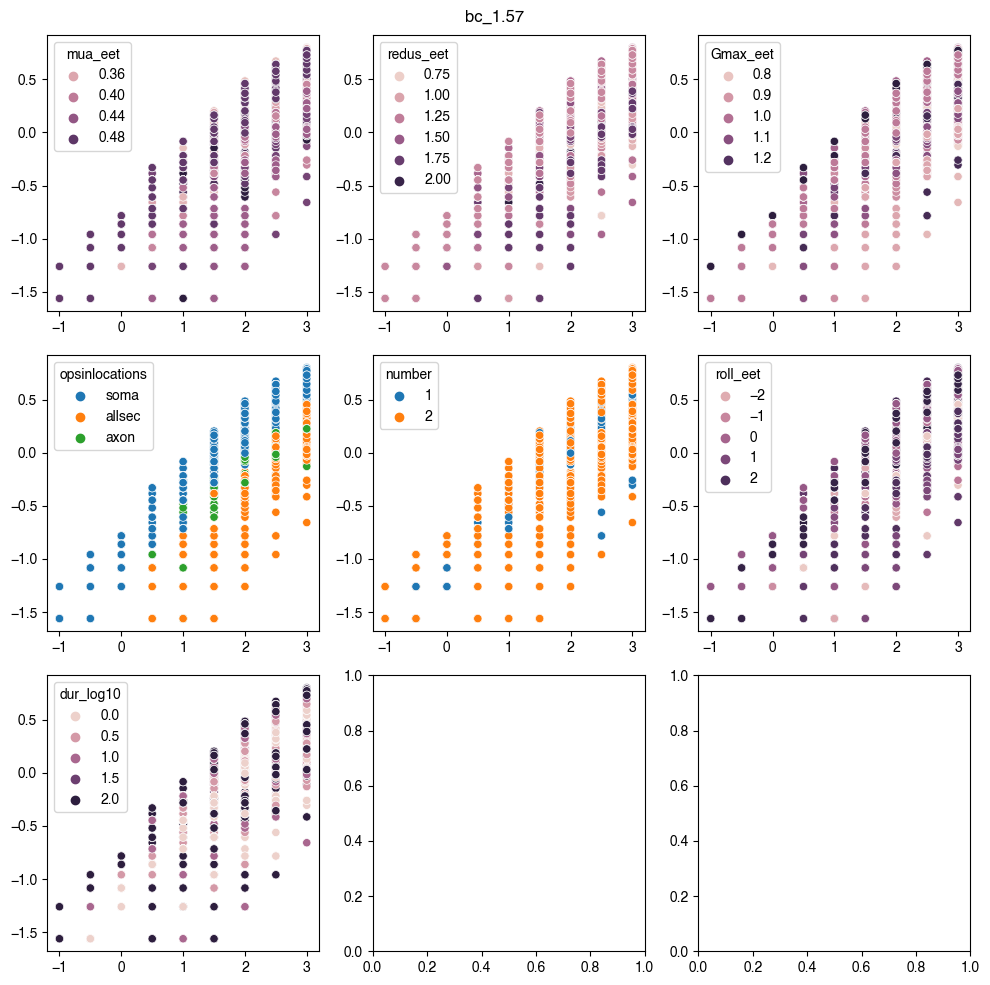

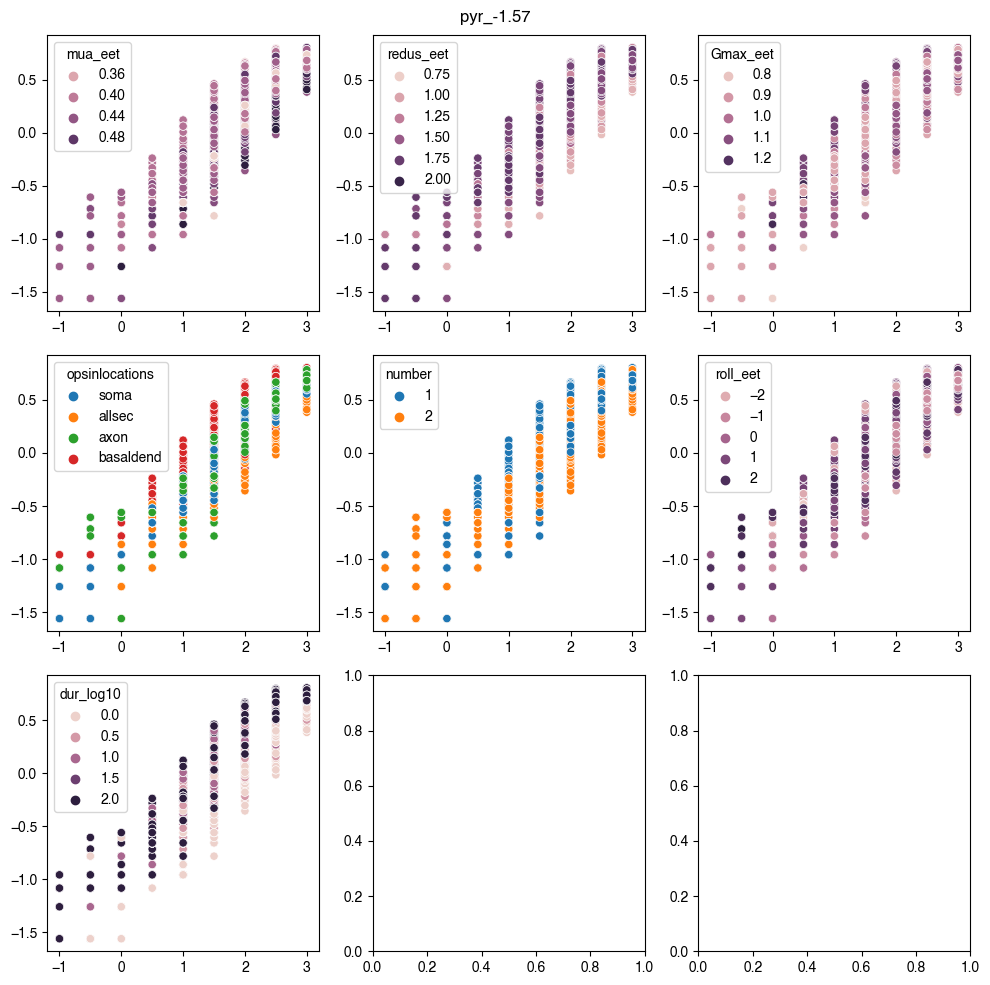

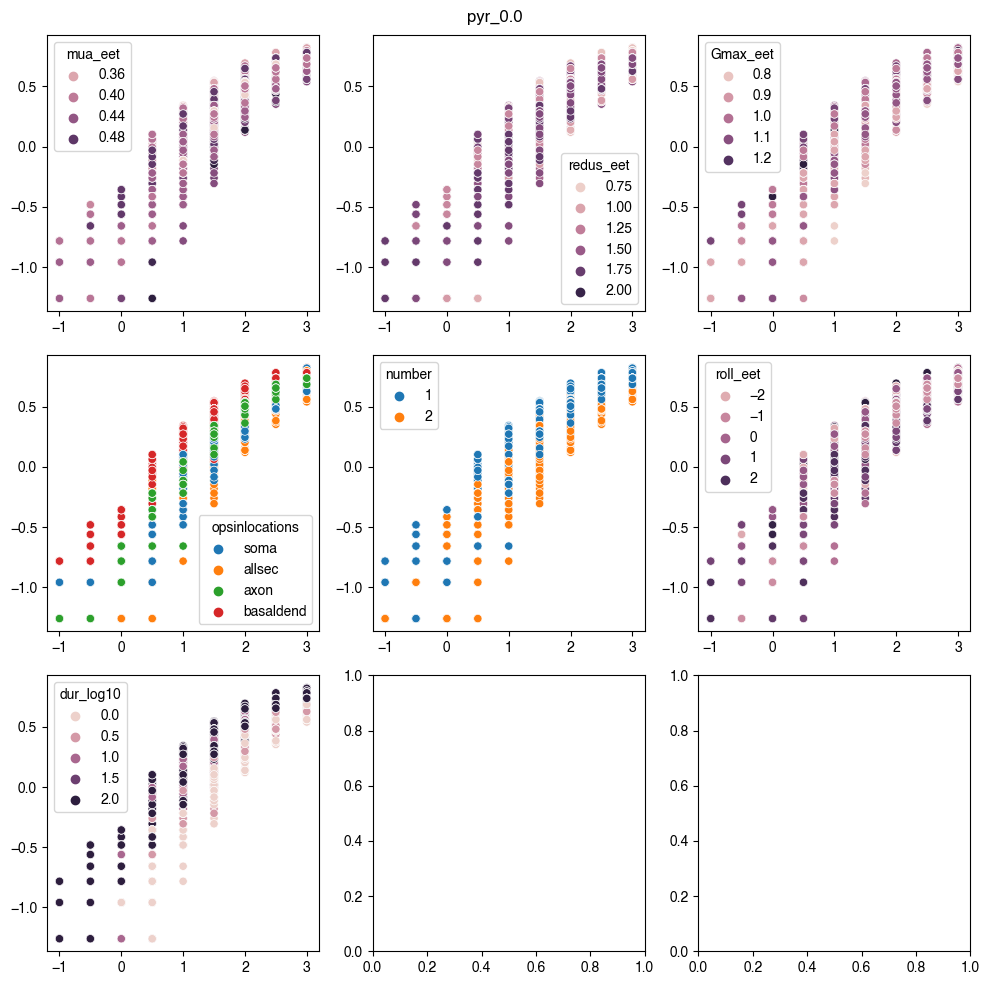

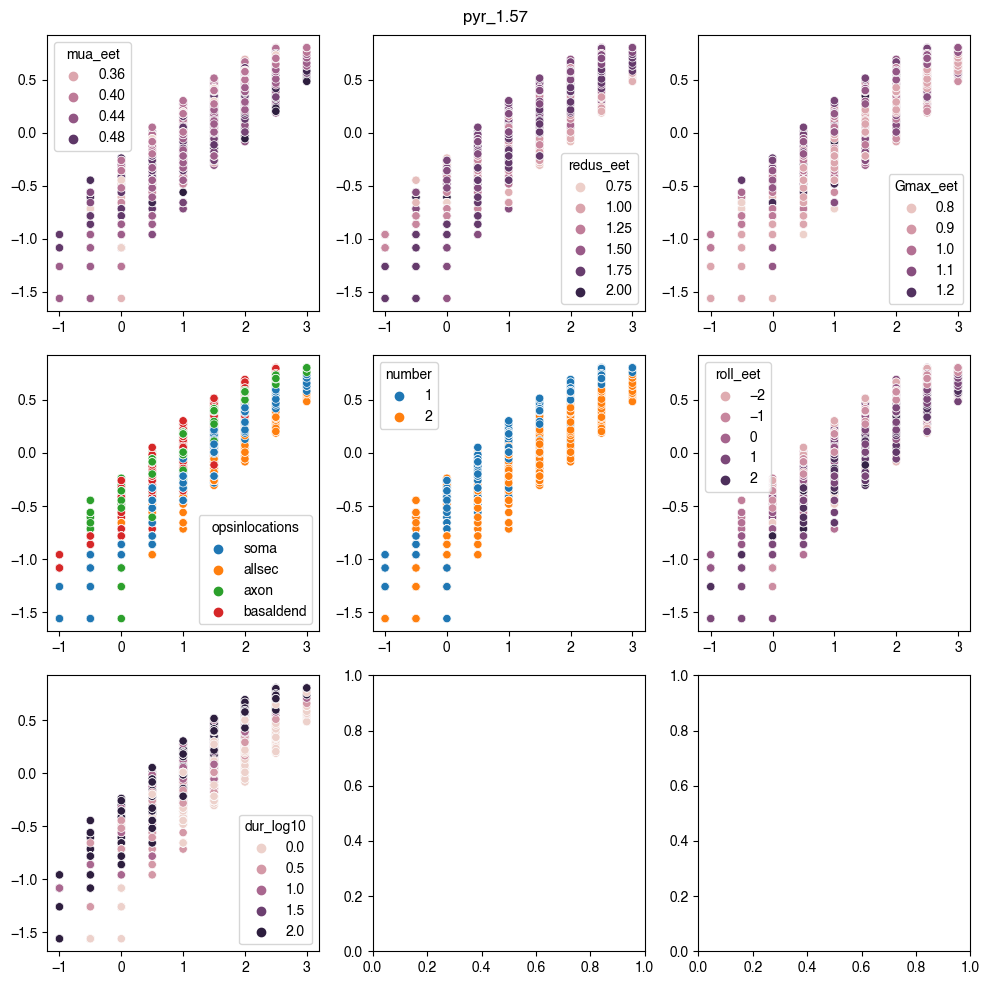

In [9]:
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet', 'opsinlocations', 'number' ,'roll_eet', 'dur_log10']
for cth in uct_theta:
    fig,axs = plt.subplots(np.ceil(len(row_strs)/3).astype(int),3, tight_layout=True, figsize=(10,10))
    for r, ax in zip(row_strs,axs.ravel()):
        idx = (vta_df['ct_theta']==cth)
        sns.scatterplot(data=vta_df[idx],x='level_log10',y='surf_avg_log10', hue=r, ax=ax)

        ax.set_xlabel(None)
        ax.set_ylabel(None)
    fig.suptitle(cth)




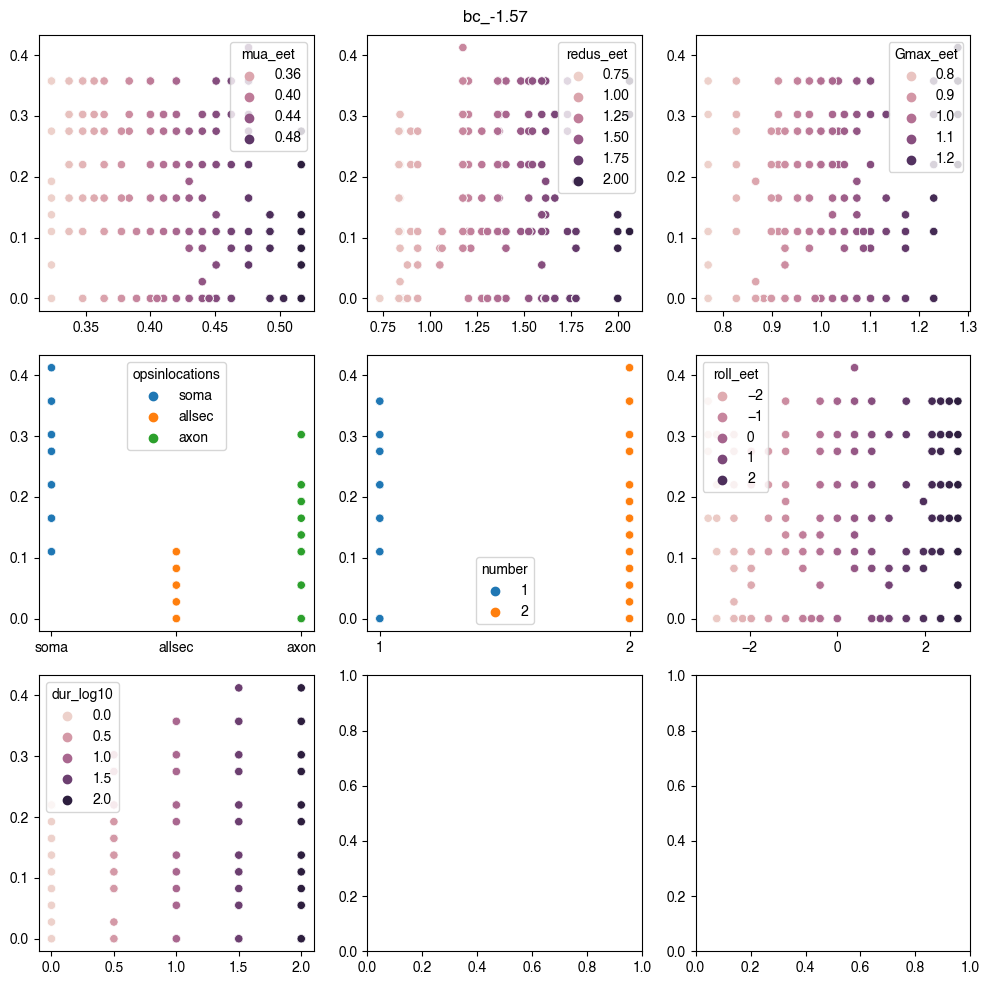

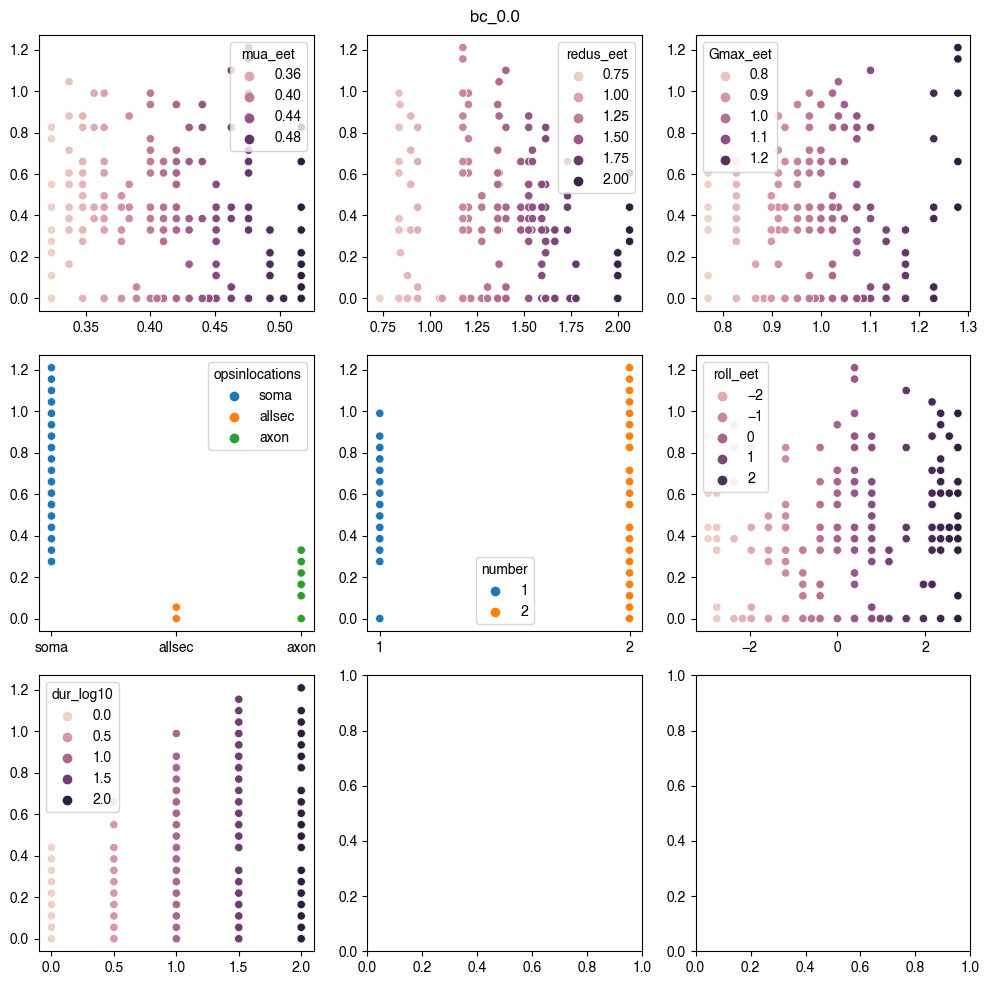

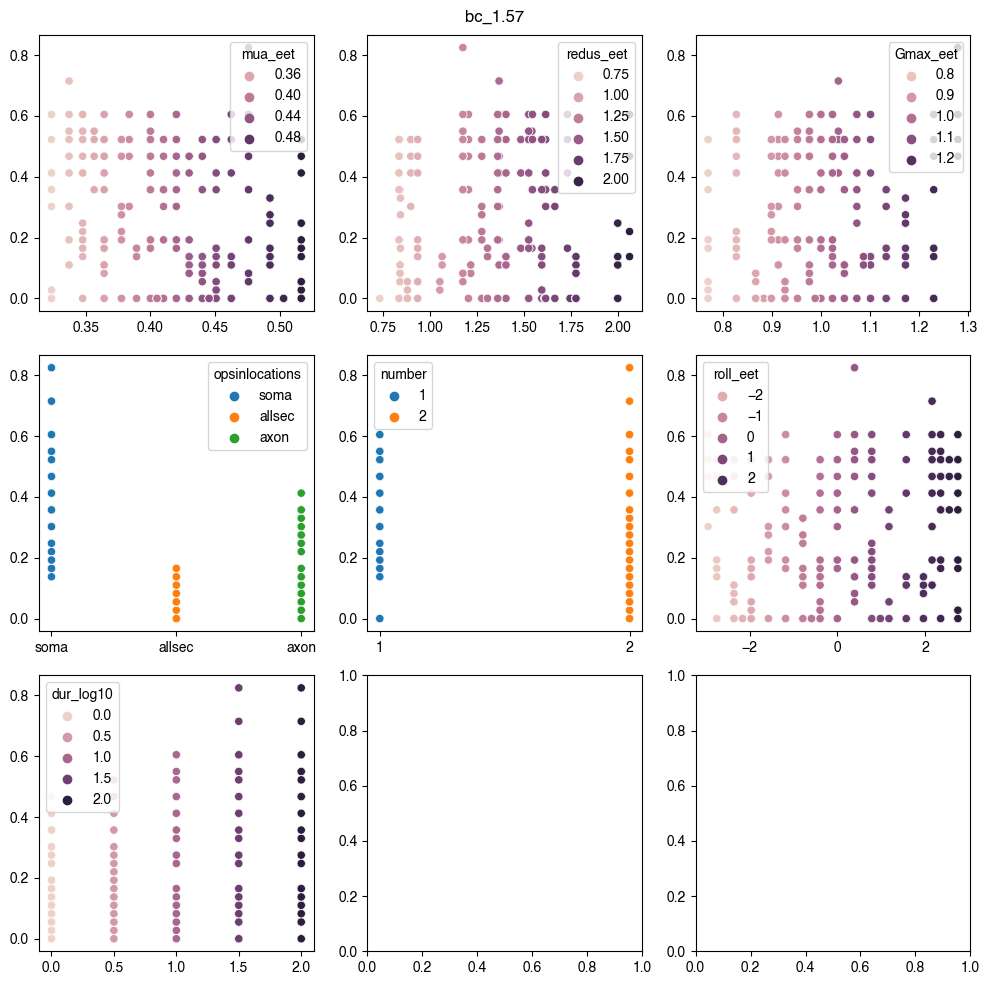

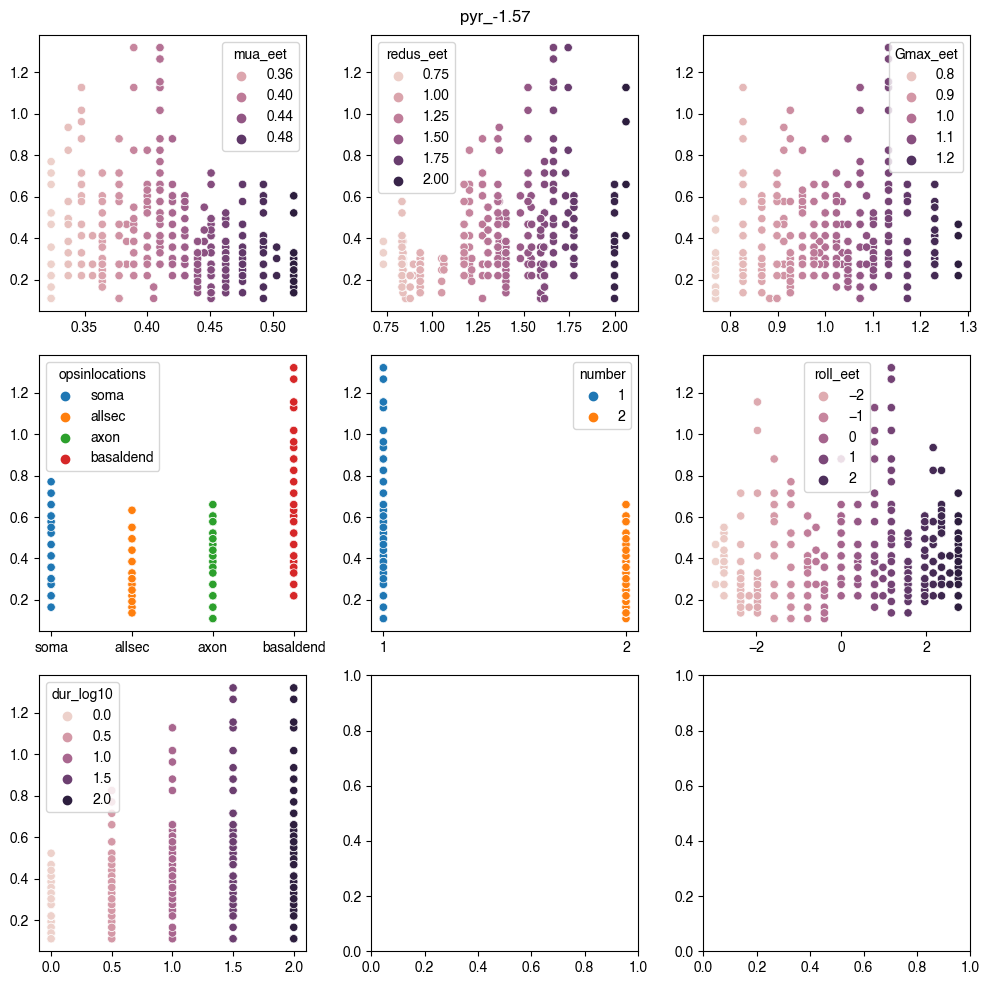

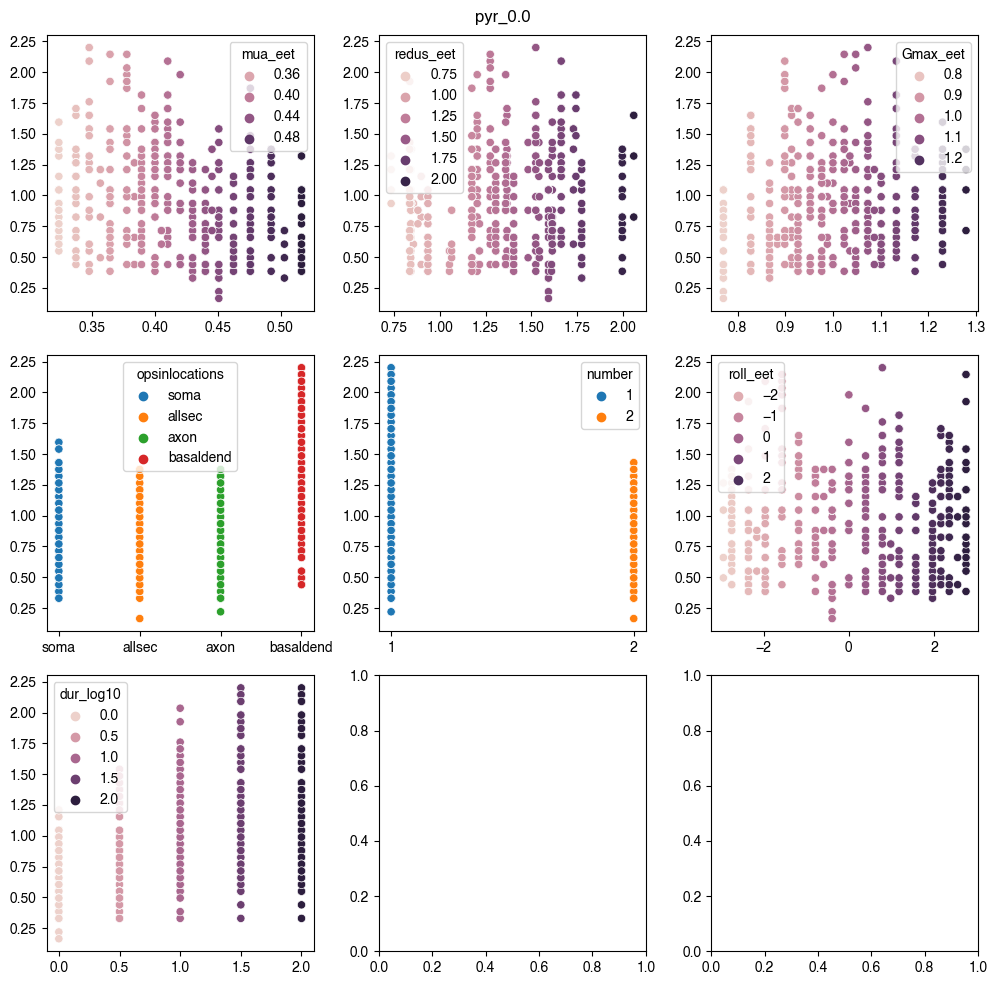

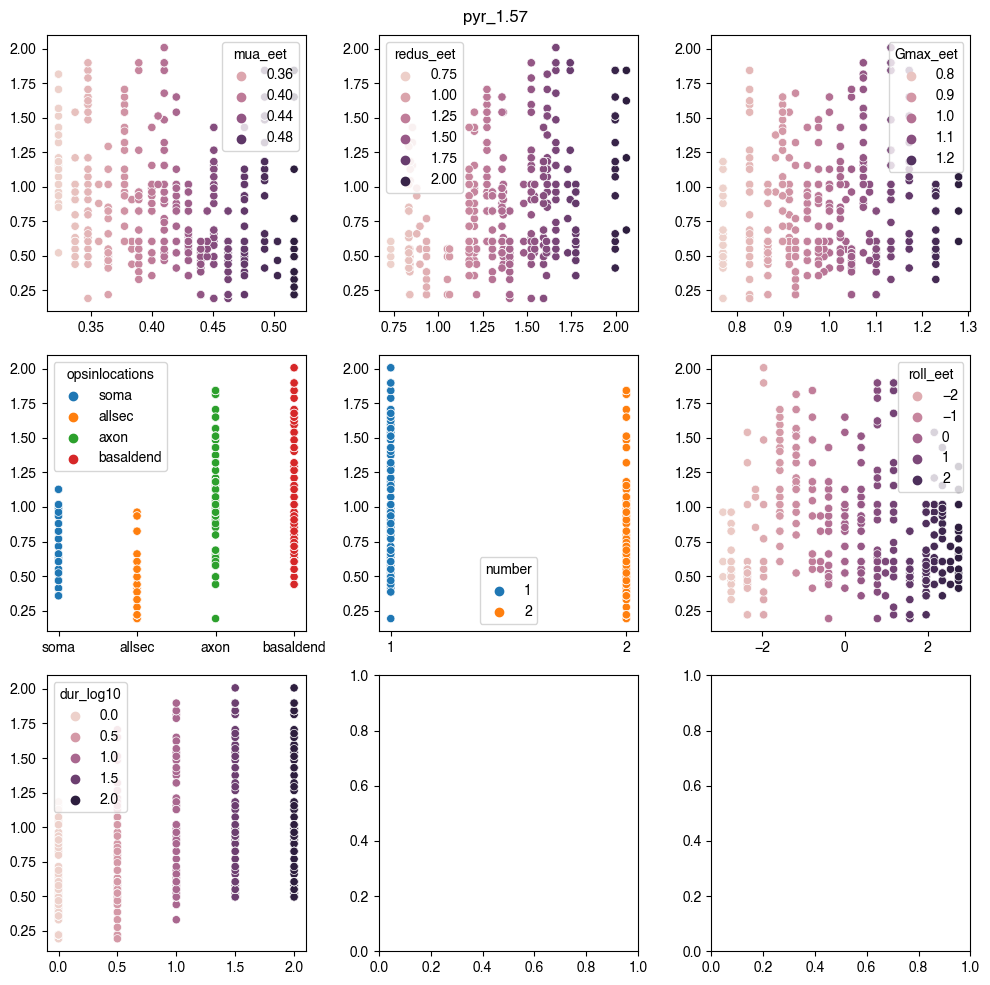

In [10]:
level = 10
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet', 'opsinlocations', 'number' ,'roll_eet', 'dur_log10']
for cth in uct_theta:
    fig,axs = plt.subplots(np.ceil(len(row_strs)/3).astype(int),3, tight_layout=True, figsize=(10,10))
    for r, ax in zip(row_strs,axs.ravel()):
        idx = (vta_df['ct_theta']==cth) & (vta_df['level']==level)
        sns.scatterplot(data=vta_df[idx],x=r,y='surf_avg', hue=r, ax=ax)

        ax.set_xlabel(None)
        ax.set_ylabel(None)
    fig.suptitle(cth)


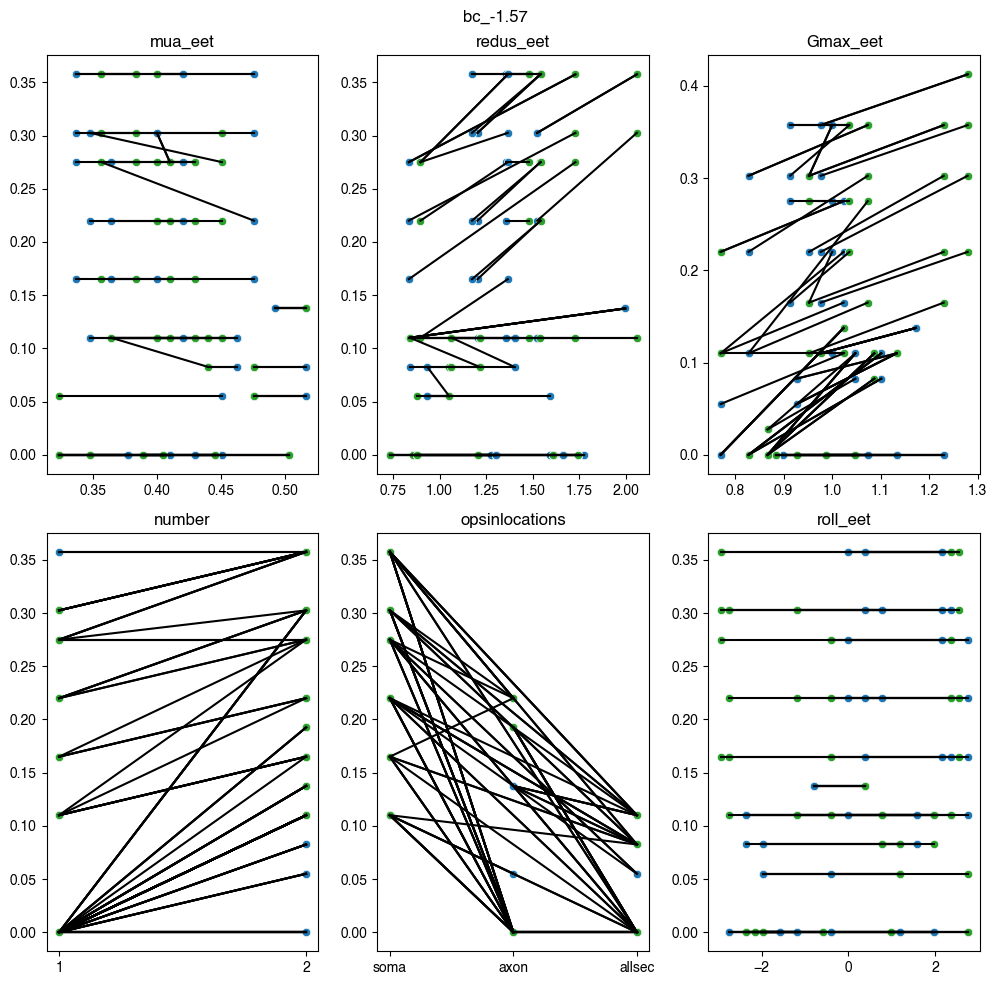

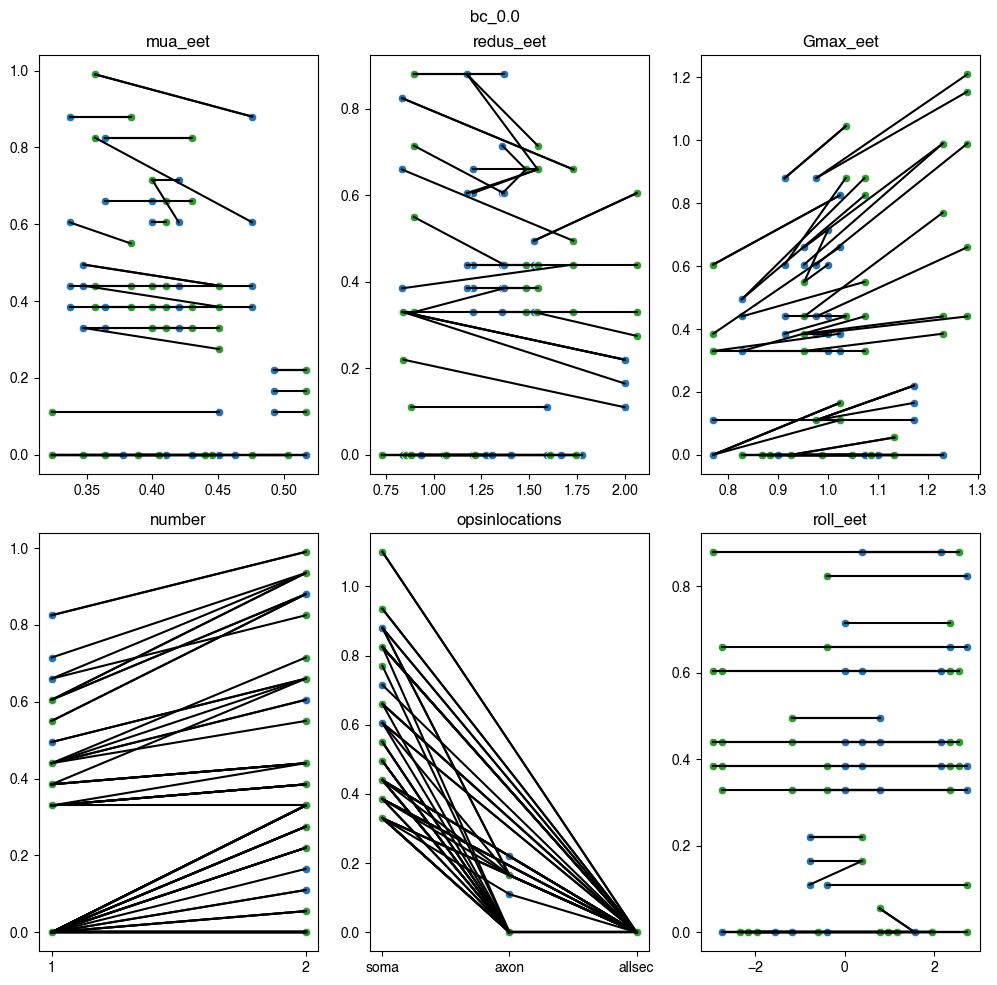

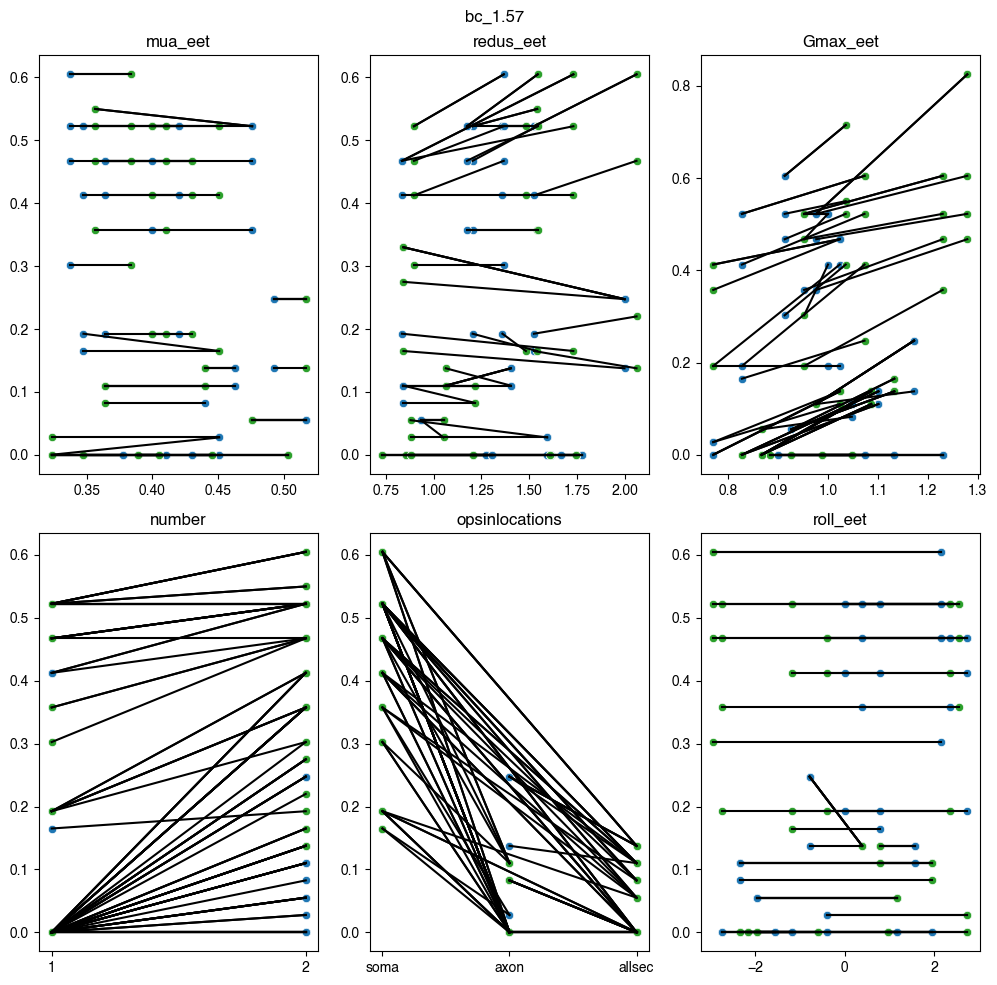

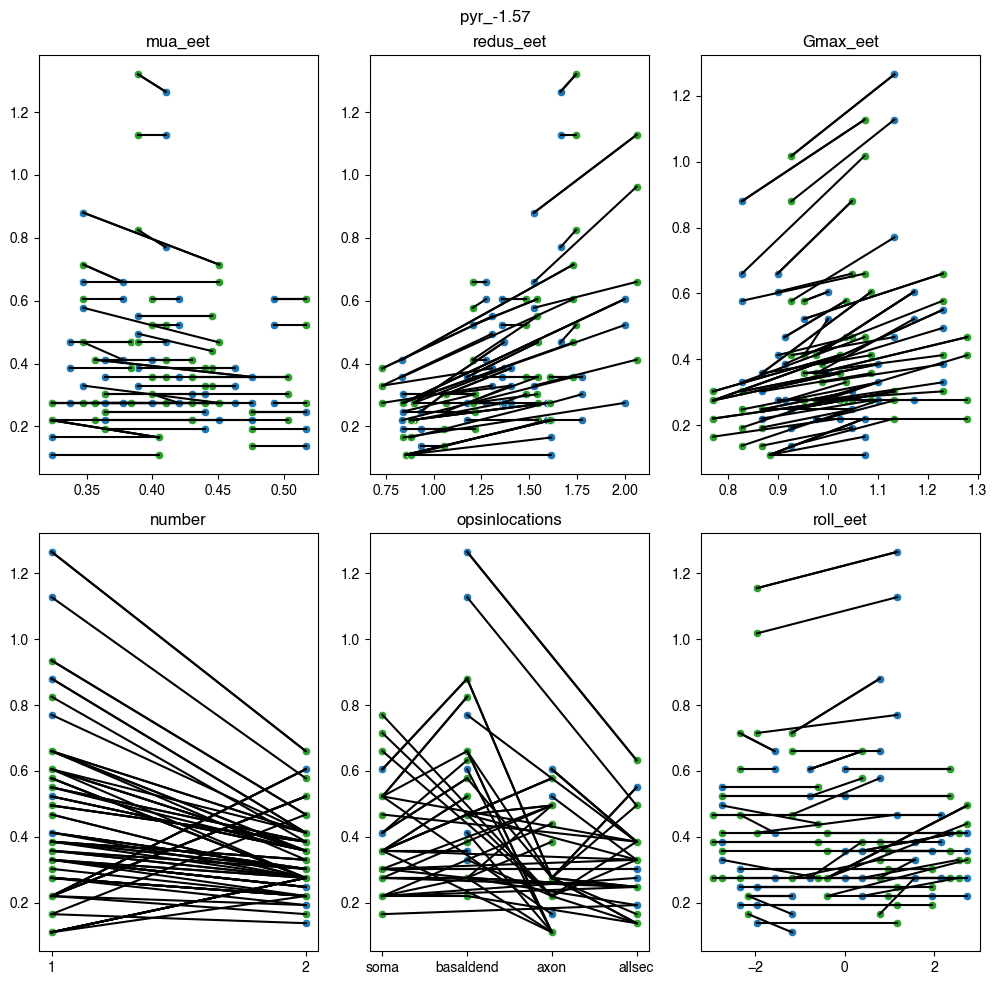

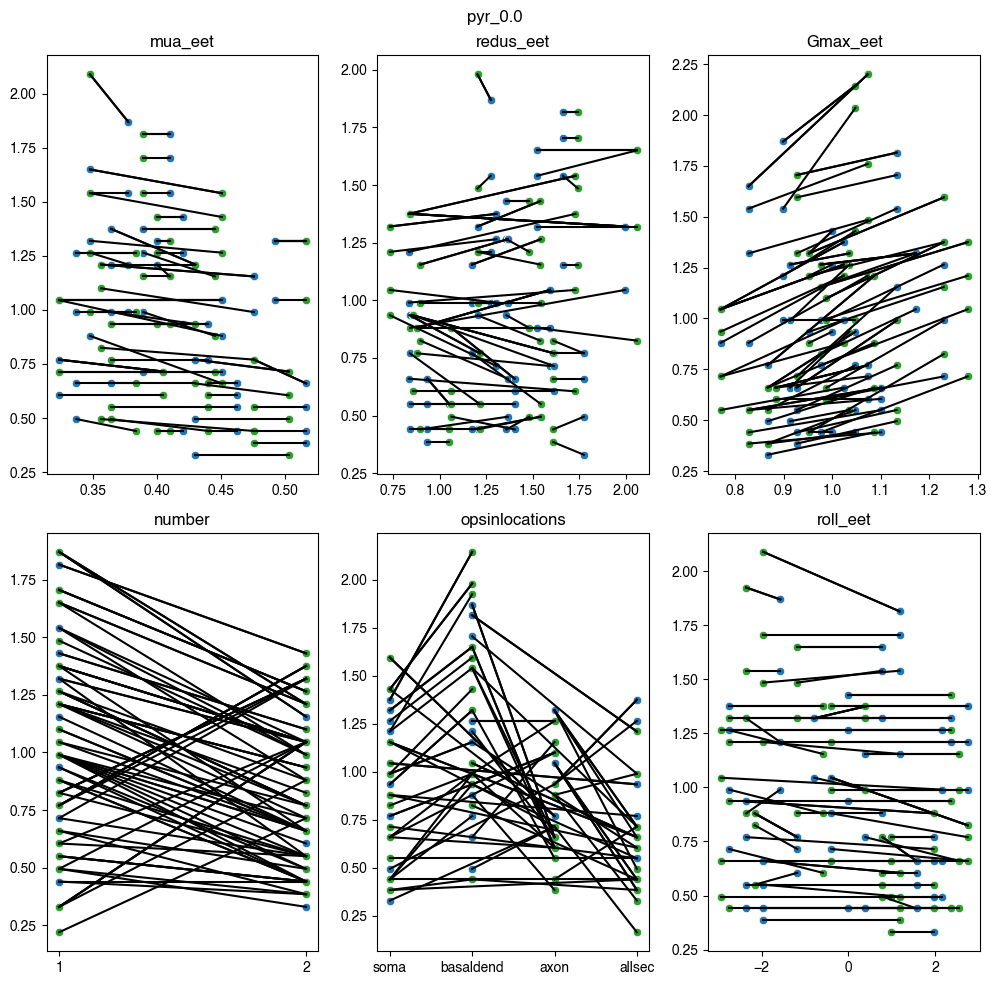

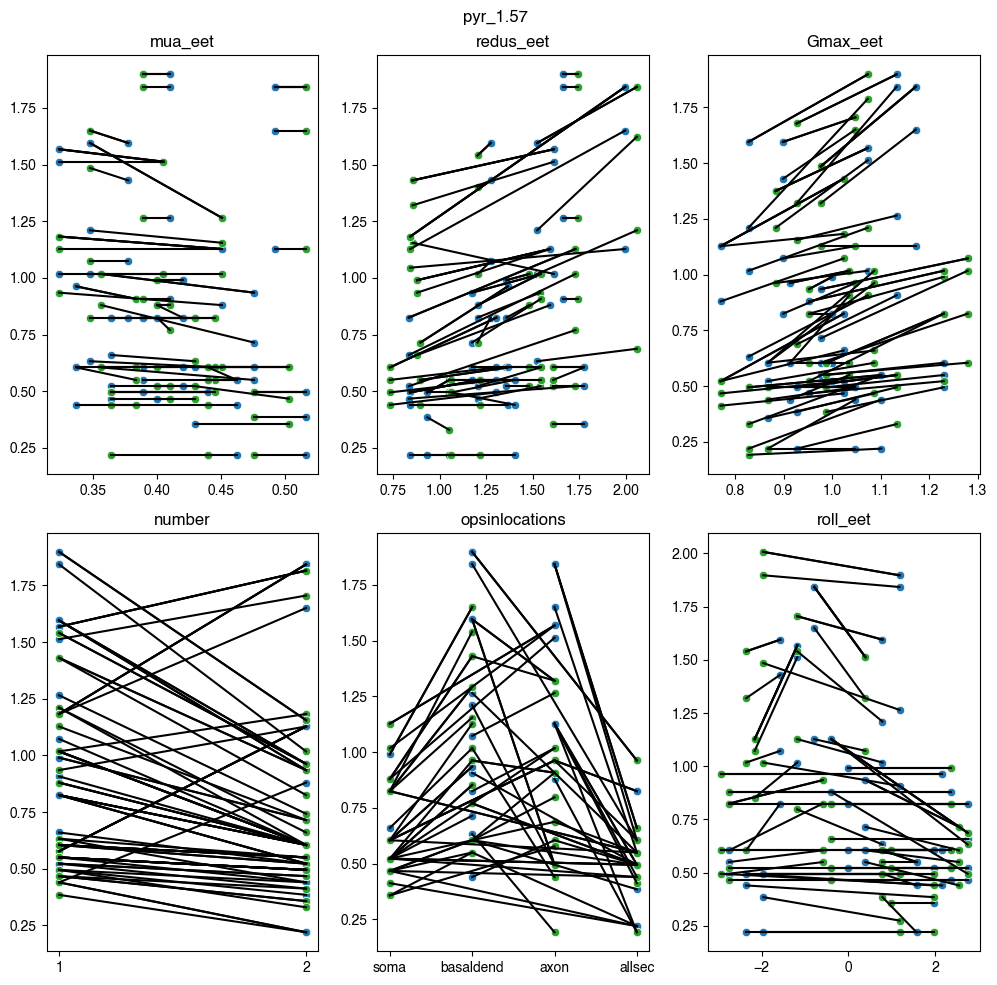

In [11]:
level = 10
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet', 'number','opsinlocations', 'roll_eet']

for cth in uct_theta:
    idx_m = (vta_df['ct_theta']==cth) & (vta_df['level']==10)
    fig,axs = plt.subplots(np.ceil(len(row_strs)/3).astype(int),3, tight_layout=True, figsize=(10,10))
    for i, (r, ax) in enumerate(zip(row_strs,axs.ravel())):
        idx = idx_m & ((vta_df['idx_incluster_eet']==0))
        intm_df1 = vta_df[idx].set_index(['ct_theta','level','dur','cluster_eet'])
        sns.scatterplot(data=vta_df[idx],x=r,y='surf_avg', color='tab:blue', ax=ax)

        idx_2 = idx_m &(vta_df['idx_incluster_eet']==i+1)
        intm_df2 = vta_df[idx_2].set_index(['ct_theta','level','dur','cluster_eet'])
        sns.scatterplot(data=vta_df[idx_2],x=r,y='surf_avg', color='tab:green', ax=ax)
        m_df = pd.merge(intm_df1, intm_df2, left_index=True, right_index = True, suffixes=('_0', '_1'),validate='one_to_many').reset_index()
        data=m_df[[r+'_0',r+'_1','surf_avg_0','surf_avg_1']].values
        for d in data:
            ax.plot(d[0:2],d[2:],'k')



        ax.set_xlabel(None)
        ax.set_ylabel(None)
        ax.set_title(r)
    fig.suptitle(cth)

# Optimal/Worst Position

C:\Users\rschoete\AppData\Local\Temp\ipykernel_9092\362204863.py:141: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
C:\Users\rschoete\AppData\Local\Temp\ipykernel_9092\362204863.py:142: RuntimeWarning: invalid value encountered in true_divide
  w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)
C:\Users\rschoete\AppData\Local\Temp\ipykernel_9092\362204863.py:203: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
C:\Users\rschoete\AppData\Local\Temp\ipykernel_9092\362204863.py:204: RuntimeWarning: invalid value encountered in true_divide
  w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)
C:\Users\rschoete\AppData\Local\Temp\ipykernel_9092\362204863.py:203: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict[pitch][uk] =

,b_opt_pos_TAC,w_opt_pos_TAC,dur,opsinlocations,neurontemplate,theta_0,level,Gmax,selector
25200,NaN,NaN,1.0,soma,pyr_1,1.57,0.100,1.000,pyr_soma
25201,0.04,0.48,1.0,soma,pyr_1,1.57,0.316,1.000,pyr_soma
25202,0.04,0.48,1.0,soma,pyr_1,1.57,1.000,1.000,pyr_soma
25203,0.04,-0.40,1.0,soma,pyr_1,1.57,3.162,1.000,pyr_soma
25204,0.26,-0.40,1.0,soma,pyr_1,1.57,10.000,1.000,pyr_soma
...,...,...,...,...,...,...,...,...,...
30145,0.04,-0.29,100.0,soma,pyr_2,1.57,10.000,0.867,pyr_soma
30146,0.15,-0.40,100.0,soma,pyr_2,1.57,31.623,0.867,pyr_soma
30147,0.48,-0.29,100.0,soma,pyr_2,1.57,100.000,0.867,pyr_soma
30148,0.15,-0.29,100.0,soma,pyr_2,1.57,316.228,0.867,pyr_soma


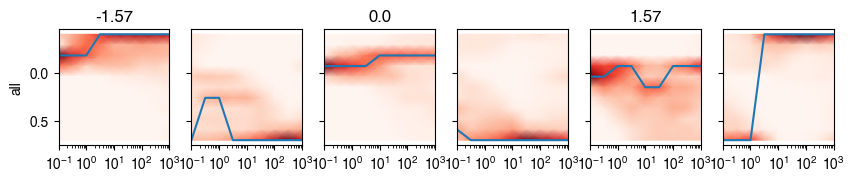

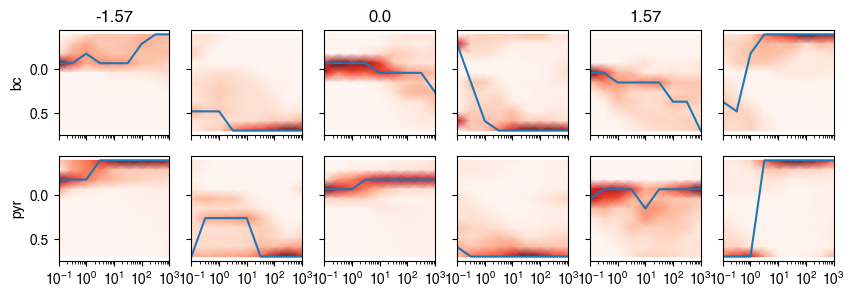

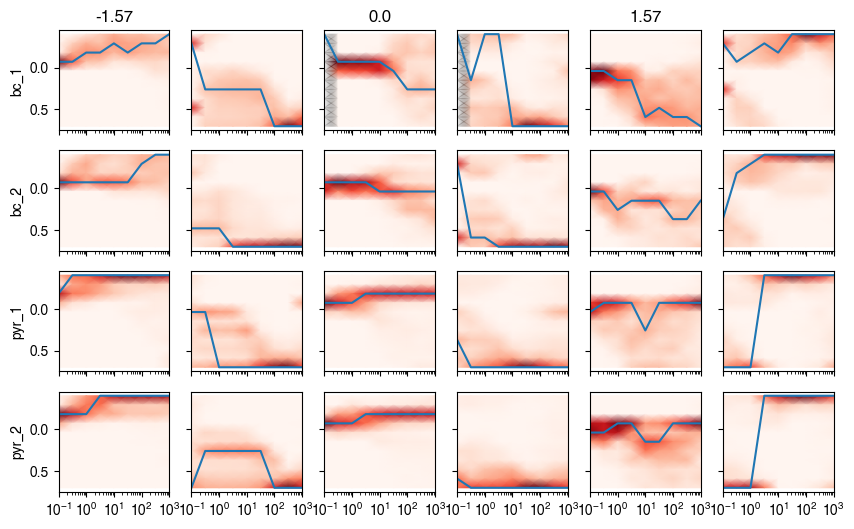

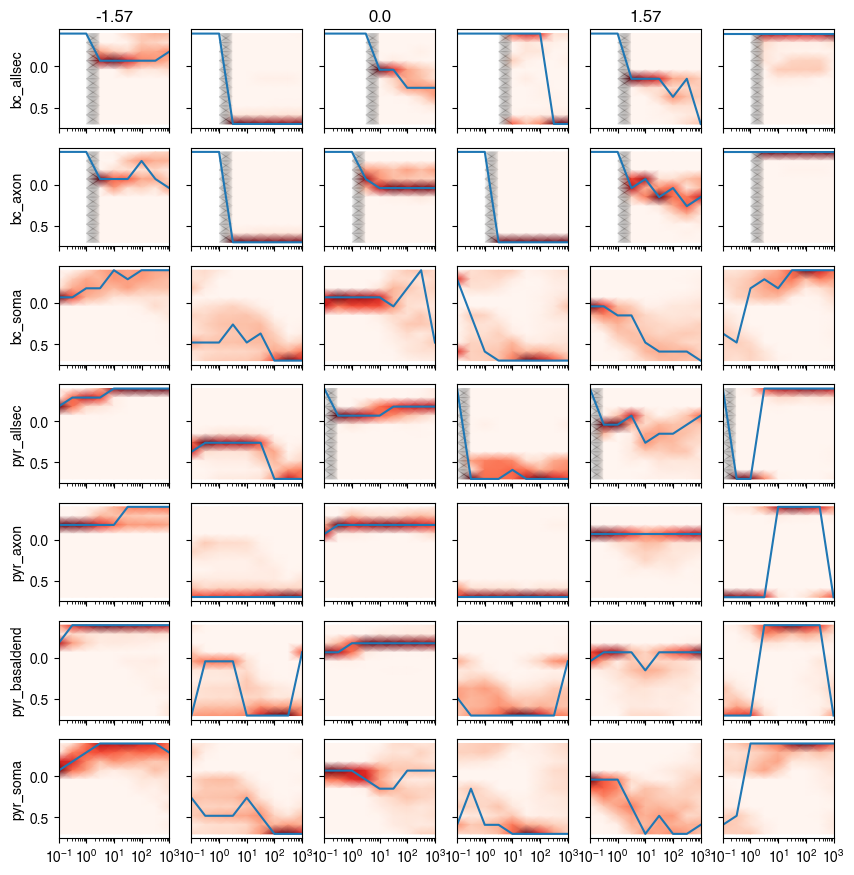

In [12]:
zpos = np.arange(-400,810,110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
ukeys = ['all']
columnsOI = ['b_opt_pos_TAC','w_opt_pos_TAC','dur','opsinlocations','neurontemplate','theta_0','level','Gmax']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['theta_0']==pitch)
        intm_df = vta_limit_df.loc[idx,columnsOI]
        b_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        w_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                b_opt_dict[pitch][uk][i,j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                w_opt_dict[pitch][uk][i,j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)

fig,axs = plt.subplots(len(ukeys),6,figsize=(10,1.5),sharex=True,sharey=True)
if len(ukeys)==1:
    axs = np.array([axs])
xX,yY = np.meshgrid(intensities,zpos)
for uk, axrow in zip(ukeys,axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX,yY,b_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk],axis=0)
        axrow[i*2].plot(intensities,zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45,0.750])

        axrow[i*2+1].pcolormesh(xX,yY,w_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk],axis=0)
        axrow[i*2+1].plot(intensities,zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45,0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk==ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0,0].invert_yaxis()

#################### celltype split#################################
####################################################################

zpos = np.arange(-400,810,110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['celltype']}",axis=1)
ukeys = vta_limit_df['selector'].unique()
columnsOI = ['b_opt_pos_TAC','w_opt_pos_TAC','dur','opsinlocations','neurontemplate','theta_0','level','Gmax','selector']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['selector']==uk) & (vta_limit_df['theta_0']==pitch)
        intm_df = vta_limit_df.loc[idx,columnsOI]
        b_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        w_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                b_opt_dict[pitch][uk][i,j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                w_opt_dict[pitch][uk][i,j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)




vta_limit_df.drop(columns=['selector'])


fig,axs = plt.subplots(len(ukeys),6,figsize=(10,3),sharex=True,sharey=True)
xX,yY = np.meshgrid(intensities,zpos)
for uk, axrow in zip(ukeys,axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX,yY,b_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk],axis=0)
        axrow[i*2].plot(intensities,zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45,0.750])

        axrow[i*2+1].pcolormesh(xX,yY,w_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk],axis=0)
        axrow[i*2+1].plot(intensities,zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45,0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk==ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0,0].invert_yaxis()


#################### neuron type split #################################
####################################################################

zpos = np.arange(-400,810,110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['neurontemplate']}",axis=1)
ukeys = np.sort(vta_limit_df['selector'].unique())
columnsOI = ['b_opt_pos_TAC','w_opt_pos_TAC','dur','opsinlocations','neurontemplate','theta_0','level','Gmax','selector']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['selector']==uk) & (vta_limit_df['theta_0']==pitch)
        intm_df = vta_limit_df.loc[idx,columnsOI]
        b_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        w_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                b_opt_dict[pitch][uk][i,j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                w_opt_dict[pitch][uk][i,j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)




vta_limit_df.drop(columns=['selector'])


fig,axs = plt.subplots(len(ukeys),6,figsize=(10,6),sharex=True,sharey=True)
xX,yY = np.meshgrid(intensities,zpos)
for uk, axrow in zip(ukeys,axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX,yY,b_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk],axis=0)
        axrow[i*2].plot(intensities,zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45,0.750])

        axrow[i*2+1].pcolormesh(xX,yY,w_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk],axis=0)
        axrow[i*2+1].plot(intensities,zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45,0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk==ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0,0].invert_yaxis()


#################### opsin and celltype split#################################
####################################################################

zpos = np.arange(-400,810,110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['celltype']}_{x['opsinlocations']}",axis=1)
#vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['opsinlocations']}",axis=1)
ukeys = np.sort(vta_limit_df['selector'].unique())
columnsOI = ['b_opt_pos_TAC','w_opt_pos_TAC','dur','opsinlocations','neurontemplate','theta_0','level','Gmax','selector']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['selector']==uk) & (vta_limit_df['theta_0']==pitch)
        intm_df = vta_limit_df.loc[idx,columnsOI]
        b_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        w_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                b_opt_dict[pitch][uk][i,j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                w_opt_dict[pitch][uk][i,j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)







fig,axs = plt.subplots(len(ukeys),6,figsize=(10,1.5*7),sharex=True,sharey=True)
xX,yY = np.meshgrid(intensities,zpos)
for uk, axrow in zip(ukeys,axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX,yY,b_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk],axis=0)
        axrow[i*2].plot(intensities,zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45,0.750])

        axrow[i*2+1].pcolormesh(xX,yY,w_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk],axis=0)
        axrow[i*2+1].plot(intensities,zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45,0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk==ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0,0].invert_yaxis()
intm_df

# EET

In [8]:
r=int(16)
# detect false calculated EET (check opsinloc and morpho)
columnsOI=['surf_avg','EETsimidx', 'mua_eet', 'redus_eet','Gmax_eet', 'cell_eet', 'loc_eet', 'roll_eet','opsinlocations','number','cluster_eet','idx_incluster_eet']
false_sims = {}
for celltype in ['pyr', 'bc']:
    for th in unique_values_columns_vta['theta_0']:
        false_sims[f"{celltype}_{th}"]=[]
        intm_df = vta_df.loc[selection_generator(vta_df,unique_values_columns_vta,dur=10,level=10,ct_theta=f"{celltype}_{th}"), columnsOI].copy()
        # if celltype == 'pyr':
        #     intm_df['loc_eet'] = np.floor(intm_df['loc_eet']/3).astype(int)
        # elif celltype == 'bc':
        #     intm_df['loc_eet'] = np.floor(intm_df['loc_eet']/4).astype(int)
        # else:
        #     raise ValueError('celltype is false')
        intm_df = intm_df.sort_values(by=['EETsimidx'])
        print(celltype,th)
        for ic in range(r):
            mydata = intm_df[intm_df['cluster_eet']==ic].copy().set_index('idx_incluster_eet')
            for i, param in enumerate(['mua_eet', 'redus_eet','Gmax_eet', 'cell_eet', 'loc_eet', 'roll_eet']):
                center_param = mydata.loc[0,param]
                step_param = mydata.loc[i+1,param]
                if center_param==step_param:
                    false_sims[f"{celltype}_{th}"].append(mydata.loc[i+1,'EETsimidx'])
false_sims


pyr -1.57
pyr 0.0
pyr 1.57
bc -1.57
bc 0.0
bc 1.57


{'pyr_-1.57': [],
 'pyr_0.0': [],
 'pyr_1.57': [],
 'bc_-1.57': [],
 'bc_0.0': [],
 'bc_1.57': []}

In [14]:
vta_df_nocellloc = vta_df.copy()
cellidx = 4+np.arange(r)*7
locidx = 5+np.arange(r)*7
vta_df_nocellloc=vta_df_nocellloc.set_index('EETsimidx')
vta_df_nocellloc=vta_df_nocellloc.drop(index=np.concatenate((cellidx,locidx)))
vta_df_nocellloc = vta_df_nocellloc.reset_index()
vta_df_nocellloc.drop(columns=['loc_eet','cell_eet'])
vta_df_nocellloc

,EETsimidx,vta_low,vta_up,surf_low,surf_up,b_opt_pos,b_opt_pos_TAC,w_opt_pos_TAC,b_opt_pos_TACamp,w_opt_pos_TACamp,...,surf_low_log10,surf_up_log10,dur_log10,Gmax_log10,level_log10,surf_avg_log10,ct_theta,redus_eet,cluster_eet,idx_incluster_eet
0,0.0,0.000000,0.000000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,...,-inf,-inf,0.0,0.0000,-1.0000,-inf,bc_-1.57,1.359600,0.0,0.0
1,0.0,0.000000,0.000000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,...,-inf,-inf,0.0,0.0000,-0.5003,-inf,bc_-1.57,1.359600,0.0,0.0
2,0.0,0.000000,0.064795,0.000,0.220,-0.07,-0.29,0.26,-0.29,-0.40,...,-inf,-0.6576,0.0,0.0000,0.0000,-1.0835,bc_-1.57,1.359600,0.0,0.0
3,0.0,0.000000,0.086394,0.000,0.275,-0.07,-0.29,0.26,-0.40,0.04,...,-inf,-0.5607,0.0,0.0000,0.5000,-0.9586,bc_-1.57,1.359600,0.0,0.0
4,0.0,0.000000,0.086394,0.000,0.275,-0.07,-0.29,0.26,-0.40,0.04,...,-inf,-0.5607,0.0,0.0000,1.0000,-0.9586,bc_-1.57,1.359600,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21595,99.0,1.274309,2.635011,1.100,1.980,0.15,0.04,-0.40,0.48,-0.29,...,0.0414,0.2967,2.0,0.0306,1.0000,0.1797,pyr_1.57,1.614587,14.0,1.0
21596,99.0,3.023783,5.421211,1.980,3.080,0.26,-0.07,-0.40,0.70,-0.40,...,0.2967,0.4886,2.0,0.0306,1.5000,0.3984,pyr_1.57,1.614587,14.0,1.0
21597,99.0,7.181484,11.457977,3.135,4.455,0.37,-0.07,-0.40,0.70,-0.18,...,0.4962,0.6488,2.0,0.0306,2.0000,0.5761,pyr_1.57,1.614587,14.0,1.0
21598,99.0,13.337043,19.730184,4.290,5.830,0.26,-0.07,-0.40,-0.18,-0.29,...,0.6325,0.7657,2.0,0.0306,2.5000,0.7018,pyr_1.57,1.614587,14.0,1.0


In [9]:
vta_df.columns

Index(['vta_low', 'vta_up', 'surf_low', 'surf_up', 'b_opt_pos',
       'b_opt_pos_TAC', 'w_opt_pos_TAC', 'b_opt_pos_TACamp',
       'w_opt_pos_TACamp', 'dur', 'level', 'theta_0', 'neurontemplate', 'x_0',
       'y_0', 'z_0', 'Gmax', 'opsinlocations', 'phi', 'theta', 'psi', 'phi_0',
       'psi_0', 'celsius', 'dt', 'EETsimidx', 'neurontemplate2', 'celltype',
       'number', 'mua_eet', 'mus_eet', 'g_eet', 'Gmax_eet', 'cell_eet',
       'loc_eet', 'roll_eet', 'settings_str', 'surf_avg', 'vta_low_log10',
       'vta_up_log10', 'surf_low_log10', 'surf_up_log10', 'dur_log10',
       'Gmax_log10', 'level_log10', 'surf_avg_log10', 'ct_theta', 'redus_eet',
       'cluster_eet', 'idx_incluster_eet'],
      dtype='object')

                mi        sigma   order_mean    order_std          dur  \
count  1620.000000  1620.000000  1578.000000  1578.000000  1620.000000   
mean      0.445632     0.321519     2.400507     2.400507    29.157000   
std       0.851852     0.504473     1.786811     1.786811    37.052926   
min       0.000000     0.000000     0.000000     0.000000     1.000000   
25%       0.022340     0.037417     1.000000     1.000000     3.162000   
50%       0.150691     0.161321     2.000000     2.000000    10.000000   
75%       0.523391     0.395360     4.000000     4.000000    31.623000   
max       7.383544     4.142014     5.000000     5.000000   100.000000   

             level     mi_log10    std_log10  
count  1620.000000  1389.000000  1389.000000  
mean    162.492111    -0.749219    -0.729165  
std     311.629697     0.724097     0.552010  
min       0.100000    -2.776674    -2.309251  
25%       1.000000    -1.200237    -1.056501  
50%      10.000000    -0.656059    -0.646253  
75% 

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,mi,sigma,EE,mi_sd,sigma_sd,mi_lb,sigma_lb,mi_ub,sigma_ub,mi_all,...,order_mean,order_std,label,dur,level,celltype,theta_0,number,mi_log10,std_log10
0,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.0,0.0,0.0,0.0,0.0,0.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",...,NaN,NaN,mua_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
1,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.0,0.0,0.0,0.0,0.0,0.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",...,NaN,NaN,redus_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
2,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.0,0.0,0.0,0.0,0.0,0.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",...,NaN,NaN,Gmax_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
3,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.0,0.0,0.0,0.0,0.0,0.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",...,NaN,NaN,cell_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
4,0.000000,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.0,0.0,0.0,0.0,0.0,0.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",...,NaN,NaN,loc_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615,0.168651,0.338304,"[0.0, 0.21520672919716727, 0.0, 0.0, 0.0, 0.0,...",0.097671,0.138058,0.019167,0.043497,0.379404,0.555076,"[0.2672503408106068, 0.1071747266215072, 0.318...",...,1.0,2.0,redus_eet,100.0,1000.0,pyr,1.57,1,-0.773010,-0.470693
1616,0.429020,0.465985,"[0.0, 1.2285590297858813, 0.0, 0.0, 0.71435569...",0.115042,0.067871,0.209336,0.302801,0.664285,0.575614,"[0.5161386839603643, 0.26832905368158017, 0.41...",...,3.0,3.0,Gmax_eet,100.0,1000.0,pyr,1.57,1,-0.367522,-0.331628
1617,0.322376,0.282800,"[0.3299999999999992, 0.5499999999999972, 0.0, ...",0.071034,0.043756,0.182187,0.200881,0.4675,0.367909,"[0.27511919798279016, 0.29785480103384193, 0.2...",...,2.0,1.0,cell_eet,100.0,1000.0,pyr,1.57,1,-0.491638,-0.548521
1618,0.979273,1.038541,"[0.0, 2.144999999999989, 0.16499999999999915, ...",0.269575,0.183615,0.489844,0.681146,1.52625,1.385341,"[0.38898217071814517, 0.20863290371252574, 0.3...",...,5.0,5.0,loc_eet,100.0,1000.0,pyr,1.57,1,-0.009096,0.016424


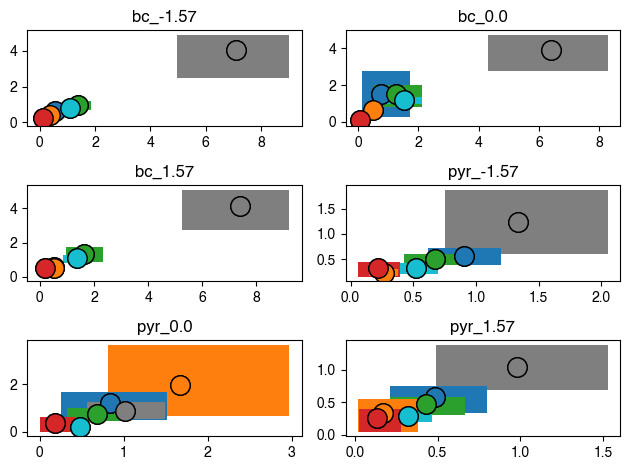

In [11]:

def get_importance(mylist):
    'unique gets unique and sorts'
    if all(mylist==0):
        return np.full(len(mylist),np.nan)
    u,idx = np.unique(mylist,return_inverse=True)
    if max(idx)<(len(mylist)-1):
        idx += len(mylist)-1-max(idx)
    idx_0 = mylist==0
    idx[idx_0]=0
    return idx
dfOI_str = 'vta_df'
if dfOI_str=='vta_df':
    dfOI = vta_df
    columnsOI=['surf_avg','EETsimidx', 'mua_eet', 'redus_eet','Gmax_eet', 'cell_eet', 'loc_eet', 'roll_eet','opsinlocations','number','celltype','theta_0','level','dur']
    labels_eet = ['mua_eet',	'redus_eet',	'Gmax_eet', 'cell_eet', 'loc_eet','roll_eet']
else:
    dfOI = vta_df_nocellloc # vta_df
    columnsOI=['surf_avg','EETsimidx', 'mua_eet', 'redus_eet','Gmax_eet', 'roll_eet','opsinlocations','number','celltype','theta_0','level','dur']
    labels_eet = ['mua_eet',	'redus_eet',	'Gmax_eet',	'roll_eet']

EETs = {}
idx = -1

fig,axs = plt.subplots(3,2, tight_layout=True)
for ctth,ax in zip(unique_values_columns_vta['ct_theta'],axs.ravel()):
    for dur in unique_values_columns_vta['dur']:
        for lvl in unique_values_columns_vta['level']:

            intm_df = dfOI.loc[selection_generator(dfOI,unique_values_columns_vta,dur=dur,level=lvl,ct_theta=ctth),columnsOI].copy()
            intm_df = intm_df.sort_values(by=['EETsimidx'])

            X = intm_df[labels_eet].values
            Y = intm_df['surf_avg'].values
            xmin = np.min(X,axis=0)
            xmax = np.max(X,axis=0)
            mi, sigma, EE, mi_sd, sigma_sd, mi_lb, sigma_lb, mi_ub, sigma_ub, mi_all, sigma_all = EET_indices(r, xmin, xmax, X, Y, design_type='radial', Nboot=1000)

            order_mean = get_importance(mi)
            order_std = get_importance(sigma)

            for i,label in enumerate(labels_eet):
                idx+=1
                EETs[idx] = dict(mi=mi[i], sigma=sigma[i], EE=EE[:,i], mi_sd=mi_sd[i], sigma_sd=sigma_sd[i], mi_lb=mi_lb[i], sigma_lb=sigma_lb[i], mi_ub=mi_ub[i], sigma_ub=sigma_ub[i], mi_all=mi_all[i], sigma_all=sigma_all[i], order_mean=order_mean[i],order_std=order_std[i], label=label, dur=dur, level=lvl, celltype = intm_df['celltype'].iloc[0],theta_0 = intm_df['theta_0'].iloc[0], number = intm_df['number'].iloc[0])
    EET_plot(mi,sigma,labels_eet,mi_lb,mi_ub,sigma_lb,sigma_ub,ax=ax,clrs=EET_pallete)
    ax.set_title(ctth)
EET_surfavgdf = pd.DataFrame(EETs).T
EET_surfavgdf=EET_surfavgdf.astype({'mi': 'float','sigma': 'float','order_mean':'float','order_std':'float','label':'str','dur':'float','level':'float'})
EET_surfavgdf['mi_log10'] = np.log10(EET_surfavgdf['mi'])
EET_surfavgdf['std_log10'] = np.log10(EET_surfavgdf['sigma'])
EET_surfavgdf[['mi_log10','std_log10']] = EET_surfavgdf[['mi_log10','std_log10']].replace(-np.inf,np.nan)
print(EET_surfavgdf.describe())
EET_surfavgdf

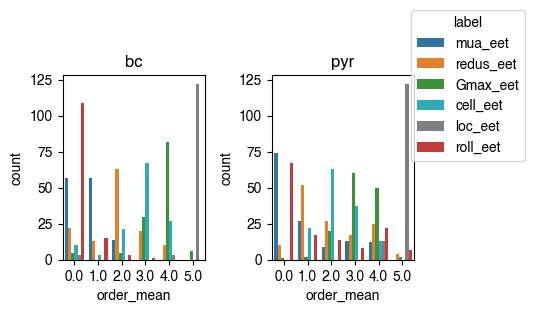

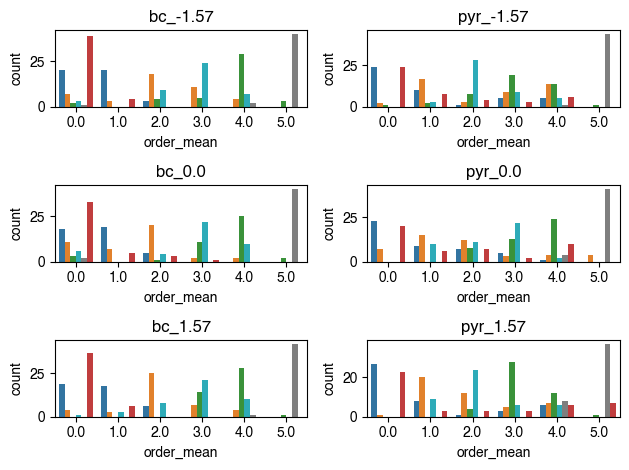

In [40]:
EET_surfavgdf['ct_theta'] = EET_surfavgdf.apply(lambda row: f"{row['celltype']}_{row['theta_0']}", axis=1)
EET_surfavgdf['help_val'] = np.ones(len(EET_surfavgdf))
fig,axs = plt.subplots(1,2,figsize=(6,3))
for celltype,ax in zip(np.sort(unique_values_columns_vta['celltype']),axs.ravel()):
    idx = EET_surfavgdf['celltype'] == celltype
    sns.countplot(EET_surfavgdf[idx],x='order_mean', hue='label', palette=EET_pallete,ax=ax)
    ax.set_title(celltype)
for ax in axs.ravel()[:-1]:
    ax.get_legend().remove()
lgnd = axs[-1].get_legend()
lgnd.set_bbox_to_anchor((0.93,0.5))


fig.tight_layout(rect=[0,0,0.9,1])

fig,axs = plt.subplots(3,2, tight_layout=True)
for ctth,ax in zip(np.sort(unique_values_columns_vta['ct_theta']),axs.T.ravel()):
    idx = EET_surfavgdf['ct_theta'] == ctth
    sns.countplot(EET_surfavgdf[idx],x='order_mean', hue='label', palette=EET_pallete,ax=ax)
    ax.set_title(ctth)
for ax in axs.ravel():
    ax.get_legend().remove()


In [12]:
table = EET_surfavgdf.pivot_table('help_val', index=['celltype','label'], columns=['order_mean'],aggfunc=lambda x:np.round(np.sum(x)/(45*3)*100))
data = table.values
data[np.isnan(data)] = 0
row_labels =  [f"{y}" for x,y in table.index.values]
titles = pd.unique([x for x,y in table.index.values])
column_labels = list(table.columns)
fig, axs = plt.subplots(1,2,figsize=(9/2.54,4/2.54))
axs = np.array([axs])
for i,axrow in enumerate(axs):
    i0 = i*4
    i1 = (i+1)*4
    i0pr = i*4+4
    i1pr = (i+1)*4+4
    heatmap(data=data[i0:i1,:],row_labels=row_labels[i0:i1],col_labels=column_labels, ax=axrow[0])
    heatmap(data=data[i0pr:i1pr,:],row_labels=row_labels[i0pr:i1pr],col_labels=column_labels, ax=axrow[1])
    axrow[0].set_title(titles[0])
    axrow[1].set_title(titles[1])
fig.tight_layout()



KeyError: 'help_val'

[152.  65.  79.  88.  nan  nan]
[71. 54. 77. 87. 90. nan]
[55. 44. 30. nan nan nan]
[13. nan nan nan 83. 94.]
[11.  2. 20. 72. 81. nan]
[ 4. nan  4. 22. 61.  4.]


order_mean           0.0   1.0   2.0   3.0   4.0   5.0
celltype label                                        
bc       Gmax_eet    4.0   NaN   4.0  22.0  61.0   4.0
         cell_eet    7.0   2.0  16.0  50.0  20.0   NaN
         loc_eet     2.0   NaN   NaN   NaN   2.0  90.0
         mua_eet    42.0  42.0  10.0   NaN   NaN   NaN
         redus_eet  16.0  10.0  47.0  15.0   7.0   NaN
         roll_eet   81.0  11.0   2.0   1.0   NaN   NaN
pyr      Gmax_eet    1.0   1.0  15.0  44.0  37.0   1.0
         cell_eet    NaN  16.0  47.0  27.0  10.0   NaN
         loc_eet     NaN   NaN   NaN   NaN  10.0  90.0
         mua_eet    55.0  20.0   7.0  10.0   9.0   NaN
         redus_eet   7.0  39.0  20.0  13.0  19.0   3.0
         roll_eet   50.0  13.0  10.0   6.0  16.0   5.0

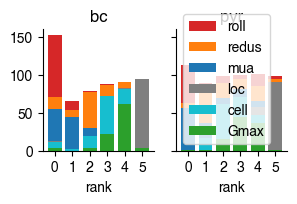

In [ ]:

table = EET_surfavgdf.pivot_table('help_val', index=['celltype','label'], columns=['order_mean'],aggfunc=lambda x:np.round(np.sum(x)/(45*3)*100))
#stacked bar
tablebc = table.T['bc'].T
tablepyr = table.T['pyr'].T
databc = tablebc.cumsum()
datapyr = tablepyr.cumsum()

bclabels = databc.index
pyrlabels = datapyr.index
fig,axs = plt.subplots(1,2,sharey=True,figsize=(8/2.54,4/2.54))
for vals,label in zip(databc.values[-1::-1,:],bclabels[-1::-1]):
    print(vals)
    axs[0].bar(np.arange(6),vals,color=EET_pallete[label])
axs[0].set_title('bc')
for vals,label in zip(datapyr.values[-1::-1,:],pyrlabels[-1::-1]):
    legendlabel = label.split('_',1)[0]
    axs[1].bar(np.arange(6),vals,color=EET_pallete[label],label=legendlabel)
axs[1].set_title('pyr')
for ax in axs:
    ax.spines[['top','right']].set_visible(False)
axs[-1].legend()
axs[0].set_xticks([0,1,2,3,4,5])
axs[1].set_xticks([0,1,2,3,4,5])
axs[0].set_xlabel('rank')
axs[-1].set_xlabel('rank')
fig.savefig('EET_CNS2023.svg',dpi=300)
table


In [43]:
EET_surfavgdf.columns

Index(['mi', 'sigma', 'EE', 'mi_sd', 'sigma_sd', 'mi_lb', 'sigma_lb', 'mi_ub',
       'sigma_ub', 'mi_all', 'sigma_all', 'order_mean', 'order_std', 'label',
       'dur', 'level', 'celltype', 'theta_0', 'number', 'mi_log10',
       'std_log10', 'ct_theta', 'help_val'],
      dtype='object')

In [58]:
test = EET_surfavgdf[['mi','label']].groupby(by='label').mean()
test['mi_med'] = EET_surfavgdf[['mi','label']].groupby(by='label').median()
test['mi_max'] = EET_surfavgdf[['mi','label']].groupby(by='label').max()
test['mi_min'] = EET_surfavgdf[['mi','label']].groupby(by='label').min()
test['mi_std'] = EET_surfavgdf[['mi','label']].groupby(by='label').std()
test

,mi,mi_med,mi_max,mi_min,mi_std
label,,,,,
Gmax_eet,0.416148,0.252623,1.630797,0.0,0.425968
cell_eet,0.341492,0.175434,1.552310,0.0,0.376285
loc_eet,1.334029,0.618359,7.342730,0.0,1.679964
mua_eet,0.202243,0.041408,1.196434,0.0,0.295803
redus_eet,0.271705,0.137344,1.708981,0.0,0.337912
roll_eet,0.108436,0.068608,0.508096,0.0,0.118770


In [61]:
table = EET_surfavgdf.pivot_table(['mi','sigma'], index=['label'],aggfunc=['mean','median','max','min','std'])
table

mean              median                 max            min  \
                 mi     sigma        mi     sigma        mi     sigma   mi   
label                                                                        
Gmax_eet   0.416148  0.277677  0.252623  0.214379  1.630797  1.516460  0.0   
cell_eet   0.341492  0.192758  0.175434  0.122339  1.552310  1.206126  0.0   
loc_eet    1.334029  0.808387  0.618359  0.393251  7.342730  4.127710  0.0   
mua_eet    0.202243  0.202925  0.041408  0.094162  1.196434  1.492463  0.0   
redus_eet  0.271705  0.268352  0.137344  0.204926  1.708981  2.038205  0.0   
roll_eet   0.108436  0.179534  0.068608  0.137757  0.508096  0.726737  0.0   

                      std            
          sigma        mi     sigma  
label                                
Gmax_eet    0.0  0.425968  0.292700  
cell_eet    0.0  0.376285  0.227688  
loc_eet     0.0  1.679964  0.956186  
mua_eet     0.0  0.295803  0.256720  
redus_eet   0.0  0.337912  0.299609  
roll_eet    0.0  0.118770  0.175780

order_mean            0.0   1.0   2.0   3.0   4.0   5.0
ct_theta  label                                        
bc_-1.57  Gmax_eet    4.0   NaN   9.0  11.0  64.0   7.0
          cell_eet    7.0   NaN  20.0  53.0  16.0   NaN
          loc_eet     2.0   NaN   NaN   NaN   4.0  89.0
          mua_eet    44.0  44.0   7.0   NaN   NaN   NaN
          redus_eet  16.0   7.0  40.0  24.0   9.0   NaN
          roll_eet   87.0   9.0   NaN   NaN   NaN   NaN
bc_0.0    Gmax_eet    7.0   NaN   2.0  24.0  56.0   4.0
          cell_eet   13.0   NaN   9.0  49.0  22.0   NaN
          loc_eet     4.0   NaN   NaN   NaN   NaN  89.0
          mua_eet    40.0  42.0  11.0   NaN   NaN   NaN
          redus_eet  24.0  16.0  44.0   4.0   4.0   NaN
          roll_eet   73.0  11.0   7.0   2.0   NaN   NaN
bc_1.57   Gmax_eet    NaN   NaN   NaN  31.0  62.0   2.0
          cell_eet    2.0   7.0  18.0  47.0  22.0   NaN
          loc_eet     NaN   NaN   NaN   NaN   2.0  93.0
          mua_eet    42.0  40.0  13.0   NaN   NaN   NaN
          redus_eet   9.0   7.0  56.0  16.0   9.0   NaN
          roll_eet   82.0  13.0   NaN   NaN   NaN   NaN
pyr_-1.57 Gmax_eet    2.0   4.0  18.0  42.0  31.0   2.0
          cell_eet    NaN   7.0  62.0  20.0  11.0   NaN
          loc_eet     NaN   NaN   NaN   NaN   2.0  98.0
          mua_eet    53.0  22.0   2.0  11.0  11.0   NaN
          redus_eet   4.0  38.0   7.0  20.0  31.0   NaN
          roll_eet   53.0  18.0   9.0   7.0  13.0   NaN
pyr_0.0   Gmax_eet    NaN   NaN  18.0  29.0  53.0   NaN
          cell_eet    NaN  22.0  24.0  49.0   4.0   NaN
          loc_eet     NaN   NaN   NaN   NaN   9.0  91.0
          mua_eet    51.0  20.0  16.0  11.0   2.0   NaN
          redus_eet  16.0  33.0  27.0   7.0   9.0   9.0
          roll_eet   44.0  13.0  16.0   4.0  22.0   NaN
pyr_1.57  Gmax_eet    NaN   NaN   9.0  62.0  27.0   2.0
          cell_eet    NaN  20.0  53.0  13.0  13.0   NaN
          loc_eet     NaN   NaN   NaN   NaN  18.0  82.0
          mua_eet    60.0  18.0   2.0   7.0  13.0   NaN
          redus_eet   2.0  44.0  27.0  11.0  16.0   NaN
          roll_eet   51.0   7.0   7.0   7.0  13.0  16.0

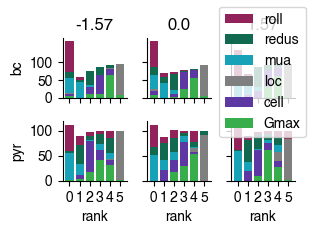

In [48]:

table = EET_surfavgdf.pivot_table('help_val', index=['ct_theta','label'], columns=['order_mean'],aggfunc=lambda x:np.round(np.sum(x)/(45)*100))
idx = table.index.names=='theta_0'
titles = pd.unique([x[idx] for x in table.index.values])
fig,axs = plt.subplots(2,3,sharey='row',sharex=True, figsize=(8/2.54,6/2.54),tight_layout=True)
for i,(title,ax) in enumerate(zip(titles,axs.ravel())):
    table_intm = table.T[title].T
    data_intm = table_intm.cumsum()
    labels = databc.index.values
    for vals,label in zip(data_intm.values[-1::-1,:],labels[-1::-1]):
        if i==0:
            legendlabel = label.split('_',1)[0]
            ax.bar(np.arange(6),vals,color=EET_pallete_paper[label],label=legendlabel)
        else:
            ax.bar(np.arange(6),vals,color=EET_pallete_paper[label])

    ax.spines[['top','right']].set_visible(False)
    ax.set_yticks([0,50,100])
    ax.set_xticks([0,1,2,3,4,5])
    if i>2:
        ax.set_xlabel('rank')
    if i<3:
        ax.set_title(title.split('_')[-1])
    if i in [0,3]:
        ax.set_ylabel(title.split('_')[0])
fig.legend()
fig.savefig('EET_rank.svg',dpi=300)
table

order_std             0.0   1.0   2.0   3.0   4.0   5.0
ct_theta  label                                        
bc_-1.57  Gmax_eet    7.0   NaN   7.0  27.0  49.0   7.0
          cell_eet    7.0  33.0  22.0  31.0   2.0   NaN
          loc_eet     2.0   NaN   NaN   NaN   4.0  89.0
          mua_eet    44.0   9.0  22.0  16.0   4.0   NaN
          redus_eet  16.0  13.0  22.0  13.0  31.0   NaN
          roll_eet   84.0   4.0   2.0   2.0   2.0   NaN
bc_0.0    Gmax_eet    7.0   NaN   2.0   9.0  71.0   4.0
          cell_eet   13.0   7.0  29.0  42.0   2.0   NaN
          loc_eet     4.0   NaN   NaN   NaN   NaN  89.0
          mua_eet    40.0  33.0  13.0   7.0   NaN   NaN
          redus_eet  24.0  20.0  20.0  22.0   7.0   NaN
          roll_eet   73.0   9.0   9.0   NaN   2.0   NaN
bc_1.57   Gmax_eet    NaN   2.0   2.0  24.0  62.0   4.0
          cell_eet    4.0  20.0  31.0  36.0   4.0   NaN
          loc_eet     NaN   NaN   NaN   2.0   2.0  91.0
          mua_eet    47.0  16.0  29.0   4.0   NaN   NaN
          redus_eet  16.0  18.0  16.0  22.0  24.0   NaN
          roll_eet   69.0  11.0   9.0   4.0   2.0   NaN
pyr_-1.57 Gmax_eet   18.0  18.0  18.0  33.0  11.0   2.0
          cell_eet   20.0  29.0  29.0  16.0   7.0   NaN
          loc_eet     NaN   NaN   NaN   9.0  13.0  78.0
          mua_eet    51.0   9.0  18.0   9.0  13.0   NaN
          redus_eet   9.0  22.0   9.0   9.0  36.0  16.0
          roll_eet   16.0  11.0  24.0  24.0  20.0   4.0
pyr_0.0   Gmax_eet    NaN   9.0  24.0  47.0  20.0   NaN
          cell_eet   40.0  31.0  24.0   4.0   NaN   NaN
          loc_eet     NaN   NaN   NaN  13.0  18.0  69.0
          mua_eet    47.0  11.0  20.0   4.0  16.0   2.0
          redus_eet  16.0  18.0  13.0   9.0  22.0  22.0
          roll_eet    9.0  20.0  18.0  22.0  24.0   7.0
pyr_1.57  Gmax_eet    4.0  13.0  36.0  24.0  20.0   2.0
          cell_eet   27.0  33.0  27.0  13.0   NaN   NaN
          loc_eet     NaN   NaN   NaN  20.0  24.0  56.0
          mua_eet    56.0  11.0   9.0  11.0  13.0   NaN
          redus_eet   7.0  22.0  16.0  13.0  38.0   4.0
          roll_eet   20.0   9.0  11.0  18.0   4.0  38.0

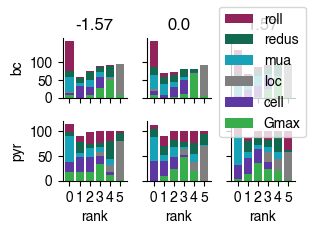

In [50]:
table = EET_surfavgdf.pivot_table('help_val', index=['ct_theta','label'], columns=['order_std'],aggfunc=lambda x:np.round(np.sum(x)/(45)*100))
idx = table.index.names=='theta_0'
titles = pd.unique([x[idx] for x in table.index.values])
fig,axs = plt.subplots(2,3,sharey='row',sharex=True, figsize=(8/2.54,6/2.54),tight_layout=True)
for i,(title,ax) in enumerate(zip(titles,axs.ravel())):
    table_intm = table.T[title].T
    data_intm = table_intm.cumsum()
    labels = databc.index.values
    for vals,label in zip(data_intm.values[-1::-1,:],labels[-1::-1]):
        if i==0:
            legendlabel = label.split('_',1)[0]
            ax.bar(np.arange(6),vals,color=EET_pallete_paper[label],label=legendlabel)
        else:
            ax.bar(np.arange(6),vals,color=EET_pallete_paper[label])

    ax.spines[['top','right']].set_visible(False)
    ax.set_yticks([0,50,100])
    ax.set_xticks([0,1,2,3,4,5])
    if i>2:
        ax.set_xlabel('rank')
    if i<3:
        ax.set_title(title.split('_')[-1])
    if i in [0,3]:
        ax.set_ylabel(title.split('_')[0])
fig.legend()
table

order_mean            0.0   1.0   2.0   3.0   4.0   5.0
ct_theta  label                                        
bc_-1.57  Gmax_eet    4.0   0.0   9.0  11.0  64.0   7.0
          cell_eet    7.0   0.0  20.0  51.0  18.0   0.0
          loc_eet     2.0   0.0   0.0   0.0   4.0  89.0
          mua_eet    44.0  44.0   7.0   0.0   0.0   0.0
          redus_eet  16.0   7.0  40.0  27.0   7.0   0.0
          roll_eet   87.0   9.0   0.0   0.0   0.0   0.0
bc_0.0    Gmax_eet    7.0   0.0   2.0  24.0  56.0   4.0
          cell_eet   13.0   0.0   9.0  49.0  22.0   0.0
          loc_eet     4.0   0.0   0.0   0.0   0.0  89.0
          mua_eet    40.0  42.0  11.0   0.0   0.0   0.0
          redus_eet  24.0  16.0  44.0   4.0   4.0   0.0
          roll_eet   73.0  11.0   7.0   2.0   0.0   0.0
bc_1.57   Gmax_eet    0.0   0.0   0.0  31.0  62.0   2.0
          cell_eet    2.0   7.0  18.0  47.0  22.0   0.0
          loc_eet     0.0   0.0   0.0   0.0   2.0  93.0
          mua_eet    42.0  38.0  16.0   0.0   0.0   0.0
          redus_eet   9.0   9.0  53.0  16.0   9.0   0.0
          roll_eet   82.0  13.0   0.0   0.0   0.0   0.0
pyr_-1.57 Gmax_eet    2.0   4.0  18.0  42.0  31.0   2.0
          cell_eet    0.0   7.0  62.0  20.0  11.0   0.0
          loc_eet     0.0   0.0   0.0   0.0   2.0  98.0
          mua_eet    53.0  22.0   2.0  11.0  11.0   0.0
          redus_eet   4.0  38.0   7.0  20.0  31.0   0.0
          roll_eet   53.0  18.0   9.0   7.0  13.0   0.0
pyr_0.0   Gmax_eet    0.0   0.0  18.0  27.0  56.0   0.0
          cell_eet    0.0  22.0  27.0  49.0   2.0   0.0
          loc_eet     0.0   0.0   0.0   0.0   9.0  91.0
          mua_eet    51.0  20.0  16.0  11.0   2.0   0.0
          redus_eet  16.0  33.0  24.0   9.0   9.0   9.0
          roll_eet   44.0  13.0  16.0   4.0  22.0   0.0
pyr_1.57  Gmax_eet    0.0   0.0   7.0  64.0  27.0   2.0
          cell_eet    0.0  20.0  53.0  13.0  13.0   0.0
          loc_eet     0.0   0.0   0.0   0.0  16.0  84.0
          mua_eet    60.0  18.0   2.0   7.0  13.0   0.0
          redus_eet   2.0  44.0  27.0  11.0  16.0   0.0
          roll_eet   51.0   7.0   9.0   4.0  16.0  13.0

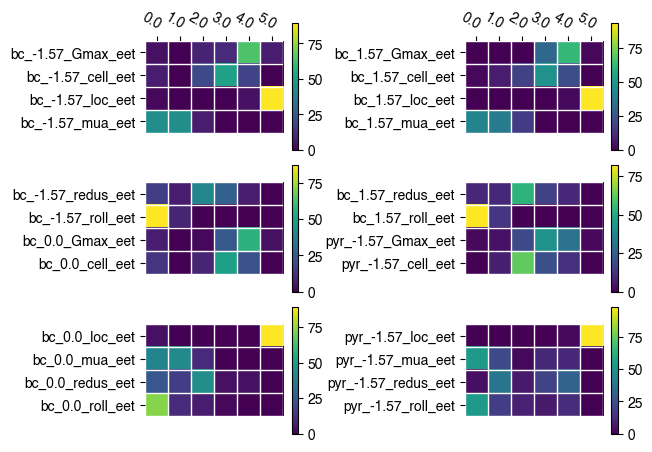

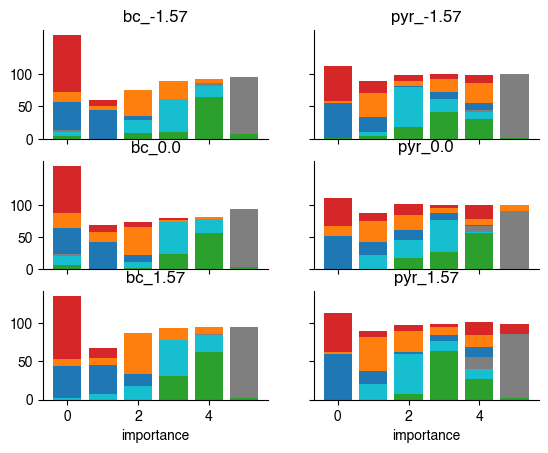

In [21]:


table = EET_surfavgdf.pivot_table('help_val', index=['ct_theta','label'], columns=['order_mean'],aggfunc=lambda x:np.round(np.sum(x)/45*100))
data = table.values
data[np.isnan(data)] = 0
row_labels =  [f"{x}_{y}" for x,y in table.index.values]
column_labels = list(table.columns)
fig, axs = plt.subplots(3,2)
for i,axrow in enumerate(axs):
    i0 = i*4
    i1 = (i+1)*4
    i0pr = i*4+12
    i1pr = (i+1)*4+12
    heatmap(data=data[i0:i1,:],row_labels=row_labels[i0:i1],col_labels=column_labels, ax=axrow[0])
    heatmap(data=data[i0pr:i1pr,:],row_labels=row_labels[i0pr:i1pr],col_labels=column_labels, ax=axrow[1])
table
for ax in axs.ravel()[2:]:
    ax.set_xticks([])
fig.tight_layout(h_pad=0.5, w_pad=2)



idx = table.index.names=='ct_theta'
titles = pd.unique([x[idx] for x in table.index.values])
fig,axs = plt.subplots(3,2,sharey='row',sharex=True)
for i,(title,ax) in enumerate(zip(titles,axs.T.ravel())):
    table_intm = table.T[title].T
    data_intm = table_intm.cumsum()
    labels = databc.index.values
    for vals,label in zip(data_intm.values[-1::-1,:],labels[-1::-1]):

        ax.bar(np.arange(6),vals,color=EET_pallete[label])
    ax.set_title(title)
    ax.spines[['top','right']].set_visible(False)
    ax.set_yticks([0,50,100])
axs[-1,0].set_xlabel('importance')
axs[-1,-1].set_xlabel('importance')
table


c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


Text(0.5, 215.55714129483817, '')

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


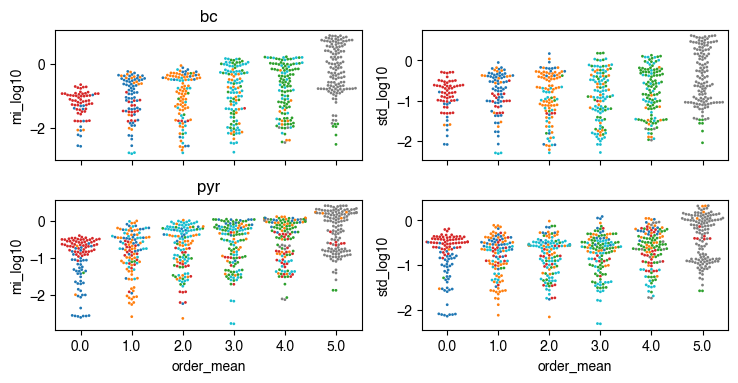

In [22]:
w=2
# When it is important what is it contribution
fig,axs = plt.subplots(2,2, tight_layout=True, figsize=(19/2.54,10/2.54),sharex=True)
for ctth,axrow in zip(np.sort(unique_values_columns_vta['celltype']),axs):
    idx = EET_surfavgdf['celltype'] == ctth
    sns.swarmplot(data=EET_surfavgdf[idx],x='order_mean',y='mi_log10',hue='label',ax=axrow[0],size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_surfavgdf[idx],x='order_mean',y='std_log10',hue='label',ax=axrow[1],size=w, palette=EET_pallete)
    axrow[0].set_title(ctth)
    axrow[0].set_xlim([-0.5,5.5])
    axrow[1].set_xlim([-0.5,5.5])
try:
    for ax in axs.ravel():
        ax.get_legend().remove()
except:
    pass
axs[0,0].set_xlabel(None)
axs[0,1].set_xlabel(None)

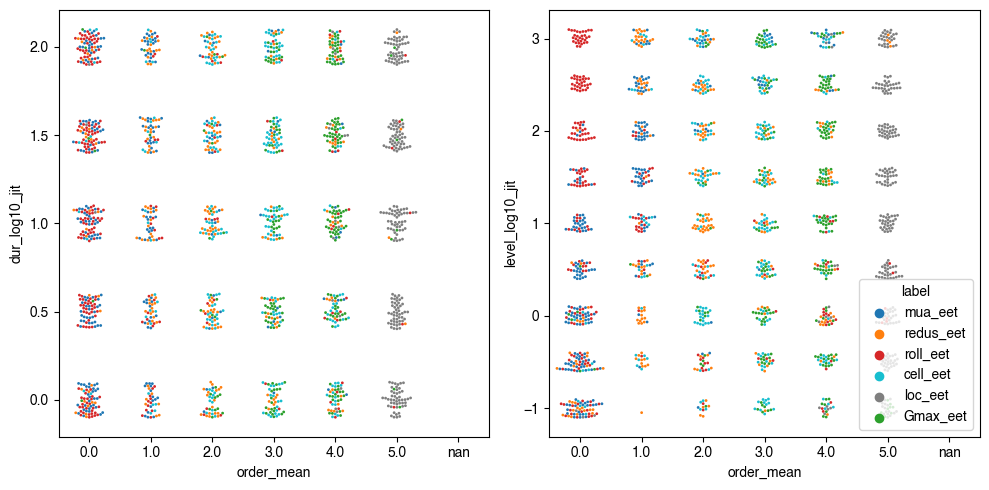

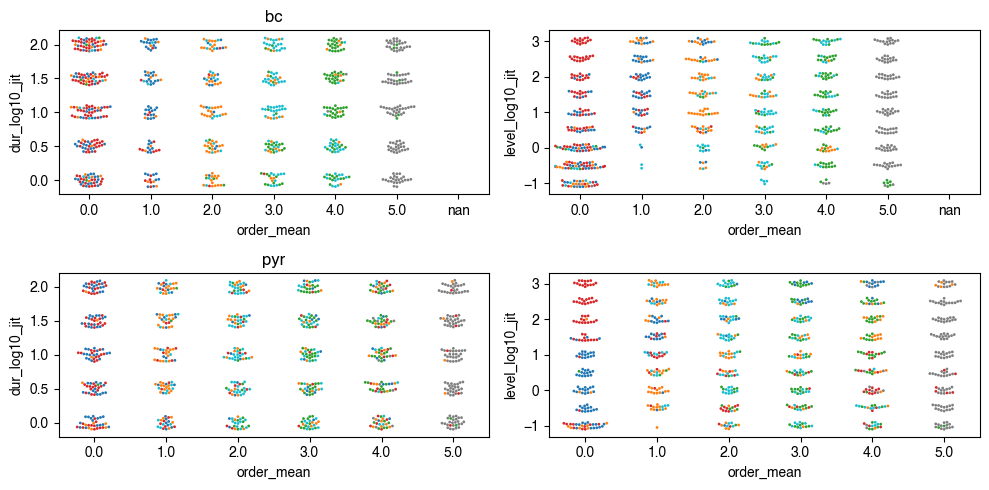

In [23]:
EET_surfavgdf['dur_log10'] = np.log10(EET_surfavgdf['dur'])
EET_surfavgdf['level_log10'] = np.log10(EET_surfavgdf['level'])
w=2
EET_surfavgdf['dur_log10_jit'] = EET_surfavgdf['dur_log10']+(np.random.rand(len(EET_surfavgdf['dur_log10']))-0.5)*0.2
EET_surfavgdf['level_log10_jit'] = EET_surfavgdf['level_log10']+(np.random.rand(len(EET_surfavgdf['level_log10']))-0.5)*0.2
fig,axs = plt.subplots(1,2, tight_layout=True, figsize=(10,5))
axs = np.array([axs])
for ctth,axrow in zip(np.sort(unique_values_columns_vta['ct_theta']),axs):
    sns.swarmplot(data=EET_surfavgdf,x='order_mean',y='dur_log10_jit',hue='label',ax=axrow[0],size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_surfavgdf,x='order_mean',y='level_log10_jit',hue='label',ax=axrow[1],size=w, palette=EET_pallete)
try:
    for ax in axs.ravel()[:-1]:
        ax.get_legend().remove()
except:
    pass

w=2
fig,axs = plt.subplots(2,2, tight_layout=True, figsize=(10,5))
for ctth,axrow in zip(np.sort(unique_values_columns_vta['celltype']),axs):
    idx = EET_surfavgdf['celltype'] == ctth
    sns.swarmplot(data=EET_surfavgdf[idx],x='order_mean',y='dur_log10_jit',hue='label',ax=axrow[0],size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_surfavgdf[idx],x='order_mean',y='level_log10_jit',hue='label',ax=axrow[1],size=w, palette=EET_pallete)
    axrow[0].set_title(ctth)
try:
    for ax in axs.ravel():
        ax.get_legend().remove()
except:
    pass

,mi,sigma,order_mean,order_std,label,setnr
1470,0.000000,0.000000,0.0,0.0,mua_eet,1
1471,0.093088,0.104981,1.0,2.0,redus_eet,1
1472,0.158655,0.202902,3.0,4.0,Gmax_eet,1
1473,0.098000,0.101132,2.0,1.0,cell_eet,1
1474,0.200473,0.151613,4.0,3.0,loc_eet,1
1475,0.245834,0.391332,5.0,5.0,roll_eet,1
1236,0.380344,0.528549,2.0,2.0,mua_eet,2
1237,1.190135,1.102212,5.0,5.0,redus_eet,2
1238,0.511676,0.643615,3.0,3.0,Gmax_eet,2
1239,0.346129,0.249883,1.0,0.0,cell_eet,2


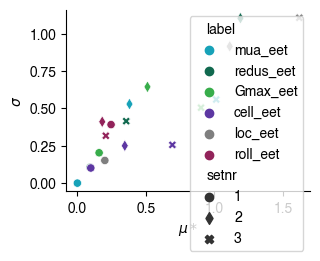

In [24]:
idx1 = (EET_surfavgdf['ct_theta']=='pyr_1.57') & (EET_surfavgdf['dur']==10) & (EET_surfavgdf['level']==1)
set1 = EET_surfavgdf.loc[idx1,['mi', 'sigma','order_mean', 'order_std', 'label']]
set1['setnr'] = 1
idx2 = (EET_surfavgdf['ct_theta']=='pyr_0.0') & (EET_surfavgdf['dur']==10) & (EET_surfavgdf['level']==1000)
set2 = EET_surfavgdf.loc[idx2,['mi', 'sigma','order_mean', 'order_std', 'label']]
set2['setnr'] = 2
idx3 = (EET_surfavgdf['ct_theta']=='pyr_-1.57') & (EET_surfavgdf['dur']==10) & (EET_surfavgdf['level']==1000)
set3 = EET_surfavgdf.loc[idx3,['mi', 'sigma','order_mean', 'order_std', 'label']]
set3['setnr'] = 3
intm_df =pd.concat([set1,set2,set3])
fig,ax = plt.subplots(1,1,figsize=[8/2.54,6/2.54])
sns.scatterplot(intm_df,x='mi',y='sigma',hue='label',palette=EET_pallete_paper,style='setnr',markers=['o','d','X'],ax=ax)
ax.set_ylabel('$\sigma$')
ax.set_xlabel('$\mu*$')
ax.spines[['top','right']].set_visible(False)
fig.savefig('eet_plot_3cases.svg',dpi=300)
intm_df

# EET _bestpos

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,mi,sigma,mi_sd,sigma_sd,mi_lb,sigma_lb,mi_ub,sigma_ub,order_mean,order_std,label,dur,level,celltype,theta_0,number,mi_log10,std_log10
0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,mua_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,redus_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
2,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,Gmax_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
3,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,cell_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
4,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,loc_eet,1.0,0.1,bc,-1.57,1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615,1.573384,2.136795,0.553437,0.650823,0.625843,0.976402,2.798978,3.274037,5.0,5.0,redus_eet,100.0,1000.0,pyr,1.57,1,0.196835,0.329763
1616,0.811967,1.417026,0.416087,0.796329,0.244048,0.238812,1.736515,2.657916,3.0,3.0,Gmax_eet,100.0,1000.0,pyr,1.57,1,-0.090462,0.151378
1617,0.160174,0.224195,0.057976,0.056081,0.055,0.101973,0.281875,0.315951,0.0,0.0,cell_eet,100.0,1000.0,pyr,1.57,1,-0.795409,-0.649375
1618,0.656250,0.706712,0.177904,0.098287,0.31625,0.48066,0.979688,0.860605,2.0,2.0,loc_eet,100.0,1000.0,pyr,1.57,1,-0.182931,-0.150757


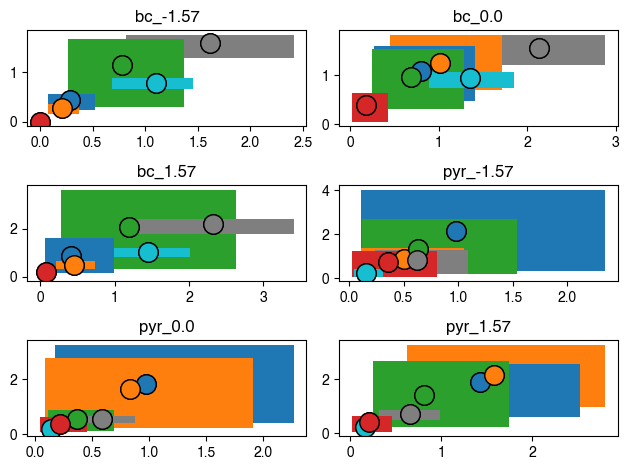

In [13]:
dfOI_str = 'vta_df'
if dfOI_str=='vta_df':
    dfOI = vta_df
    columnsOI=['b_opt_pos_TAC','EETsimidx', 'mua_eet', 'redus_eet','Gmax_eet', 'cell_eet', 'loc_eet', 'roll_eet','opsinlocations','number','celltype','theta_0','level','dur']
    labels_eet = ['mua_eet',	'redus_eet',	'Gmax_eet', 'cell_eet', 'loc_eet','roll_eet']
else:
    dfOI = vta_df_nocellloc # vta_df
    columnsOI=['b_opt_pos_TAC','EETsimidx', 'mua_eet', 'redus_eet','Gmax_eet', 'roll_eet','opsinlocations','number','celltype','theta_0','level','dur']
    labels_eet = ['mua_eet',	'redus_eet',	'Gmax_eet',	'roll_eet']

EETs = {}
idx = -1

fig,axs = plt.subplots(3,2, tight_layout=True)
for ctth,ax in zip(unique_values_columns_vta['ct_theta'],axs.ravel()):
    for dur in unique_values_columns_vta['dur']:
        for lvl in unique_values_columns_vta['level']:

            intm_df = dfOI.loc[selection_generator(dfOI,unique_values_columns_vta,dur=dur,level=lvl,ct_theta=ctth),columnsOI].copy()
            intm_df = intm_df.sort_values(by=['EETsimidx'])

            X = intm_df[labels_eet].values
            Y = intm_df['b_opt_pos_TAC'].values
            Y[np.isnan(Y)] = -2
            xmin = np.min(X,axis=0)
            xmax = np.max(X,axis=0)
            mi, sigma, EE, mi_sd, sigma_sd, mi_lb, sigma_lb, mi_ub, sigma_ub, mi_all, sigma_all = EET_indices(r, xmin, xmax, X, Y, design_type='radial', Nboot=1000)

            order_mean = get_importance(mi)
            order_std = get_importance(sigma)

            for i,label in enumerate(labels_eet):
                idx+=1
                EETs[idx] = dict(mi=mi[i], sigma=sigma[i], mi_sd=mi_sd[i], sigma_sd=sigma_sd[i], mi_lb=mi_lb[i], sigma_lb=sigma_lb[i], mi_ub=mi_ub[i], sigma_ub=sigma_ub[i], order_mean=order_mean[i],order_std=order_std[i], label=label, dur=dur, level=lvl, celltype = intm_df['celltype'].iloc[0],theta_0 = intm_df['theta_0'].iloc[0], number = intm_df['number'].iloc[0])
    EET_plot(mi,sigma,labels_eet,mi_lb,mi_ub,sigma_lb,sigma_ub,ax=ax,clrs=EET_pallete)
    ax.set_title(ctth)
EET_bestposdf = pd.DataFrame(EETs).T
EET_bestposdf=EET_bestposdf.astype({'mi': 'float','sigma': 'float','order_mean':'float','order_std':'float','label':'str','dur':'float','level':'float'})
EET_bestposdf['mi_log10'] = np.log10(EET_bestposdf['mi'])
EET_bestposdf['std_log10'] = np.log10(EET_bestposdf['sigma'])
EET_bestposdf[['mi_log10','std_log10']] = EET_bestposdf[['mi_log10','std_log10']].replace(-np.inf,np.nan)
EET_bestposdf

In [28]:
EET_bestposdf.to_csv('test.csv')

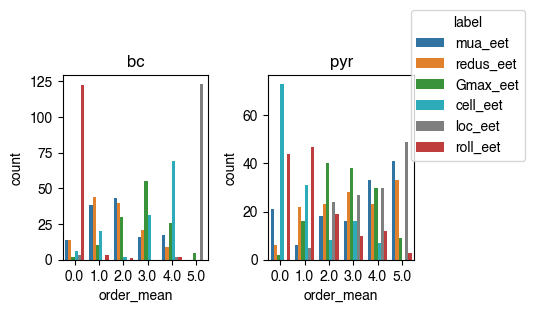

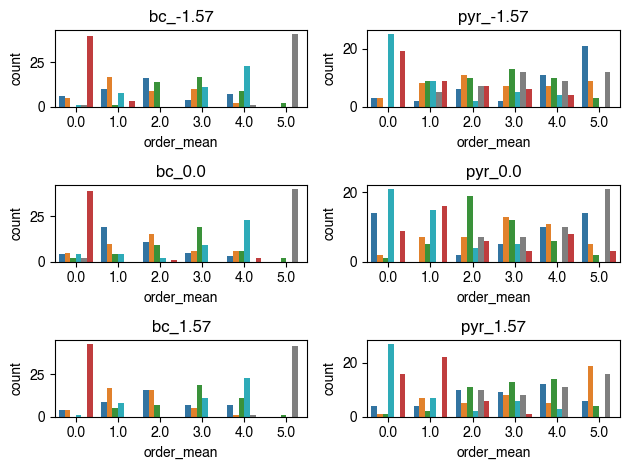

In [14]:
EET_bestposdf['ct_theta'] = EET_bestposdf.apply(lambda row: f"{row['celltype']}_{row['theta_0']}", axis=1)
EET_bestposdf['help_val'] = np.ones(len(EET_bestposdf))
fig,axs = plt.subplots(1,2,figsize=(6,3))
for celltype,ax in zip(np.sort(unique_values_columns_vta['celltype']),axs.ravel()):
    idx = EET_bestposdf['celltype'] == celltype
    sns.countplot(EET_bestposdf[idx],x='order_mean', hue='label', palette=EET_pallete,ax=ax)
    ax.set_title(celltype)
for ax in axs.ravel()[:-1]:
    ax.get_legend().remove()
lgnd = axs[-1].get_legend()
lgnd.set_bbox_to_anchor((0.93,0.5))


fig.tight_layout(rect=[0,0,0.9,1])

fig,axs = plt.subplots(3,2, tight_layout=True)
for ctth,ax in zip(np.sort(unique_values_columns_vta['ct_theta']),axs.T.ravel()):
    idx = EET_bestposdf['ct_theta'] == ctth
    sns.countplot(EET_bestposdf[idx],x='order_mean', hue='label', palette=EET_pallete,ax=ax)
    ax.set_title(ctth)
for ax in axs.ravel():
    ax.get_legend().remove()

order_mean            0.0   1.0   2.0   3.0   4.0   5.0
ct_theta  label                                        
bc_-1.57  Gmax_eet    NaN   2.0  31.0  38.0  20.0   4.0
          cell_eet    2.0  18.0   NaN  24.0  51.0   NaN
          loc_eet     2.0   NaN   NaN   NaN   2.0  91.0
          mua_eet    13.0  22.0  36.0   9.0  16.0   NaN
          redus_eet  11.0  38.0  20.0  22.0   4.0   NaN
          roll_eet   89.0   7.0   NaN   NaN   NaN   NaN
bc_0.0    Gmax_eet    4.0   9.0  20.0  42.0  13.0   4.0
          cell_eet    9.0   9.0   4.0  20.0  51.0   NaN
          loc_eet     4.0   NaN   NaN   NaN   NaN  89.0
          mua_eet     9.0  42.0  24.0  11.0   7.0   NaN
          redus_eet  11.0  22.0  33.0  13.0  13.0   NaN
          roll_eet   87.0   NaN   2.0   NaN   4.0   NaN
bc_1.57   Gmax_eet    NaN  11.0  16.0  42.0  24.0   2.0
          cell_eet    2.0  18.0   NaN  24.0  51.0   NaN
          loc_eet     NaN   NaN   NaN   NaN   2.0  93.0
          mua_eet     9.0  20.0  36.0  16.0  16.0   NaN
          redus_eet   9.0  38.0  36.0  11.0   2.0   NaN
          roll_eet   96.0   NaN   NaN   NaN   NaN   NaN
pyr_-1.57 Gmax_eet    NaN  20.0  22.0  29.0  22.0   7.0
          cell_eet   56.0  20.0   4.0  11.0   9.0   NaN
          loc_eet     NaN  11.0  16.0  27.0  20.0  27.0
          mua_eet     7.0   4.0  13.0   4.0  24.0  47.0
          redus_eet   7.0  18.0  24.0  16.0  16.0  20.0
          roll_eet   42.0  20.0  16.0  13.0   9.0   NaN
pyr_0.0   Gmax_eet    2.0  11.0  42.0  27.0  13.0   4.0
          cell_eet   47.0  33.0   9.0  11.0   NaN   NaN
          loc_eet     NaN   NaN  16.0  16.0  22.0  47.0
          mua_eet    31.0   NaN   4.0  11.0  22.0  31.0
          redus_eet   4.0  16.0  16.0  29.0  24.0  11.0
          roll_eet   20.0  36.0  13.0   7.0  18.0   7.0
pyr_1.57  Gmax_eet    2.0   4.0  24.0  29.0  31.0   9.0
          cell_eet   60.0  16.0   4.0  13.0   7.0   NaN
          loc_eet     NaN   NaN  22.0  18.0  24.0  36.0
          mua_eet     9.0   9.0  22.0  20.0  27.0  13.0
          redus_eet   2.0  16.0  11.0  18.0  11.0  42.0
          roll_eet   36.0  49.0  13.0   2.0   NaN   NaN

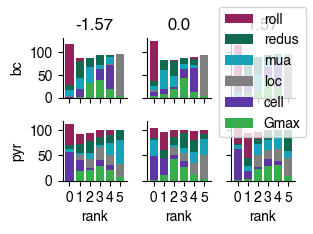

In [15]:

EET_pallete_plot = EET_pallete_paper
table = EET_bestposdf.pivot_table('help_val', index=['ct_theta','label'], columns=['order_mean'],aggfunc=lambda x:np.round(np.sum(x)/(45)*100))
idx = table.index.names=='theta_0'
titles = pd.unique([x[idx] for x in table.index.values])
fig,axs = plt.subplots(2,3,sharey='row',sharex=True, figsize=(8/2.54,6/2.54),tight_layout=True)
for i,(title,ax) in enumerate(zip(titles,axs.ravel())):
    table_intm = table.T[title].T
    data_intm = table_intm.cumsum()
    labels = data_intm.index.values
    for vals,label in zip(data_intm.values[-1::-1,:],labels[-1::-1]):
        if i==0:
            legendlabel = label.split('_',1)[0]
            ax.bar(np.arange(6),vals,color=EET_pallete_plot[label],label=legendlabel)
        else:
            ax.bar(np.arange(6),vals,color=EET_pallete_plot[label])

    ax.spines[['top','right']].set_visible(False)
    ax.set_yticks([0,50,100])
    ax.set_xticks([0,1,2,3,4,5])
    if i>2:
        ax.set_xlabel('rank')
    if i<3:
        ax.set_title(title.split('_')[-1])
    if i in [0,3]:
        ax.set_ylabel(title.split('_')[0])
fig.legend()
fig.savefig('EET_bestposrank.svg',dpi=300)
table

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


Text(0.5, 507.97320647419065, '')

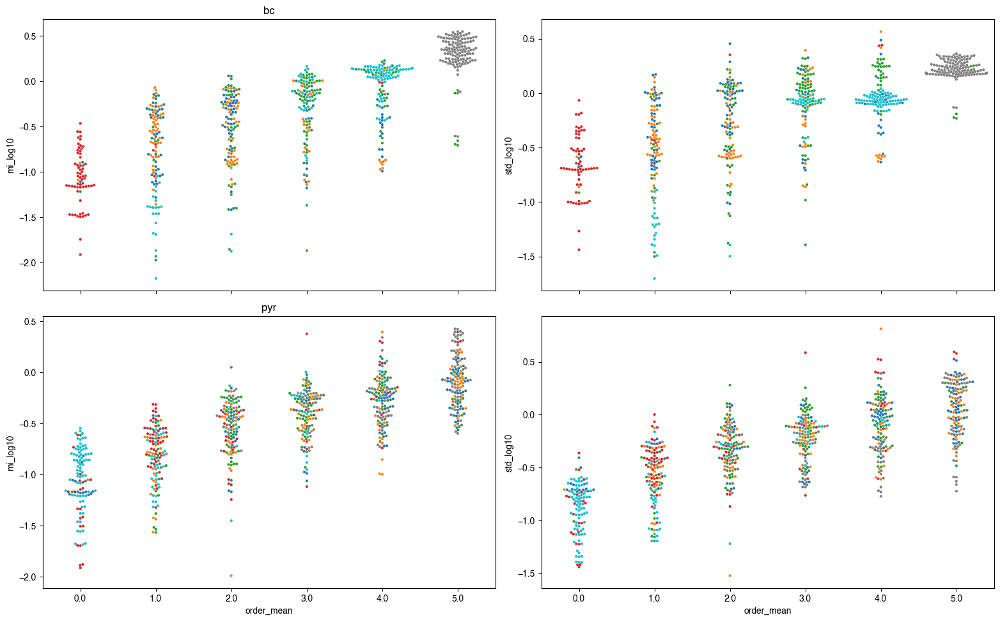

In [16]:

w=3
# When it is important what is it contribution
fig,axs = plt.subplots(2,2, tight_layout=True, figsize=(40/2.54,25/2.54),sharex=True)
for ctth,axrow in zip(np.sort(unique_values_columns_vta['celltype']),axs):
    idx = EET_bestposdf['celltype'] == ctth
    sns.swarmplot(data=EET_bestposdf[idx],x='order_mean',y='mi_log10',hue='label',ax=axrow[0],size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_bestposdf[idx],x='order_mean',y='std_log10',hue='label',ax=axrow[1],size=w, palette=EET_pallete)
    axrow[0].set_title(ctth)
    axrow[0].set_xlim([-0.5,5.5])
    axrow[1].set_xlim([-0.5,5.5])
try:
    for ax in axs.ravel():
        ax.get_legend().remove()
except:
    pass
axs[0,0].set_xlabel(None)
axs[0,1].set_xlabel(None)

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 9.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 9.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rsc

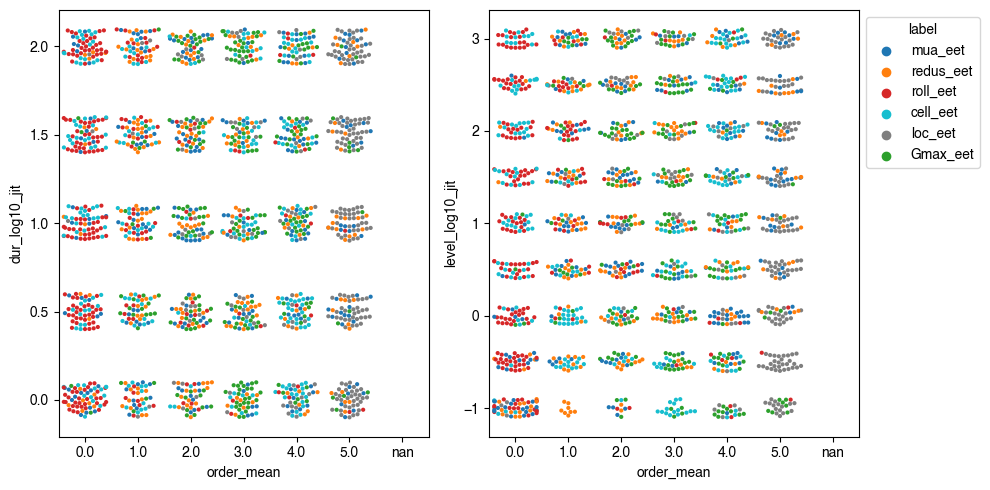

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


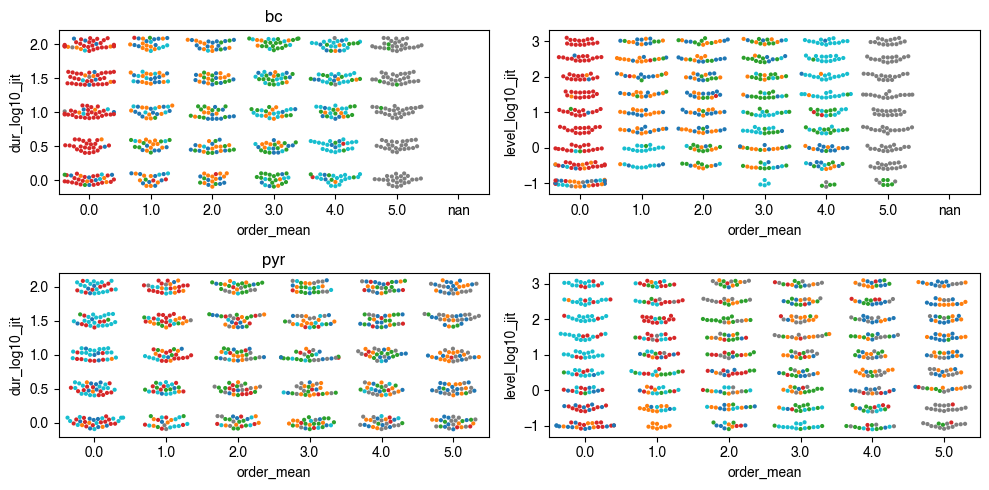

In [17]:
EET_bestposdf['dur_log10'] = np.log10(EET_bestposdf['dur'])
EET_bestposdf['level_log10'] = np.log10(EET_bestposdf['level'])
w=3
EET_bestposdf['dur_log10_jit'] = EET_bestposdf['dur_log10']+(np.random.rand(len(EET_bestposdf['dur_log10']))-0.5)*0.2
EET_bestposdf['level_log10_jit'] = EET_bestposdf['level_log10']+(np.random.rand(len(EET_bestposdf['level_log10']))-0.5)*0.2
fig,axs = plt.subplots(1,2, tight_layout=True, figsize=(10,5))
axs = np.array([axs])
for ctth,axrow in zip(np.sort(unique_values_columns_vta['ct_theta']),axs):
    sns.swarmplot(data=EET_bestposdf,x='order_mean',y='dur_log10_jit',hue='label',ax=axrow[0],size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_bestposdf,x='order_mean',y='level_log10_jit',hue='label',ax=axrow[1],size=w, palette=EET_pallete)
try:
    for ax in axs.ravel()[:-1]:
        ax.get_legend().remove()
except:
    pass
lgd = axs[0,-1].get_legend()
lgd.set_bbox_to_anchor([1,1])

w=3
fig,axs = plt.subplots(2,2, tight_layout=True, figsize=(10,5))
for ctth,axrow in zip(np.sort(unique_values_columns_vta['celltype']),axs):
    idx = EET_bestposdf['celltype'] == ctth
    sns.swarmplot(data=EET_bestposdf[idx],x='order_mean',y='dur_log10_jit',hue='label',ax=axrow[0],size=w, palette=EET_pallete)
    sns.swarmplot(data=EET_bestposdf[idx],x='order_mean',y='level_log10_jit',hue='label',ax=axrow[1],size=w, palette=EET_pallete)
    axrow[0].set_title(ctth)
try:
    for ax in axs.ravel():
        ax.get_legend().remove()
except:
    pass

In [30]:
vta_limit_df['mua_eet'].describe()

count    30240.000000
mean         0.414845
std          0.054796
min          0.323350
25%          0.374158
50%          0.410089
75%          0.450793
max          0.516650
Name: mua_eet, dtype: float64

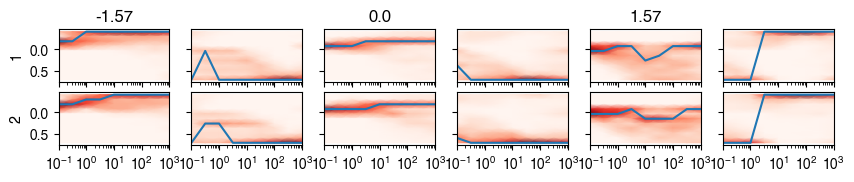

In [31]:
zpos = np.arange(-400,810,110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']

vta_limit_df['selector'] = 1+(vta_limit_df['mua_eet']>0.410089).astype(int)
ukeys = np.sort(vta_limit_df['selector'].unique())
columnsOI = ['b_opt_pos_TAC','w_opt_pos_TAC','dur','opsinlocations','neurontemplate','theta_0','level','Gmax','mua_eet','mus_eet']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['theta_0']==pitch) & (vta_limit_df['selector']==uk)
        intm_df = vta_limit_df.loc[idx,columnsOI]
        b_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        w_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                b_opt_dict[pitch][uk][i,j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                w_opt_dict[pitch][uk][i,j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)

fig,axs = plt.subplots(len(ukeys),6,figsize=(10,1.5),sharex=True,sharey=True)
if len(ukeys)==1:
    axs = np.array([axs])
xX,yY = np.meshgrid(intensities,zpos)
for uk, axrow in zip(ukeys,axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX,yY,b_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk],axis=0)
        axrow[i*2].plot(intensities,zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45,0.750])

        axrow[i*2+1].pcolormesh(xX,yY,w_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk],axis=0)
        axrow[i*2+1].plot(intensities,zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45,0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk==ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0,0].invert_yaxis()


C:\Users\rschoete\AppData\Local\Temp\ipykernel_20888\3915938180.py:35: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict_low[pitch][uk] = b_opt_dict_low[pitch][uk]/np.sum(b_opt_dict_low[pitch][uk],axis=0)
C:\Users\rschoete\AppData\Local\Temp\ipykernel_20888\3915938180.py:36: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict_high[pitch][uk] = b_opt_dict_high[pitch][uk]/np.sum(b_opt_dict_high[pitch][uk],axis=0)


,b_opt_pos_TAC,w_opt_pos_TAC,dur,opsinlocations,neurontemplate,theta_0,level,Gmax,mua_eet,mus_eet
10080,NaN,NaN,1.0,soma,bc_1,1.57,0.100,1.000,0.420000,11.33000
10081,NaN,NaN,1.0,soma,bc_1,1.57,0.316,1.000,0.420000,11.33000
10082,0.15,0.48,1.0,soma,bc_1,1.57,1.000,1.000,0.420000,11.33000
10083,0.15,-0.40,1.0,soma,bc_1,1.57,3.162,1.000,0.420000,11.33000
10084,0.59,-0.40,1.0,soma,bc_1,1.57,10.000,1.000,0.420000,11.33000
...,...,...,...,...,...,...,...,...,...,...
30145,0.04,-0.29,100.0,soma,pyr_2,1.57,10.000,0.867,0.429911,11.06265
30146,0.15,-0.40,100.0,soma,pyr_2,1.57,31.623,0.867,0.429911,11.06265
30147,0.48,-0.29,100.0,soma,pyr_2,1.57,100.000,0.867,0.429911,11.06265
30148,0.15,-0.29,100.0,soma,pyr_2,1.57,316.228,0.867,0.429911,11.06265


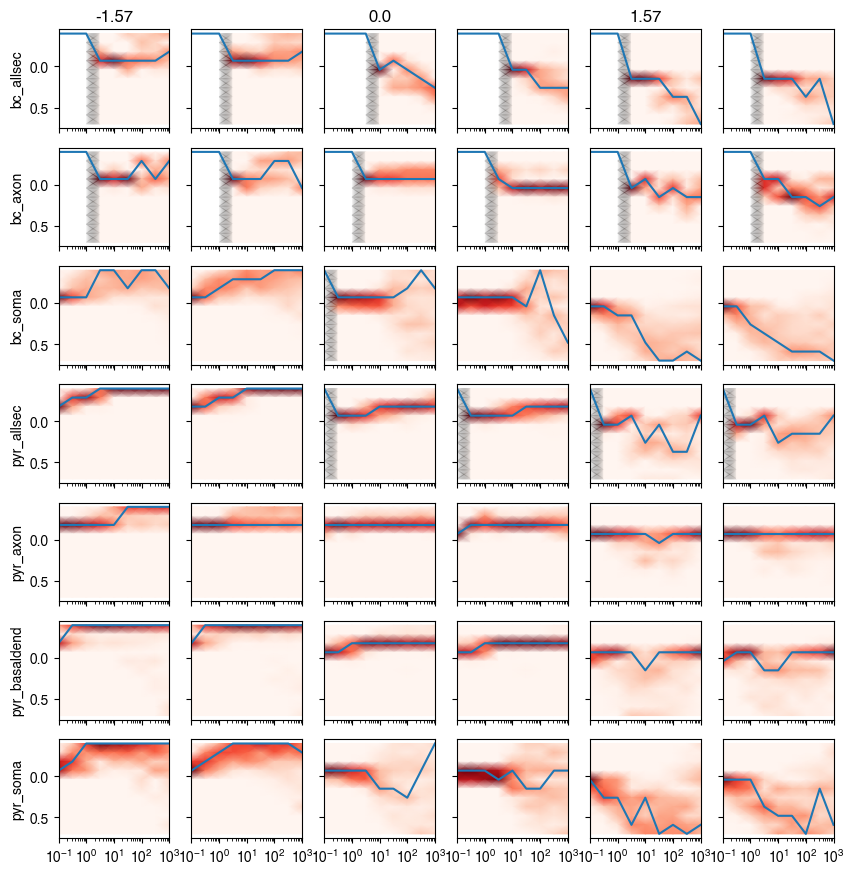

In [35]:
vta_limit_df['mua_group'] = 1+(vta_limit_df['mua_eet']>0.410089).astype(int)
vta_lowmua_df = vta_limit_df[vta_limit_df['mua_group']==1].copy()
vta_highmua_df = vta_limit_df[vta_limit_df['mua_group']==2].copy()
zpos = np.arange(-400,810,110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
vta_lowmua_df['selector'] = vta_lowmua_df.apply(lambda x: f"{x['celltype']}_{x['opsinlocations']}",axis=1)
vta_highmua_df['selector'] = vta_highmua_df.apply(lambda x: f"{x['celltype']}_{x['opsinlocations']}",axis=1)
#vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['opsinlocations']}",axis=1)
ukeys = np.sort(vta_lowmua_df['selector'].unique())
ukeyshigh = np.sort(vta_highmua_df['selector'].unique())
columnsOI = ['b_opt_pos_TAC','w_opt_pos_TAC','dur','opsinlocations','neurontemplate','theta_0','level','Gmax','selector']
b_opt_dict_low = {}
b_opt_dict_high = {}
for pitch in thetas:
    b_opt_dict_low[pitch] = {}
    b_opt_dict_high[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_lowmua_df['selector']==uk) & (vta_lowmua_df['theta_0']==pitch)
        intm_low_df = vta_lowmua_df.loc[idx,columnsOI]
        idx = (vta_highmua_df['selector']==uk) & (vta_highmua_df['theta_0']==pitch)
        intm_high_df = vta_highmua_df.loc[idx,columnsOI]
        b_opt_dict_low[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        b_opt_dict_high[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_low_df['b_opt_pos_TAC']==zp) & (intm_low_df['level']==ity)
                b_opt_dict_low[pitch][uk][i,j] = np.sum(idx)

                idx = (intm_high_df['b_opt_pos_TAC']==zp) & (intm_high_df['level']==ity)
                b_opt_dict_high[pitch][uk][i,j] = np.sum(idx)

for pitch in thetas:
    for uk in ukeys[:]:
        b_opt_dict_low[pitch][uk] = b_opt_dict_low[pitch][uk]/np.sum(b_opt_dict_low[pitch][uk],axis=0)
        b_opt_dict_high[pitch][uk] = b_opt_dict_high[pitch][uk]/np.sum(b_opt_dict_high[pitch][uk],axis=0)








fig,axs = plt.subplots(len(ukeys),6,figsize=(10,1.5*7),sharex=True,sharey=True)
xX,yY = np.meshgrid(intensities,zpos)
for uk, axrow in zip(ukeys,axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX,yY,b_opt_dict_low[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(b_opt_dict_low[theta][uk],axis=0)
        axrow[i*2].plot(intensities,zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45,0.750])

        axrow[i*2+1].pcolormesh(xX,yY,b_opt_dict_high[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(b_opt_dict_high[theta][uk],axis=0)
        axrow[i*2+1].plot(intensities,zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45,0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk==ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0,0].invert_yaxis()
intm_df

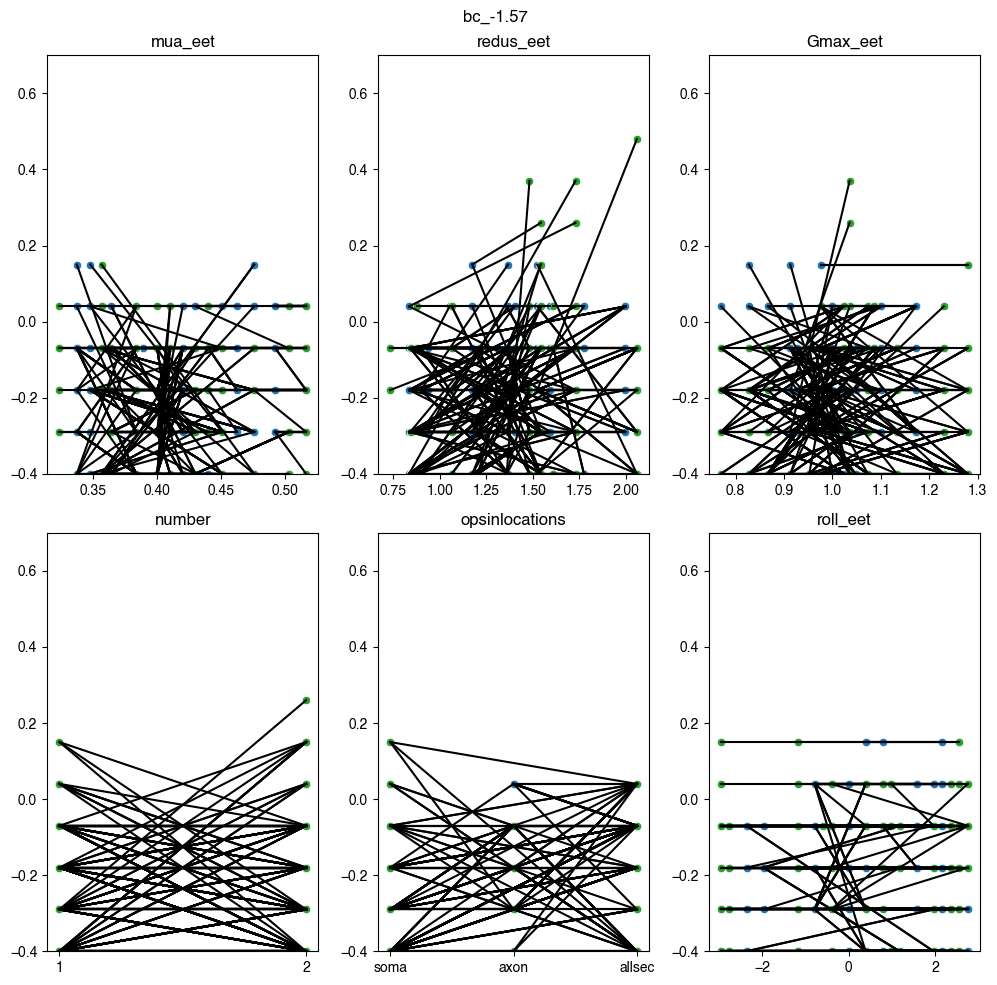

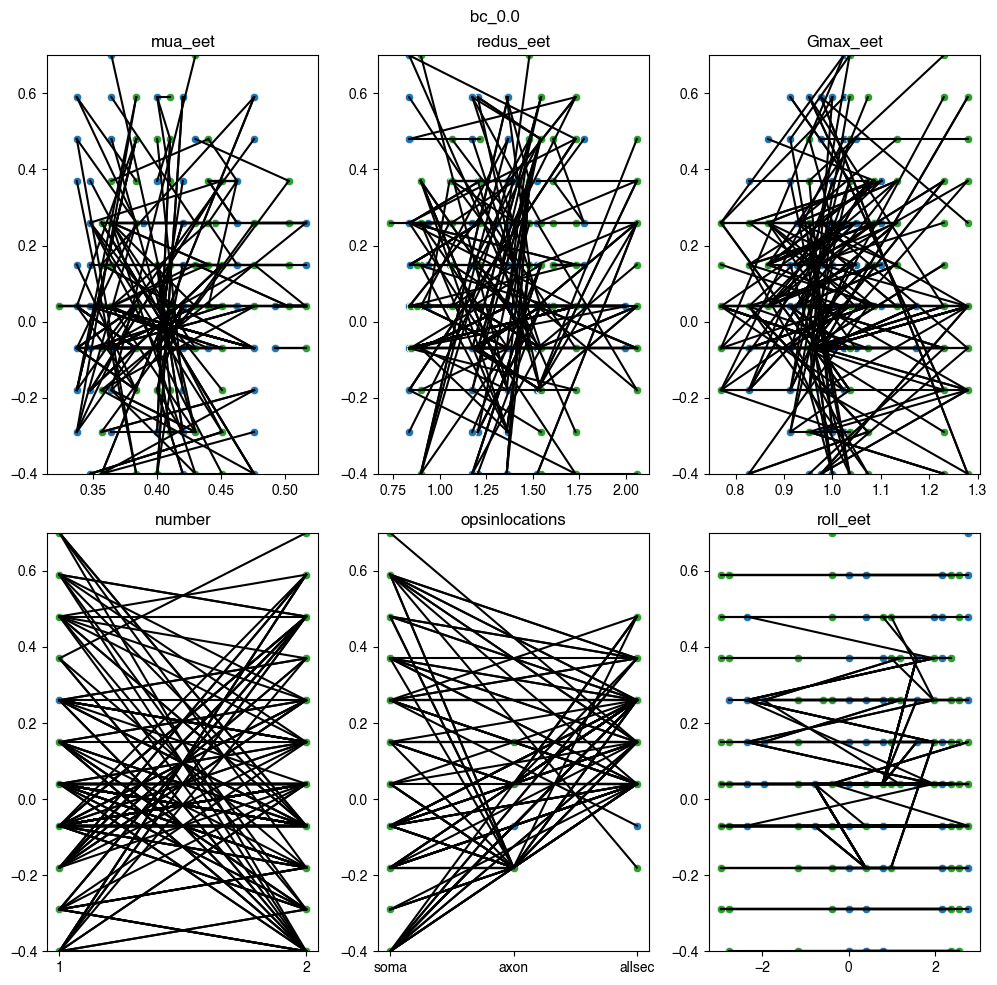

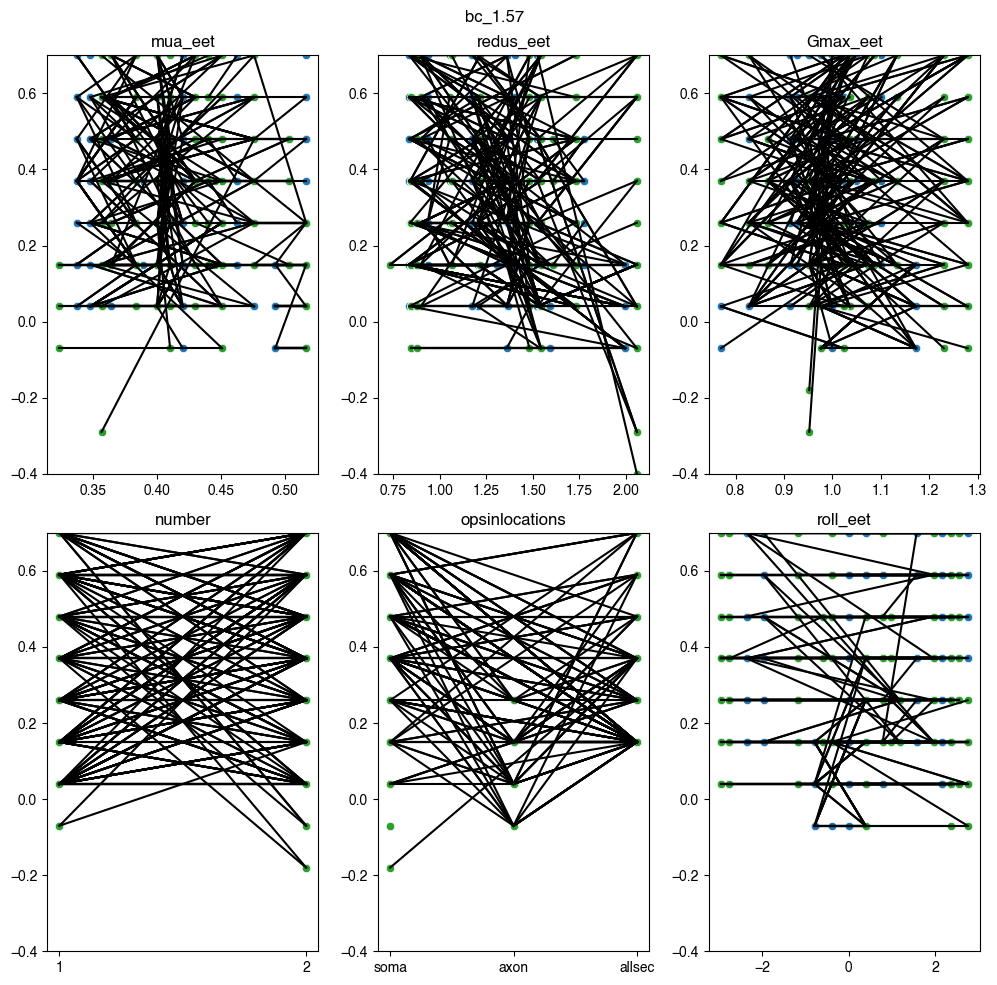

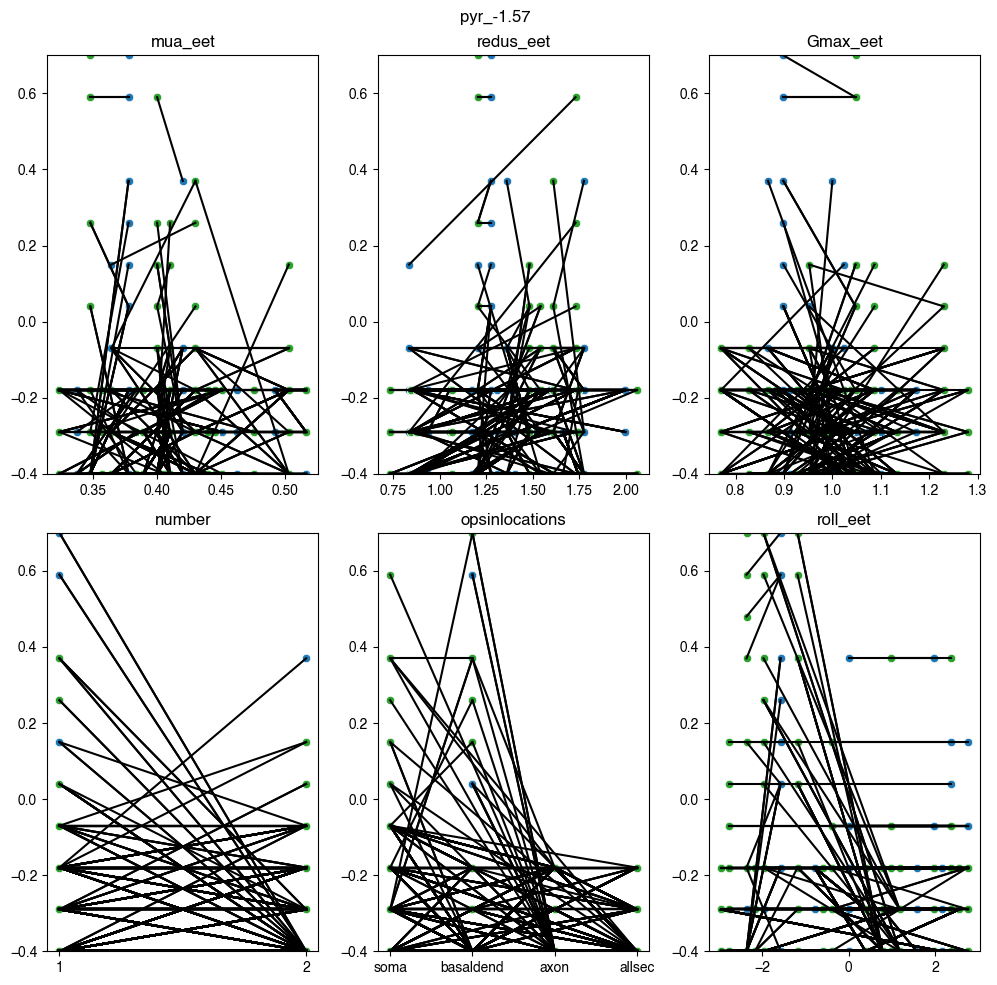

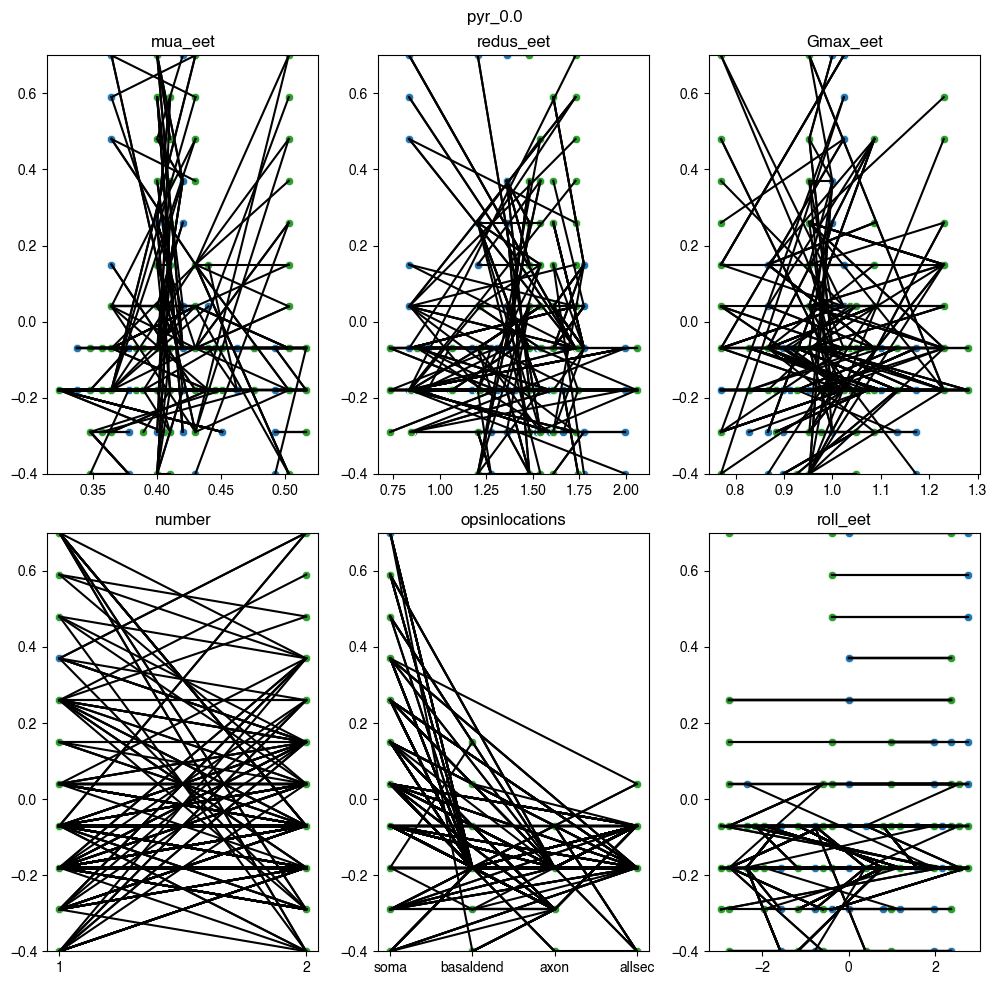

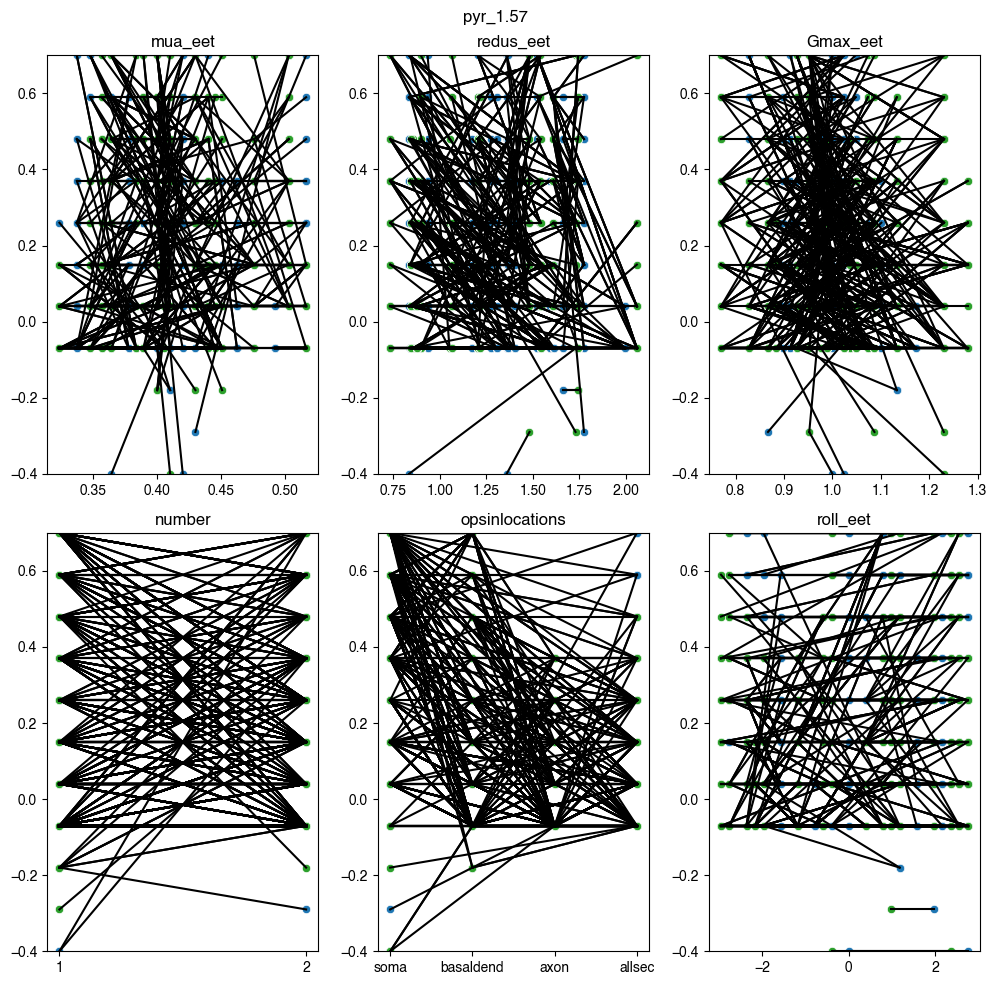

In [37]:

uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet', 'number','opsinlocations', 'roll_eet']

for cth in uct_theta:
    idx_m = (vta_df['ct_theta']==cth) #& (vta_df['level']==10)
    fig,axs = plt.subplots(np.ceil(len(row_strs)/3).astype(int),3, tight_layout=True, figsize=(10,10))
    for i, (r, ax) in enumerate(zip(row_strs,axs.ravel())):
        idx = idx_m & ((vta_df['idx_incluster_eet']==0))
        intm_df1 = vta_df[idx].set_index(['ct_theta','level','dur','cluster_eet'])
        sns.scatterplot(data=vta_df[idx],x=r,y='b_opt_pos_TAC', color='tab:blue', ax=ax)

        idx_2 = idx_m &(vta_df['idx_incluster_eet']==i+1)
        intm_df2 = vta_df[idx_2].set_index(['ct_theta','level','dur','cluster_eet'])
        sns.scatterplot(data=vta_df[idx_2],x=r,y='b_opt_pos_TAC', color='tab:green', ax=ax)
        m_df = pd.merge(intm_df1, intm_df2, left_index=True, right_index = True, suffixes=('_0', '_1'),validate='one_to_many').reset_index()
        data=m_df[[r+'_0',r+'_1','b_opt_pos_TAC_0','b_opt_pos_TAC_1']].values
        for d in data:
            ax.plot(d[0:2],d[2:],'k')



        ax.set_xlabel(None)
        ax.set_ylim([-0.4,0.7])
        ax.set_ylabel(None)
        ax.set_title(r)
    fig.suptitle(cth)

In [42]:
vta_df.columns

Index(['vta_low', 'vta_up', 'surf_low', 'surf_up', 'b_opt_pos',
       'b_opt_pos_TAC', 'w_opt_pos_TAC', 'b_opt_pos_TACamp',
       'w_opt_pos_TACamp', 'dur', 'level', 'theta_0', 'neurontemplate', 'x_0',
       'y_0', 'z_0', 'Gmax', 'opsinlocations', 'phi', 'theta', 'psi', 'phi_0',
       'psi_0', 'celsius', 'dt', 'EETsimidx', 'neurontemplate2', 'celltype',
       'number', 'mua_eet', 'mus_eet', 'g_eet', 'Gmax_eet', 'cell_eet',
       'loc_eet', 'roll_eet', 'settings_str', 'surf_avg', 'vta_low_log10',
       'vta_up_log10', 'surf_low_log10', 'surf_up_log10', 'dur_log10',
       'Gmax_log10', 'level_log10', 'surf_avg_log10', 'ct_theta', 'redus_eet',
       'cluster_eet', 'idx_incluster_eet'],
      dtype='object')

Text(0.5, 0.98, 'pyr_1.57')

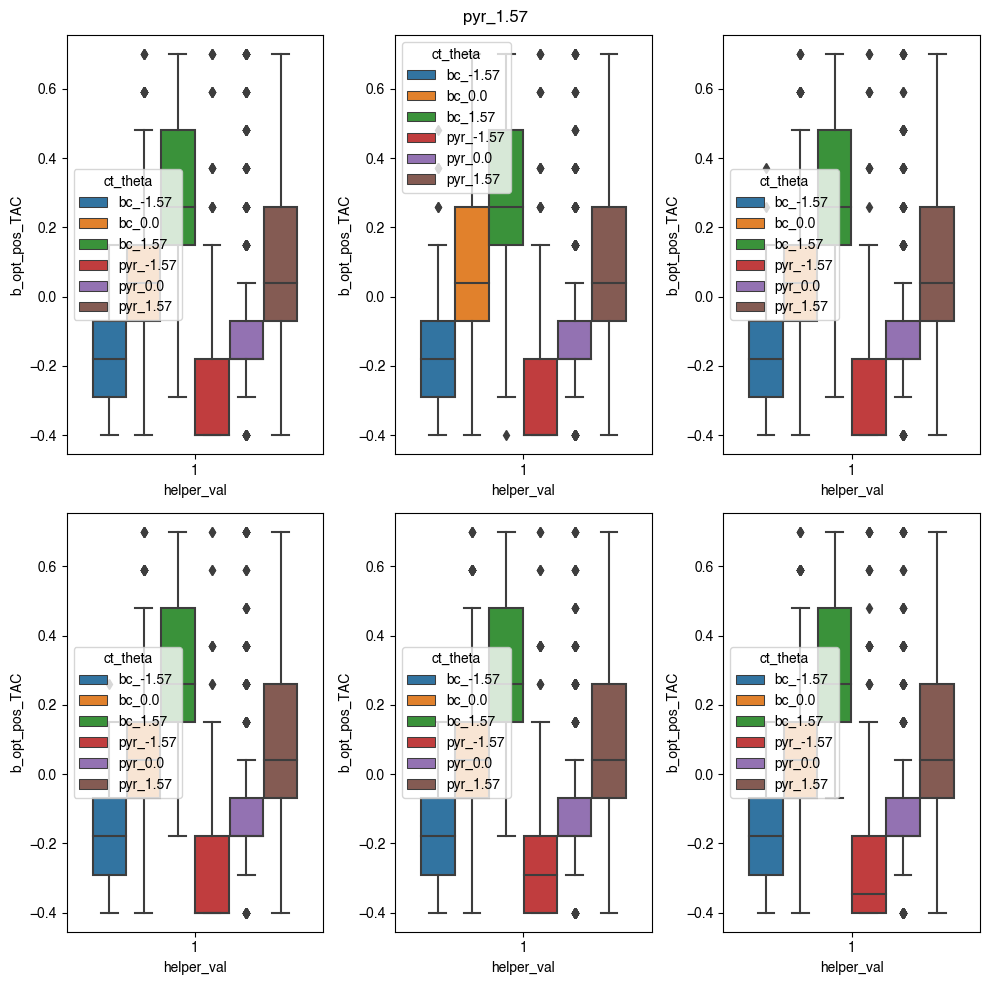

In [44]:
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet', 'number','opsinlocations', 'roll_eet']
vta_df['helper_val'] = 1

fig,axs = plt.subplots(np.ceil(len(row_strs)/3).astype(int),3, tight_layout=True, figsize=(10,10))
for i, (r, ax) in enumerate(zip(row_strs,axs.ravel())):
    idx = (((vta_df['idx_incluster_eet']==0)) | (vta_df['idx_incluster_eet']==i+1)) 
    sns.boxplot(data=vta_df.loc[idx],x='helper_val',y='b_opt_pos_TAC', hue='ct_theta', ax=ax)

fig.suptitle(cth)

Text(0.5, 0.98, 'pyr_1.57')

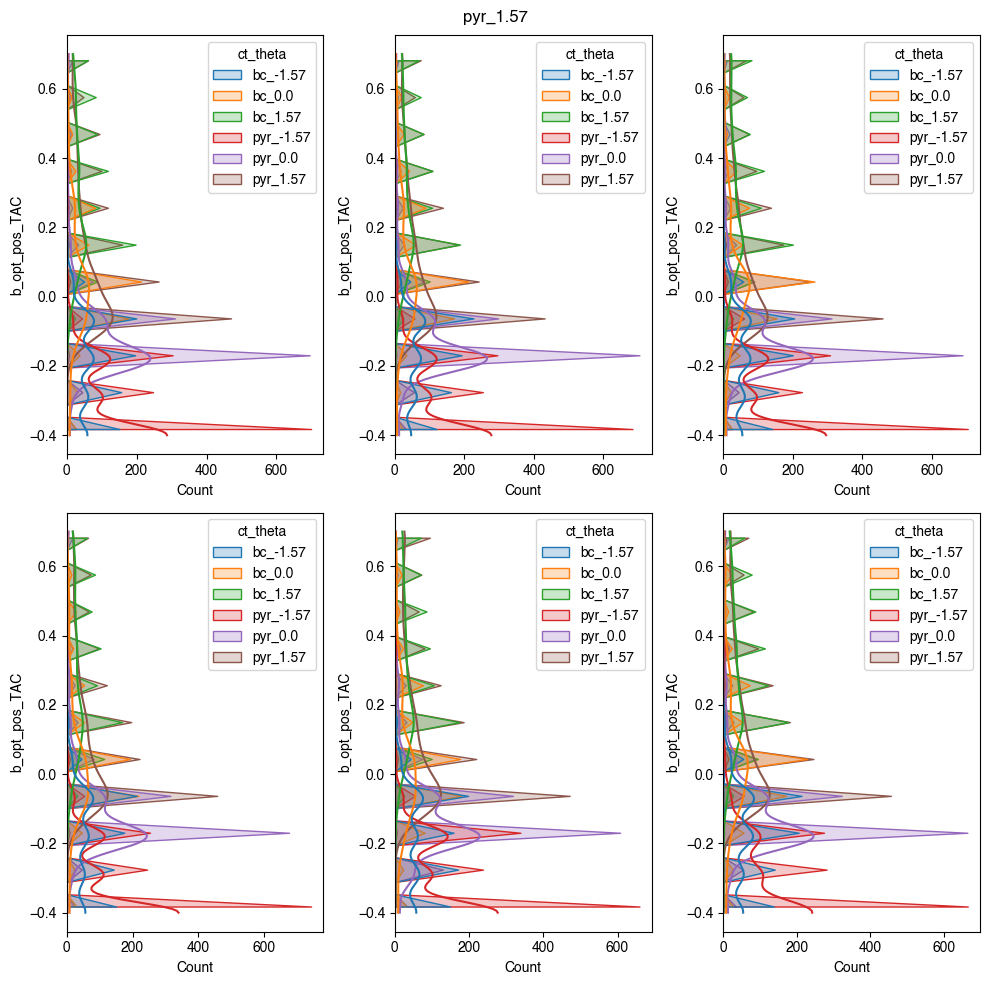

In [47]:
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['mua_eet', 'redus_eet', 'Gmax_eet', 'number','opsinlocations', 'roll_eet']
vta_df['helper_val'] = 1

fig,axs = plt.subplots(np.ceil(len(row_strs)/3).astype(int),3, tight_layout=True, figsize=(10,10))
for i, (r, ax) in enumerate(zip(row_strs,axs.ravel())):
    idx = (((vta_df['idx_incluster_eet']==0)) | (vta_df['idx_incluster_eet']==i+1)) 
    sns.histplot(data=vta_df.loc[idx],y='b_opt_pos_TAC', hue='ct_theta', ax=ax, element="poly",kde=True)

fig.suptitle(cth)


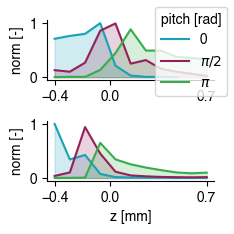

In [18]:
lgdmap = {1.57:'$\pi$',-1.57:'$\pi/2$',0.0:'0'}
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['bc','pyr']
vta_df['helper_val'] = 1
clrs = [EET_pallete_paper['mua_eet'],EET_pallete_paper['roll_eet'],EET_pallete_paper['Gmax_eet']]
fig,axs = plt.subplots(2,1, tight_layout=True,figsize=(6/2.54,6/2.54))
for i, (r, ax) in enumerate(zip(row_strs,axs.ravel())):
    #idx = (((vta_df['idx_incluster_eet']==0)) | (vta_df['idx_incluster_eet']==i+1))
    idx = vta_df['celltype']==r
    data_viz = vta_df[idx].copy()
    data_viz=data_viz.groupby(['theta_0','b_opt_pos_TAC'], as_index=False)['helper_val'].sum()
    mymax = data_viz['helper_val'].max()
    for th, clr in zip(unique_values_columns_vta['theta_0'],clrs):
        idx = data_viz['theta_0']==th
        viz = data_viz[idx]
        ax.plot(viz['b_opt_pos_TAC'], viz['helper_val']/mymax,color=clr)
        ax.fill_between(viz['b_opt_pos_TAC'], viz['helper_val']/mymax,alpha=0.2,color=clr)
        ax.spines[['top','right']].set_visible(False)

        ax.set_xticks([-0.4,0,0.7])
    ax.set_ylabel('norm [-]')
ax.set_xlabel('z [mm]')
for th, clr,lgd in zip(unique_values_columns_vta['theta_0'],clrs,[0,'$\pi/2$','$\pi$']):
    axs[0].plot(np.nan,np.nan,label=lgd,color=clr)
fig.legend(title='pitch [rad]')
fig.savefig('optimalposition_variance_eet.svg',dpi=300)

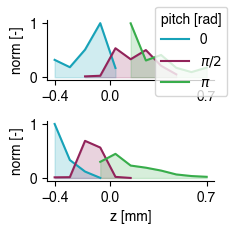

In [19]:
lgdmap = {1.57:'$\pi$',-1.57:'$\pi/2$',0.0:'0'}
uct_theta = vta_limit_df['ct_theta'].unique()
row_strs = ['bc','pyr']
vta_df['helper_val'] = 1
clrs = [EET_pallete_paper['mua_eet'],EET_pallete_paper['roll_eet'],EET_pallete_paper['Gmax_eet']]
fig,axs = plt.subplots(2,1, tight_layout=True,figsize=(6/2.54,6/2.54))
idx_allsec = vta_df['opsinlocations'] == 'allsec'
for i, (r, ax) in enumerate(zip(row_strs,axs.ravel())):
    #idx = (((vta_df['idx_incluster_eet']==0)) | (vta_df['idx_incluster_eet']==i+1))
    idx = vta_df['celltype']==r
    data_viz = vta_df[idx&idx_allsec].copy()
    data_viz=data_viz.groupby(['theta_0','b_opt_pos_TAC'], as_index=False)['helper_val'].sum()
    mymax = data_viz['helper_val'].max()
    for th, clr in zip(unique_values_columns_vta['theta_0'],clrs):
        idx = data_viz['theta_0']==th
        viz = data_viz[idx]
        ax.plot(viz['b_opt_pos_TAC'], viz['helper_val']/mymax,color=clr)
        ax.fill_between(viz['b_opt_pos_TAC'], viz['helper_val']/mymax,alpha=0.2,color=clr)
        ax.spines[['top','right']].set_visible(False)

        ax.set_xticks([-0.4,0,0.7])
    ax.set_ylabel('norm [-]')
ax.set_xlabel('z [mm]')
for th, clr,lgd in zip(unique_values_columns_vta['theta_0'],clrs,[0,'$\pi/2$','$\pi$']):
    axs[0].plot(np.nan,np.nan,label=lgd,color=clr)
fig.legend(title='pitch [rad]')
fig.savefig('optimalposition_variance_allsec_eet.svg',dpi=300)